# EuroSAT Data Analysis

## Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os
from pathlib import Path
from collections import Counter

plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")

%matplotlib inline

## Load dataset

In [2]:
def load_eurosat_dataset(data_dir="data"):
    data_path = Path(data_dir)

    # Get all class directories
    class_dirs = [d for d in data_path.iterdir() if d.is_dir()]
    class_names = sorted([d.name for d in class_dirs])

    print(f"Found {len(class_names)} classes: {class_names}")

    images = []
    labels = []

    # Load images from each class
    for class_idx, class_name in enumerate(class_names):
        class_path = data_path / class_name
        image_files = list(class_path.glob("*.jpg")) + list(class_path.glob("*.png"))

        print(f"Loading {len(image_files)} images from {class_name}...")

        for img_path in image_files:
            try:
                # Load image
                img = Image.open(img_path)
                img_array = np.array(img)

                # Store image and label
                images.append(img_array)
                labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    # Convert to numpy arrays
    data = np.array(images)
    labels = np.array(labels)

    print(f"\nDataset loaded successfully!")
    print(f"Total images           : {len(data)}")
    print(f"Data shape             : {data.shape}")
    print(f"Labels shape           : {labels.shape}")

    return data, labels, class_names


# Load the dataset
data, labels, class_names = load_eurosat_dataset("data")

Found 10 classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
Loading 3000 images from AnnualCrop...
Loading 3000 images from Forest...
Loading 3000 images from HerbaceousVegetation...
Loading 2500 images from Highway...
Loading 2500 images from Industrial...
Loading 2000 images from Pasture...
Loading 2500 images from PermanentCrop...
Loading 3000 images from Residential...
Loading 2500 images from River...
Loading 3000 images from SeaLake...

Dataset loaded successfully!
Total images           : 27000
Data shape             : (27000, 64, 64, 3)
Labels shape           : (27000,)


## Preview dataset

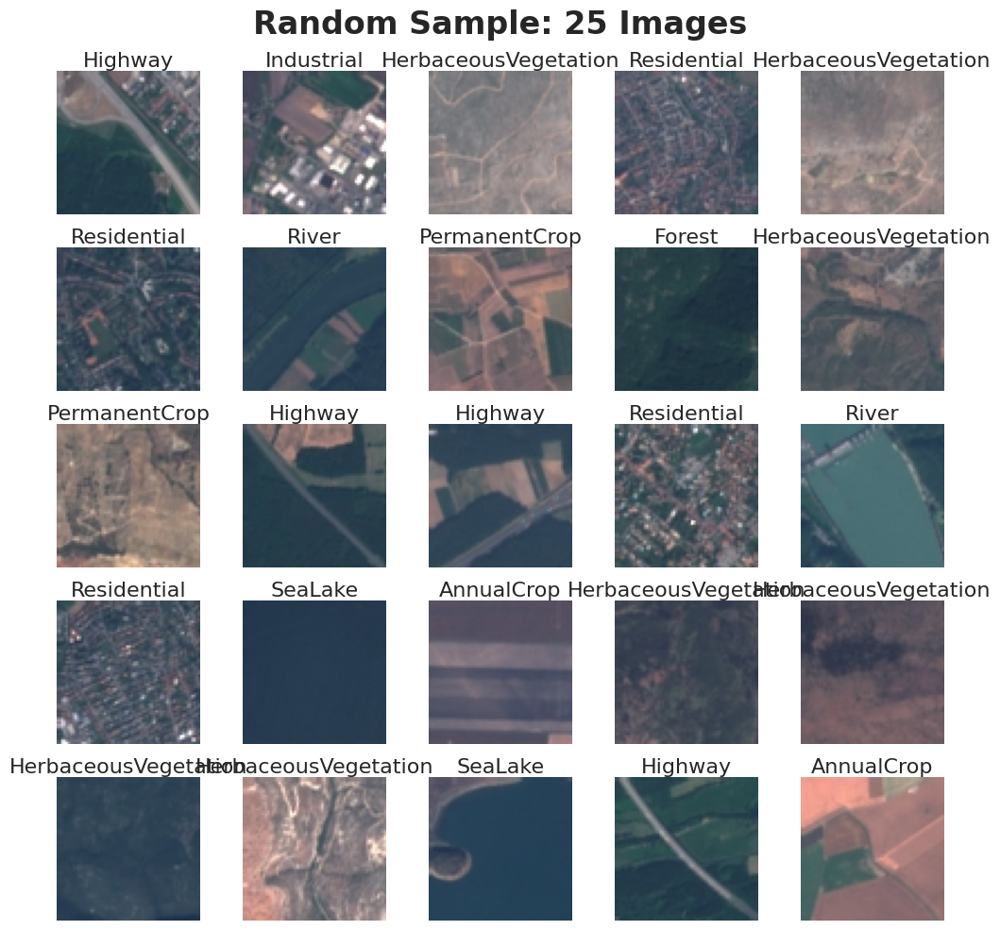

In [3]:
fig, axes = plt.subplots(5, 5, figsize=(10, 10))

random_indices = np.random.choice(len(data), size=25, replace=False)

for i, ax in enumerate(axes.flat):
    idx = random_indices[i]
    img = data[idx]
    label = labels[idx]
    class_name = class_names[label]

    # Display image
    ax.imshow(img)
    ax.set_title(class_name, fontsize=16, pad=3)
    ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle(
    "Random Sample: 25 Images",
    fontsize=24,
    fontweight="bold",
)
plt.show()

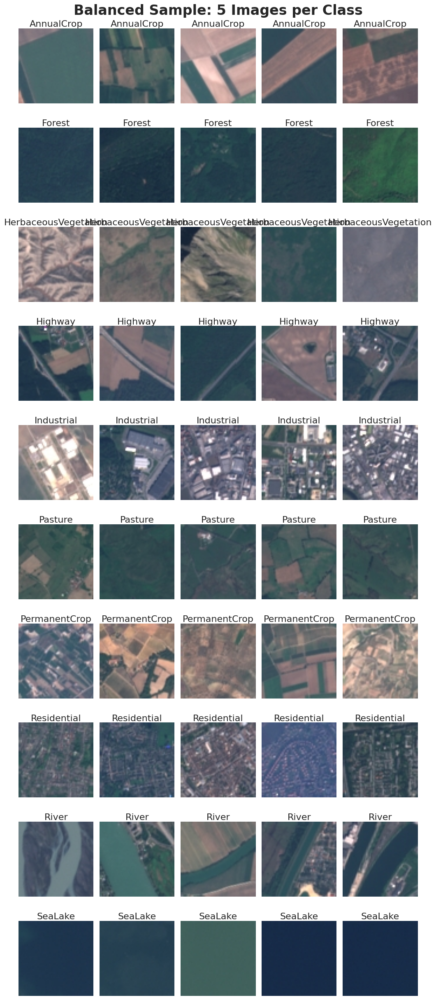

In [4]:
fig, axes = plt.subplots(10, 5, figsize=(10, 25))

sample_count_per_class = 5
selected_indices = []

for class_idx in range(len(class_names)):
    class_mask = labels == class_idx
    class_indices = np.where(class_mask)[0]
    selected = np.random.choice(
        class_indices, size=sample_count_per_class, replace=False
    )
    selected_indices.extend(selected)

# Plot images
for i, ax in enumerate(axes.flat):
    idx = selected_indices[i]
    img = data[idx]
    label = labels[idx]
    class_name = class_names[label]

    # Display image
    ax.imshow(img)
    ax.set_title(class_name, fontsize=16, pad=3)
    ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.975])
plt.suptitle("Balanced Sample: 5 Images per Class", fontsize=24, fontweight="bold")
plt.show()

## Dataset statistics

In [5]:
# Number of samples per class
class_counts = Counter(labels)

for idx, class_name in enumerate(class_names):
    count = class_counts[idx]
    percentage = (count / len(labels)) * 100
    print(f"{class_name:25s}: {count:4d} images ({percentage:4.2f}%)")

AnnualCrop               : 3000 images (11.11%)
Forest                   : 3000 images (11.11%)
HerbaceousVegetation     : 3000 images (11.11%)
Highway                  : 2500 images (9.26%)
Industrial               : 2500 images (9.26%)
Pasture                  : 2000 images (7.41%)
PermanentCrop            : 2500 images (9.26%)
Residential              : 3000 images (11.11%)
River                    : 2500 images (9.26%)
SeaLake                  : 3000 images (11.11%)


In [6]:
# Images statistics
print(f"Total number of images      : {len(data)}")
print(f"Number of classes           : {len(class_names)}")
print(f"Image shape                 : {data[0].shape}")
print(f"Data array shape            : {data.shape}")
print(f"Data array dtype            : {data.dtype}")
print(f"Labels array shape          : {labels.shape}")
print(f"Labels array dtype          : {labels.dtype}")

Total number of images      : 27000
Number of classes           : 10
Image shape                 : (64, 64, 3)
Data array shape            : (27000, 64, 64, 3)
Data array dtype            : uint8
Labels array shape          : (27000,)
Labels array dtype          : int64


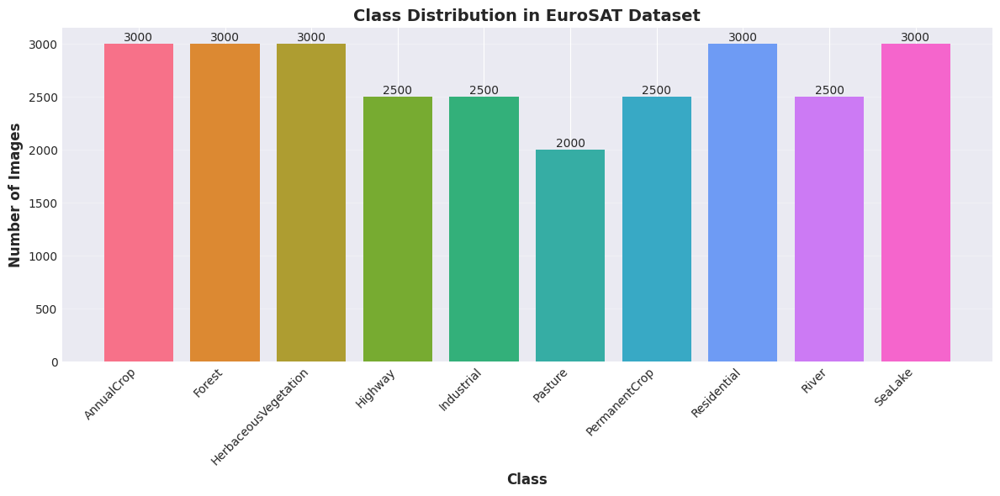

In [7]:
# Class distribution
fig, ax = plt.subplots(figsize=(12, 6))
counts = [class_counts[i] for i in range(len(class_names))]
bars = ax.bar(class_names, counts, color=sns.color_palette("husl", len(class_names)))
ax.set_xlabel("Class", fontsize=12, fontweight="bold")
ax.set_ylabel("Number of Images", fontsize=12, fontweight="bold")
ax.set_title("Class Distribution in EuroSAT Dataset", fontsize=14, fontweight="bold")
plt.xticks(rotation=45, ha="right")
ax.grid(axis="y", alpha=0.3)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2.0,
        height,
        f"{int(height)}",
        ha="center",
        va="bottom",
        fontsize=10,
    )

plt.tight_layout()
plt.show()

## Image analysis

In [8]:
# Image statistics
print(f"Minimum pixel value       : {data.min()}")
print(f"Maximum pixel value       : {data.max()}")
print(f"Mean pixel value          : {data.mean():.2f}")
print(f"Std pixel value           : {data.std():.2f}")
print(f"Median pixel value        : {np.median(data):.2f}")

Minimum pixel value       : 0
Maximum pixel value       : 255
Mean pixel value          : 96.26
Std pixel value           : 40.37
Median pixel value        : 90.00


In [9]:
# Per-channel statistics (assuming RGB)
if data.shape[-1] == 3:
    channels = ["Red", "Green", "Blue"]
    for i, channel in enumerate(channels):
        print(f"\n{channel} Channel:")
        print(f"  Min       : {data[..., i].min()}")
        print(f"  Max       : {data[..., i].max()}")
        print(f"  Mean      : {data[..., i].mean():.2f}")
        print(f"  Std       : {data[..., i].std():.2f}")


Red Channel:
  Min       : 0
  Max       : 255
  Mean      : 87.82
  Std       : 51.68

Green Channel:
  Min       : 3
  Max       : 255
  Mean      : 96.97
  Std       : 34.91

Blue Channel:
  Min       : 5
  Max       : 255
  Mean      : 103.98
  Std       : 29.47


In [10]:
# Brightness
# https://stackoverflow.com/questions/596216/formula-to-determine-perceived-brightness-of-rgb-color
brightness = 0.299 * data[..., 0] + 0.587 * data[..., 1] + 0.114 * data[..., 2]
print(f"Mean brightness           : {brightness.mean():.2f}")
print(f"Std brightness            : {brightness.std():.2f}")
print(f"Min brightness            : {brightness.min():.2f}")
print(f"Max brightness            : {brightness.max():.2f}")

Mean brightness           : 95.03
Std brightness            : 38.67
Min brightness            : 5.12
Max brightness            : 255.00


In [11]:
# Contrast (std of pixel values per image)
# https://stackoverflow.com/questions/52094592/calculate-contrast-of-a-color-imagergb
contrast = data.std(axis=(1, 2, 3))
print(f"Mean contrast             : {contrast.mean():.2f}")
print(f"Std contrast              : {contrast.std():.2f}")
print(f"Min contrast              : {contrast.min():.2f}")
print(f"Max contrast              : {contrast.max():.2f}")

Mean contrast             : 24.07
Std contrast              : 10.11
Min contrast              : 1.94
Max contrast              : 75.59


In [12]:
# Statistics per class
stats_data = []
for idx, class_name in enumerate(class_names):
    class_mask = labels == idx
    class_images = data[class_mask]

    # Calculate brightness for this class
    class_brightness = (
        0.299 * class_images[..., 0]
        + 0.587 * class_images[..., 1]
        + 0.114 * class_images[..., 2]
    )

    # Calculate contrast for this class
    class_contrast = class_images.std(axis=(1, 2, 3))

    stats_data.append(
        {
            "Class": class_name,
            "Count": class_mask.sum(),
            "Mean Pixel": class_images.mean(),
            "Std Pixel": class_images.std(),
            "Mean Brightness": class_brightness.mean(),
            "Std Brightness": class_brightness.std(),
            "Mean Contrast": class_contrast.mean(),
            "Std Contrast": class_contrast.std(),
            "Min Pixel": class_images.min(),
            "Max Pixel": class_images.max(),
        }
    )

stats_df = pd.DataFrame(stats_data)
print(stats_df.round(2).to_string(index=False))

               Class  Count  Mean Pixel  Std Pixel  Mean Brightness  Std Brightness  Mean Contrast  Std Contrast  Min Pixel  Max Pixel
          AnnualCrop   3000      122.26      42.59           122.56           39.40          30.58         10.42         23        255
              Forest   3000       59.93      17.46            58.26            8.10          16.09          1.53         16        228
HerbaceousVegetation   3000      100.28      31.45            99.16           30.73          18.23          8.15         17        255
             Highway   2500       96.03      37.08            94.86           35.29          25.70          7.01          0        255
          Industrial   2500      127.71      49.00           125.82           48.56          42.66          9.14         11        255
             Pasture   2000       81.51      22.88            81.17           15.13          18.51          3.82         14        255
       PermanentCrop   2500      117.39      36.81     

## Color analysis

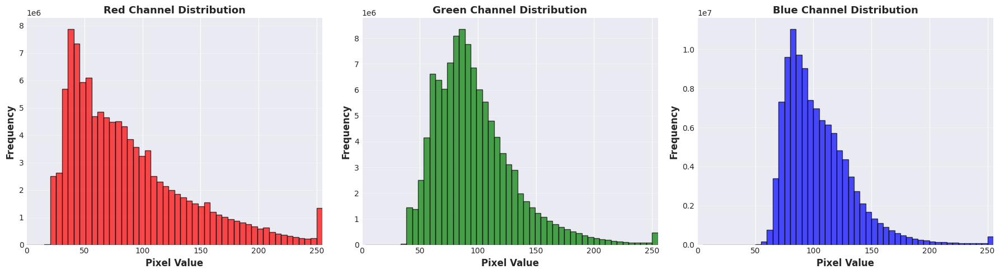

In [13]:
# Color distribution histogram
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
colors = ["red", "green", "blue"]
channels = ["Red", "Green", "Blue"]

for i, (ax, color, channel) in enumerate(zip(axes, colors, channels)):
    ax.hist(data[..., i].flatten(), bins=50, color=color, alpha=0.7, edgecolor="black")
    ax.set_xlabel("Pixel Value", fontsize=12, fontweight="bold")
    ax.set_ylabel("Frequency", fontsize=12, fontweight="bold")
    ax.set_title(f"{channel} Channel Distribution", fontsize=13, fontweight="bold")
    ax.grid(axis="y", alpha=0.3)
    ax.set_xlim(0, 255)

plt.tight_layout()
plt.show()

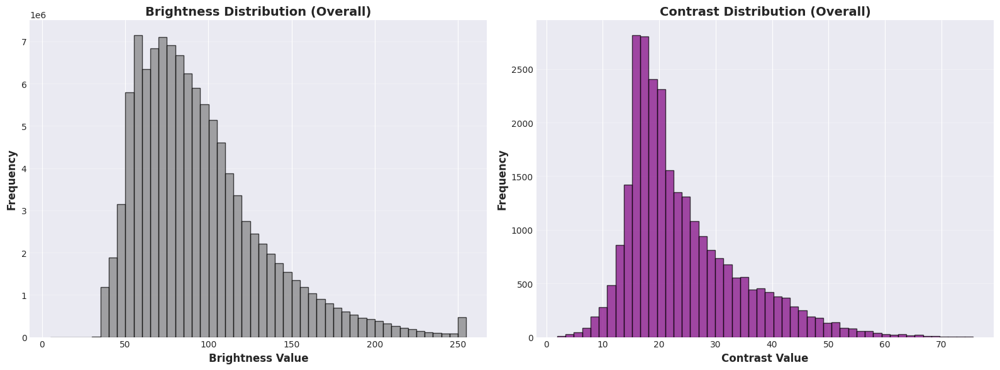

In [14]:
# Brightness and Contrast distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Brightness
axes[0].hist(brightness.flatten(), bins=50, color="gray", alpha=0.7, edgecolor="black")
axes[0].set_xlabel("Brightness Value", fontsize=12, fontweight="bold")
axes[0].set_ylabel("Frequency", fontsize=12, fontweight="bold")
axes[0].set_title("Brightness Distribution (Overall)", fontsize=14, fontweight="bold")
axes[0].grid(axis="y", alpha=0.3)

# Contrast
axes[1].hist(contrast, bins=50, color="purple", alpha=0.7, edgecolor="black")
axes[1].set_xlabel("Contrast Value", fontsize=12, fontweight="bold")
axes[1].set_ylabel("Frequency", fontsize=12, fontweight="bold")
axes[1].set_title("Contrast Distribution (Overall)", fontsize=14, fontweight="bold")
axes[1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

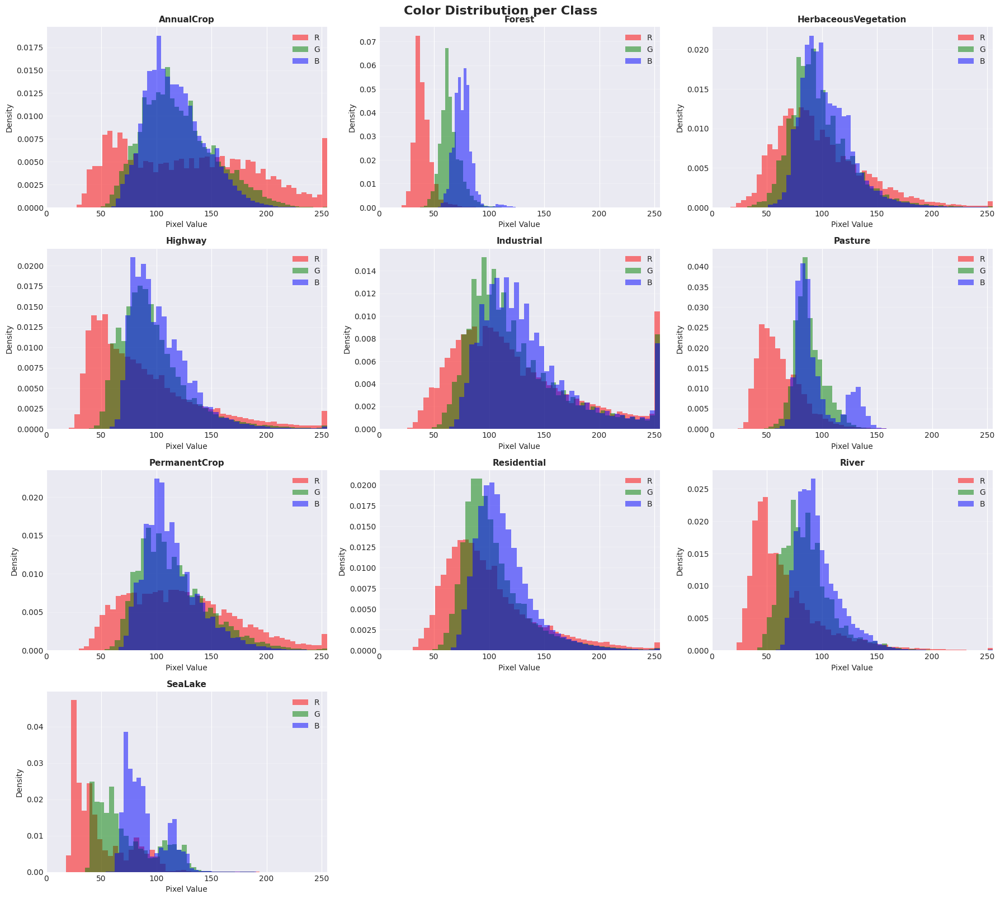

In [15]:
# Per-class color distribution
n_classes = len(class_names)
n_cols = 3
n_rows = (n_classes + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    ax = axes[idx]
    class_mask = labels == idx
    class_images = data[class_mask]

    # Plot RGB histograms for this class
    for i, (color, channel) in enumerate(
        zip(["red", "green", "blue"], ["R", "G", "B"])
    ):
        ax.hist(
            class_images[..., i].flatten(),
            bins=50,
            color=color,
            alpha=0.5,
            label=channel,
            density=True,
        )

    ax.set_xlabel("Pixel Value", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)
    ax.set_title(f"{class_name}", fontsize=11, fontweight="bold")
    ax.legend()
    ax.grid(axis="y", alpha=0.3)
    ax.set_xlim(0, 255)

# Hide unused subplots
for idx in range(n_classes, len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.suptitle("Color Distribution per Class", fontsize=16, fontweight="bold", y=1.002)
plt.show()

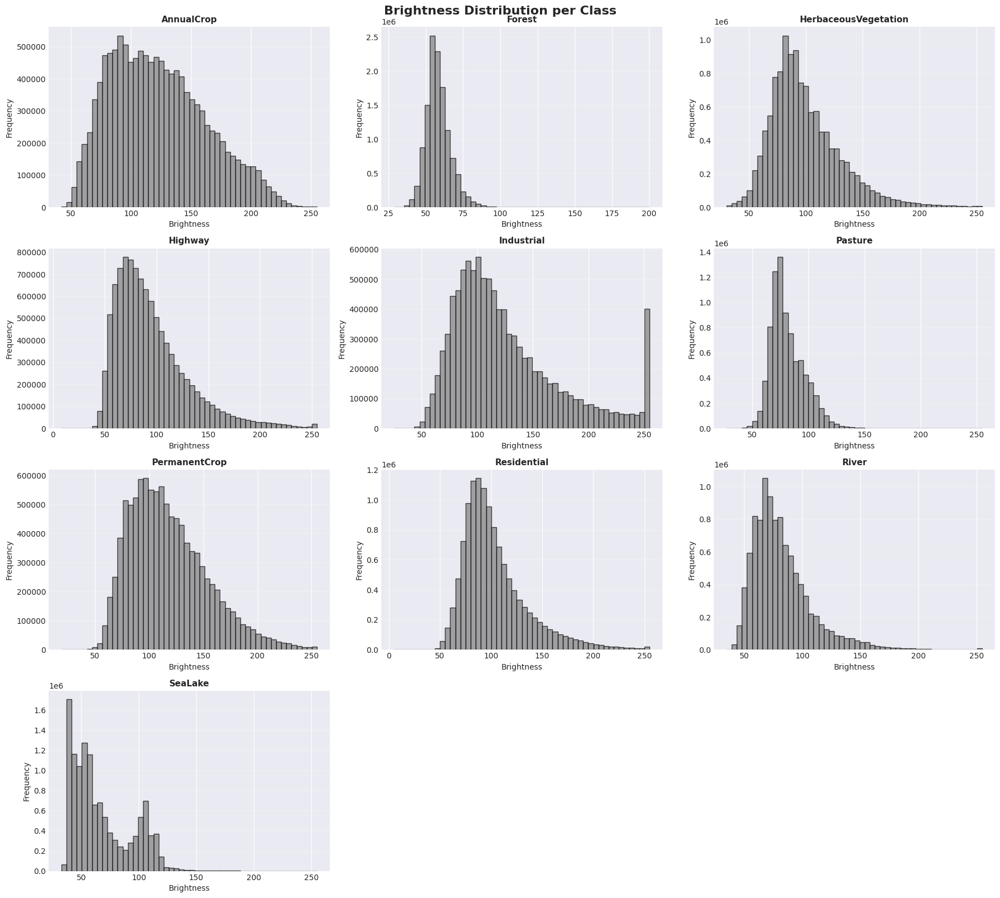

In [16]:
# Brightness distribution per class
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    ax = axes[idx]
    class_mask = labels == idx
    class_images = data[class_mask]

    # Calculate brightness for this class
    class_brightness = (
        0.299 * class_images[..., 0]
        + 0.587 * class_images[..., 1]
        + 0.114 * class_images[..., 2]
    )

    ax.hist(
        class_brightness.flatten(), bins=50, color="gray", alpha=0.7, edgecolor="black"
    )
    ax.set_xlabel("Brightness", fontsize=10)
    ax.set_ylabel("Frequency", fontsize=10)
    ax.set_title(f"{class_name}", fontsize=11, fontweight="bold")
    ax.grid(axis="y", alpha=0.3)

# Hide unused subplots
for idx in range(n_classes, len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.suptitle(
    "Brightness Distribution per Class", fontsize=16, fontweight="bold", y=1.002
)
plt.show()

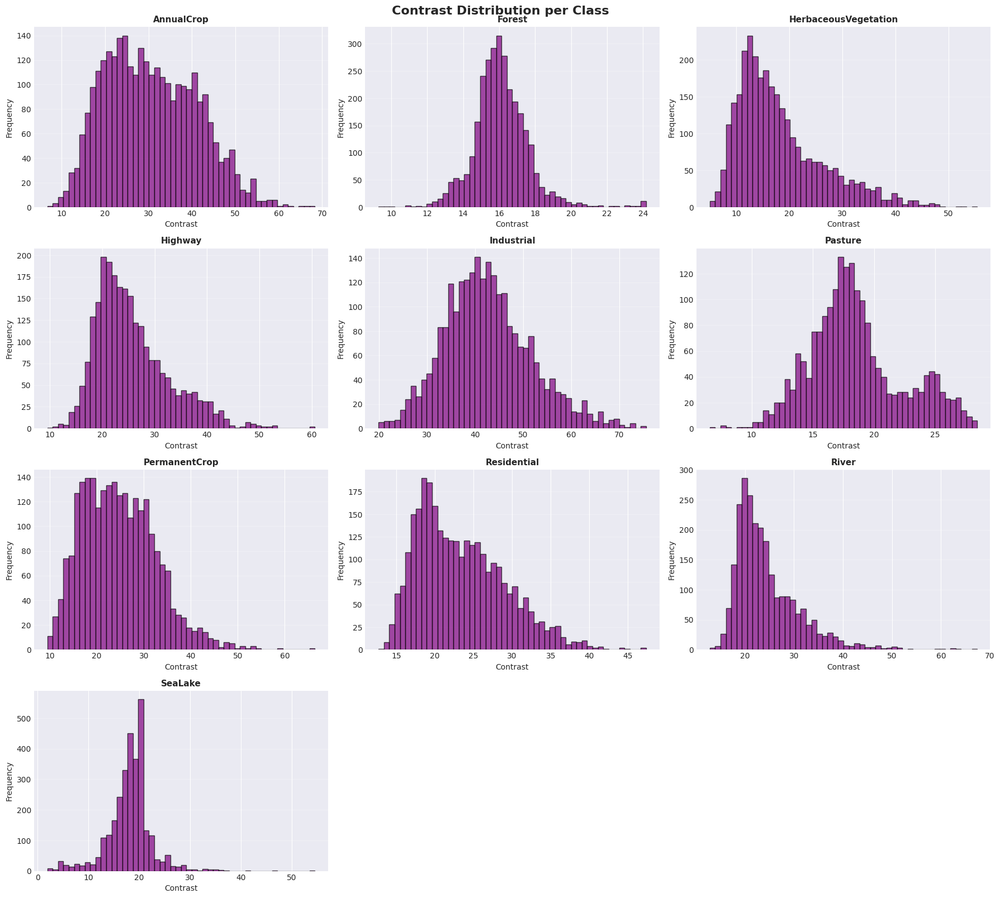

In [17]:
# Contrast distribution per class
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    ax = axes[idx]
    class_mask = labels == idx
    class_images = data[class_mask]

    # Calculate contrast for this class
    class_contrast = class_images.std(axis=(1, 2, 3))

    ax.hist(
        class_contrast.flatten(), bins=50, color="purple", alpha=0.7, edgecolor="black"
    )
    ax.set_xlabel("Contrast", fontsize=10)
    ax.set_ylabel("Frequency", fontsize=10)
    ax.set_title(f"{class_name}", fontsize=11, fontweight="bold")
    ax.grid(axis="y", alpha=0.3)

# Hide unused subplots
for idx in range(n_classes, len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.suptitle("Contrast Distribution per Class", fontsize=16, fontweight="bold", y=1.002)
plt.show()

# EuroSAT Baseline Classic Models

## Import libraries

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from pathlib import Path
from collections import Counter
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
import time

plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")

%matplotlib inline

## Load dataset

In [19]:
def load_eurosat_dataset(data_dir="data"):
    data_path = Path(data_dir)

    # Get all class directories
    class_dirs = [d for d in data_path.iterdir() if d.is_dir()]
    class_names = sorted([d.name for d in class_dirs])

    print(f"Found {len(class_names)} classes: {class_names}")

    images = []
    labels = []

    # Load images from each class
    for class_idx, class_name in enumerate(class_names):
        class_path = data_path / class_name
        image_files = list(class_path.glob("*.jpg")) + list(class_path.glob("*.png"))

        print(f"Loading {len(image_files)} images from {class_name}...")

        for img_path in image_files:
            try:
                # Load image
                img = Image.open(img_path)
                img_array = np.array(img)

                # Store image and label
                images.append(img_array)
                labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    # Convert to numpy arrays
    data = np.array(images)
    labels = np.array(labels)

    print(f"\nDataset loaded successfully!")
    print(f"Total images           : {len(data)}")
    print(f"Data shape             : {data.shape}")
    print(f"Labels shape           : {labels.shape}")

    return data, labels, class_names


# Load the dataset
data, labels, class_names = load_eurosat_dataset("data")

Found 10 classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
Loading 3000 images from AnnualCrop...
Loading 3000 images from Forest...
Loading 3000 images from HerbaceousVegetation...
Loading 2500 images from Highway...
Loading 2500 images from Industrial...
Loading 2000 images from Pasture...
Loading 2500 images from PermanentCrop...
Loading 3000 images from Residential...
Loading 2500 images from River...
Loading 3000 images from SeaLake...

Dataset loaded successfully!
Total images           : 27000
Data shape             : (27000, 64, 64, 3)
Labels shape           : (27000,)


## Feature extraction

In [20]:
def extract_features(image):
    features = []

    # RGB channel statistics (6 features)
    for channel in range(3):
        features.append(image[..., channel].mean())  # Mean for R, G, B
        features.append(image[..., channel].std())  # Std for R, G, B

    # Brightness statistics (2 features)
    brightness = 0.299 * image[..., 0] + 0.587 * image[..., 1] + 0.114 * image[..., 2]
    features.append(brightness.mean())
    features.append(brightness.std())

    # Contrast (1 feature)
    contrast = image.std()
    features.append(contrast)

    # Pixel value statistics (3 features)
    features.append(image.min())
    features.append(image.max())
    features.append(np.median(image))

    return np.array(features)


# Extract features from all images
print("Extracting features from images...")
start_time = time.time()

X = np.array([extract_features(img) for img in data])
y = labels

end_time = time.time()
print(
    f"Feature extraction completed in             : {end_time - start_time:.2f} seconds"
)
print(f"Feature matrix shape                        : {X.shape}")
print(f"Number of features per image                : {X.shape[1]}")

Extracting features from images...
Feature extraction completed in             : 4.34 seconds
Feature matrix shape                        : (27000, 12)
Number of features per image                : 12


In [21]:
# Display feature statistics
feature_names = [
    "R_mean",
    "R_std",
    "G_mean",
    "G_std",
    "B_mean",
    "B_std",
    "brightness_mean",
    "brightness_std",
    "contrast",
    "pixel_min",
    "pixel_max",
    "pixel_median",
]

feature_df = pd.DataFrame(X, columns=feature_names)
print("\nFeature:")
print(feature_df.head(5))


Feature:
       R_mean      R_std      G_mean      G_std      B_mean      B_std  \
0   86.142578  28.887877   87.852783  16.680273   94.895508  12.125597   
1  119.098877  34.471190  113.517334  12.554226  116.753418  12.729983   
2  122.162842  53.589296  126.283936  23.456934  117.898682  23.028011   
3  126.131104  64.348175  137.453125  41.906678  136.608154  35.867697   
4  144.992188  49.760191  131.496582  23.159444  129.868896  22.265820   

   brightness_mean  brightness_std   contrast  pixel_min  pixel_max  \
0        88.144302       19.585480  20.839204       42.0      162.0   
1       115.555129       18.881292  22.536141       53.0      171.0   
2       124.095810       32.191468  36.457689       58.0      232.0   
3       133.971514       47.632879  49.203340       56.0      255.0   
4       135.346212       30.897529  34.861797       52.0      212.0   

   pixel_median  
0          88.0  
1         121.0  
2         114.0  
3         117.0  
4         143.0  


In [22]:
print("\nFeature statistics:")
print(feature_df.describe())


Feature statistics:
             R_mean         R_std        G_mean         G_std        B_mean  \
count  27000.000000  27000.000000  27000.000000  27000.000000  27000.000000   
mean      87.815869     23.298769     96.974164     16.605197    103.981423   
std       43.054911     16.558618     28.209471     12.130154     23.308523   
min       22.274902      0.464302     37.954346      0.607290     57.098389   
25%       53.535400      9.681271     78.382263      7.237105     85.386658   
50%       80.520386     21.203575     93.425049     14.287696    101.277466   
75%      114.159912     34.364487    114.023682     23.464101    119.243469   
max      253.770996     91.094017    209.332031     71.311797    204.489990   

              B_std  brightness_mean  brightness_std      contrast  \
count  27000.000000     27000.000000    27000.000000  27000.000000   
mean      14.086304        95.034662       18.043215     24.068469   
std       11.247949        31.601141       13.092670     

## Data split and feature scaling

In [23]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.13, random_state=42, stratify=y_train
)

print(f"Training set size:          {X_train.shape[0]} samples")
print(f"Validation set size:        {X_val.shape[0]} samples")

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

print("\nFeature scaling completed")

Training set size:          18792 samples
Validation set size:        2808 samples

Feature scaling completed


## Model training and evaluation

In [24]:
def evaluate_model_with_gridsearch(
    model, param_grid, X_train, X_val, y_train, y_val, model_name
):
    """Train model with GridSearchCV and evaluate on validation set"""

    print(f"Training {model_name} with GridSearchCV...")
    print(f"Parameter grid: {param_grid}")

    # GridSearchCV with 5-fold cross-validation
    start_time = time.time()
    grid_search = GridSearchCV(
        model, param_grid, cv=5, scoring="f1_weighted", n_jobs=-1, verbose=1
    )
    grid_search.fit(X_train, y_train)
    train_time = time.time() - start_time

    # Get best model
    best_model = grid_search.best_estimator_

    print(f"\nBest parameters                     : {grid_search.best_params_}")
    print(f"Best cross-validation score         : {grid_search.best_score_:.4f}")
    print(f"Training time                       : {train_time:.2f} seconds")

    # Predict on validation set
    start_time = time.time()
    y_pred = best_model.predict(X_val)
    predict_time = time.time() - start_time

    # Calculate metrics
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred, average="weighted")
    recall = recall_score(y_val, y_pred, average="weighted")
    f1 = f1_score(y_val, y_pred, average="weighted")

    # Print results
    print(f"Prediction time: {predict_time:.2f} seconds")
    print(f"\nValidation Set Performance Metrics:")
    print(f"  Accuracy              : {accuracy:.4f}")
    print(f"  Precision             : {precision:.4f}")
    print(f"  Recall                : {recall:.4f}")
    print(f"  F1-Score              : {f1:.4f}")

    # Classification report
    print(f"\nClassification Report:")
    print(classification_report(y_val, y_pred, target_names=class_names))

    return {
        "model": best_model,
        "grid_search": grid_search,
        "model_name": model_name,
        "y_pred": y_pred,
        "best_params": grid_search.best_params_,
        "cv_score": grid_search.best_score_,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "train_time": train_time,
        "predict_time": predict_time,
    }

### 1. K-Nearest Neighbors (KNN)

In [25]:
# K-Nearest Neighbors
knn = KNeighborsClassifier()
knn_param_grid = {
    "n_neighbors": [3, 5, 7, 9, 11],
    "weights": ["uniform", "distance"],
    "metric": ["euclidean", "manhattan"],
}

knn_results = evaluate_model_with_gridsearch(
    knn, knn_param_grid, X_train_scaled, X_val_scaled, y_train, y_val, "KNN"
)

Training KNN with GridSearchCV...
Parameter grid: {'n_neighbors': [3, 5, 7, 9, 11], 'weights': ['uniform', 'distance'], 'metric': ['euclidean', 'manhattan']}
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Best parameters                     : {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
Best cross-validation score         : 0.7552
Training time                       : 3.00 seconds
Prediction time: 0.05 seconds

Validation Set Performance Metrics:
  Accuracy              : 0.7653
  Precision             : 0.7661
  Recall                : 0.7653
  F1-Score              : 0.7638

Classification Report:
                      precision    recall  f1-score   support

          AnnualCrop       0.84      0.75      0.79       312
              Forest       0.91      0.95      0.93       312
HerbaceousVegetation       0.77      0.74      0.76       312
             Highway       0.49      0.44      0.46       260
          Industrial       0.84      0.85     

### 2. Support Vector Classifier (SVC)

In [26]:
# Support Vector Classifier
svc = SVC(random_state=42)
svc_param_grid = {
    "C": [0.1, 1, 10, 100],
    "kernel": ["poly", "rbf"],
    "gamma": ["scale", "auto"],
}

svc_results = evaluate_model_with_gridsearch(
    svc, svc_param_grid, X_train_scaled, X_val_scaled, y_train, y_val, "SVC"
)

Training SVC with GridSearchCV...
Parameter grid: {'C': [0.1, 1, 10, 100], 'kernel': ['poly', 'rbf'], 'gamma': ['scale', 'auto']}
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Best parameters                     : {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
Best cross-validation score         : 0.8297
Training time                       : 35.64 seconds
Prediction time: 0.54 seconds

Validation Set Performance Metrics:
  Accuracy              : 0.8312
  Precision             : 0.8286
  Recall                : 0.8312
  F1-Score              : 0.8290

Classification Report:
                      precision    recall  f1-score   support

          AnnualCrop       0.84      0.88      0.86       312
              Forest       0.90      0.93      0.91       312
HerbaceousVegetation       0.83      0.88      0.86       312
             Highway       0.62      0.55      0.58       260
          Industrial       0.87      0.88      0.88       260
             Pasture       0.81

### 3. Random Forest

In [27]:
# Random Forest
rf = RandomForestClassifier(random_state=42)
rf_param_grid = {
    "n_estimators": [50, 100, 200],
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
}

rf_results = evaluate_model_with_gridsearch(
    rf, rf_param_grid, X_train_scaled, X_val_scaled, y_train, y_val, "Random Forest"
)

Training Random Forest with GridSearchCV...
Parameter grid: {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20, 30], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}
Fitting 5 folds for each of 108 candidates, totalling 540 fits


/home/mchojna/eurosat/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



Best parameters                     : {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Best cross-validation score         : 0.7768
Training time                       : 144.66 seconds
Prediction time: 0.07 seconds

Validation Set Performance Metrics:
  Accuracy              : 0.7917
  Precision             : 0.7875
  Recall                : 0.7917
  F1-Score              : 0.7878

Classification Report:
                      precision    recall  f1-score   support

          AnnualCrop       0.80      0.84      0.82       312
              Forest       0.91      0.94      0.93       312
HerbaceousVegetation       0.81      0.78      0.79       312
             Highway       0.57      0.44      0.50       260
          Industrial       0.85      0.88      0.86       260
             Pasture       0.80      0.84      0.82       208
       PermanentCrop       0.67      0.65      0.66       260
         Residential       0.75      0.89      0.81    

## Model comparison

In [ ]:
results_summary = pd.DataFrame(
    {
        "Model": [
            knn_results["model_name"],
            svc_results["model_name"],
            rf_results["model_name"],
        ],
        "Best Params": [
            str(knn_results["best_params"]),
            str(svc_results["best_params"]),
            str(rf_results["best_params"]),
        ],
        "CV Score": [
            knn_results["cv_score"],
            svc_results["cv_score"],
            rf_results["cv_score"],
        ],
        "Val Accuracy": [
            knn_results["accuracy"],
            svc_results["accuracy"],
            rf_results["accuracy"],
        ],
        "Precision": [
            knn_results["precision"],
            svc_results["precision"],
            rf_results["precision"],
        ],
        "Recall": [knn_results["recall"], svc_results["recall"], rf_results["recall"]],
        "F1-Score": [knn_results["f1"], svc_results["f1"], rf_results["f1"]],
        "Train Time (s)": [
            knn_results["train_time"],
            svc_results["train_time"],
            rf_results["train_time"],
        ],
    }
)

print(results_summary.to_string(index=False))

        Model                                                                             Best Params  CV Score  Val Accuracy  Precision   Recall  F1-Score  Train Time (s)
          KNN                        {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}  0.755184      0.765313   0.766067 0.765313  0.763791        2.996828
          SVC                                           {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}  0.829682      0.831197   0.828628 0.831197  0.828953       35.635499
Random Forest {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}  0.776812      0.791667   0.787512 0.791667  0.787799      144.658208


## Confusion matrices

In [29]:
def plot_all_confusion_matrices(y_val, predictions_dict, class_names):
    """Plot confusion matrices for all models in a single figure with 3 subplots"""
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))

    for idx, (model_name, y_pred) in enumerate(predictions_dict.items()):
        cm = confusion_matrix(y_val, y_pred)

        sns.heatmap(
            cm,
            annot=True,
            fmt="d",
            cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names,
            cbar_kws={"label": "Number of samples"},
            ax=axes[idx],
        )
        axes[idx].set_xlabel("Predicted Label", fontsize=12, fontweight="bold")
        axes[idx].set_ylabel("True Label", fontsize=12, fontweight="bold")
        axes[idx].set_title(
            f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold"
        )
        axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha="right")
        axes[idx].set_yticklabels(axes[idx].get_yticklabels(), rotation=0)

    plt.tight_layout()
    plt.show()

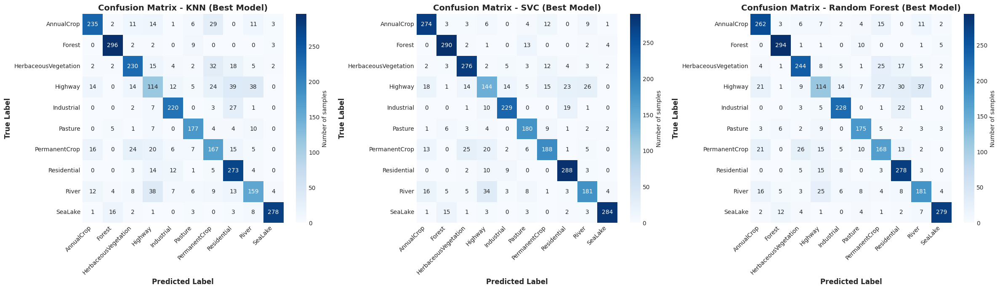

In [ ]:
predictions = {
    "KNN (Best Model)": knn_results["y_pred"],
    "SVC (Best Model)": svc_results["y_pred"],
    "Random Forest (Best Model)": rf_results["y_pred"],
}

plot_all_confusion_matrices(y_val, predictions, class_names)

# EuroSAT Baseline Deep Models

## Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import time

plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")

%matplotlib inline

2026-01-11 14:36:54.426293: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-11 14:36:54.787528: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-11 14:36:56.530377: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
/home/mchojna/eurosat/.venv/lib/python3.12/site-packages/keras/src/export/tf2onnx_lib.py:8:

## Load dataset

In [32]:
def load_eurosat_dataset(data_dir="data"):
    data_path = Path(data_dir)

    # Get all class directories
    class_dirs = [d for d in data_path.iterdir() if d.is_dir()]
    class_names = sorted([d.name for d in class_dirs])

    print(f"Found {len(class_names)} classes: {class_names}")

    images = []
    labels = []

    # Load images from each class
    for class_idx, class_name in enumerate(class_names):
        class_path = data_path / class_name
        image_files = list(class_path.glob("*.jpg")) + list(class_path.glob("*.png"))

        print(f"Loading {len(image_files)} images from {class_name}...")

        for img_path in image_files:
            try:
                # Load image
                img = Image.open(img_path)
                img_array = np.array(img)

                # Store image and label
                images.append(img_array)
                labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    # Convert to numpy arrays
    data = np.array(images)
    labels = np.array(labels)

    print(f"\nDataset loaded successfully!")
    print(f"Total images           : {len(data)}")
    print(f"Data shape             : {data.shape}")
    print(f"Labels shape           : {labels.shape}")

    return data, labels, class_names


# Load the dataset
data, labels, class_names = load_eurosat_dataset("data")

Found 10 classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
Loading 3000 images from AnnualCrop...
Loading 3000 images from Forest...
Loading 3000 images from HerbaceousVegetation...
Loading 2500 images from Highway...
Loading 2500 images from Industrial...
Loading 2000 images from Pasture...
Loading 2500 images from PermanentCrop...
Loading 3000 images from Residential...
Loading 2500 images from River...
Loading 3000 images from SeaLake...

Dataset loaded successfully!
Total images           : 27000
Data shape             : (27000, 64, 64, 3)
Labels shape           : (27000,)


## Data preprocessing

In [33]:
# Normalize pixel values to [0, 1]
X = data.astype("float32") / 255.0
y = labels

print(f"Data shape             : {X.shape}")
print(f"Data dtype             : {X.dtype}")
print(f"Data range             : [{X.min():.2f}, {X.max():.2f}]")
print(f"Number of classes      : {len(class_names)}")

Data shape             : (27000, 64, 64, 3)
Data dtype             : float32
Data range             : [0.00, 1.00]
Number of classes      : 10


## Data split

In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.13, random_state=42, stratify=y_train
)

print(f"Training set size      : {X_train.shape[0]} samples")
print(f"Test set size          : {X_test.shape[0]} samples")
print(f"Image shape            : {X_train.shape[1:]}")
print(f"Number of classes      : {len(class_names)}")

Training set size      : 18792 samples
Test set size          : 5400 samples
Image shape            : (64, 64, 3)
Number of classes      : 10


## Model training and evaluation

In [35]:
class SparseF1Score(keras.metrics.Metric):
    """F1 Score metric that works with sparse labels."""

    def __init__(self, num_classes, average="weighted", name="f1_score", **kwargs):
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.f1_metric = keras.metrics.F1Score(average=average)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert sparse labels to one-hot encoding
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), self.num_classes)
        self.f1_metric.update_state(y_true_one_hot, y_pred, sample_weight)

    def result(self):
        return self.f1_metric.result()

    def reset_state(self):
        self.f1_metric.reset_state()

In [36]:
def evaluate_model(
    model, X_train, X_val, y_train, y_val, model_name, epochs=20, batch_size=32
):
    print(f"\nTraining {model_name}...")

    # Train
    start_time = time.time()
    history = model.fit(
        X_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_data=(X_val, y_val),
        verbose=1,
    )
    train_time = time.time() - start_time

    # Predict on validation set
    start_time = time.time()
    y_pred_probs = model.predict(X_val, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    predict_time = time.time() - start_time

    # Calculate metrics
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred, average="weighted")
    recall = recall_score(y_val, y_pred, average="weighted")
    f1 = f1_score(y_val, y_pred, average="weighted")

    # Print results
    print(f"\nTraining time        : {train_time:.2f} seconds")
    print(f"Prediction time        : {predict_time:.2f} seconds")

    print(f"\nValidation Set Performance Metrics:")
    print(f"  Accuracy             : {accuracy:.4f}")
    print(f"  Precision            : {precision:.4f}")
    print(f"  Recall               : {recall:.4f}")
    print(f"  F1-Score             : {f1:.4f}")

    # Classification report
    print(f"\nClassification Report:")
    print(classification_report(y_val, y_pred, target_names=class_names))

    return {
        "model": model,
        "model_name": model_name,
        "history": history,
        "y_pred": y_pred,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "train_time": train_time,
        "predict_time": predict_time,
    }

### 1. Dense Neural Network

In [37]:
# Build Dense Neural Network
dense_model = keras.Sequential(
    [
        layers.Input(shape=(64, 64, 3)),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(128, activation="relu"),
        layers.Dense(len(class_names), activation="softmax"),
    ]
)

dense_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=[SparseF1Score(num_classes=len(class_names), average="weighted")],
)


print("Dense Neural Network Architecture:")
dense_model.summary()

I0000 00:00:1768138216.261178  180907 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3584 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


Dense Neural Network Architecture:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 12288)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,572,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,590,794 (6.07 MB)

 Trainable params: 1,590,794 (6.07 MB)

 Non-trainable params: 0 (0.00 B)

In [38]:
# Train Dense Neural Network
dense_results = evaluate_model(
    dense_model, X_train, X_val, y_train, y_val, "Dense Neural Network", epochs=8
)


Training Dense Neural Network...
Epoch 1/8


2026-01-11 14:30:18.720615: I external/local_xla/xla/service/service.cc:163] XLA service 0x7c9e6c005000 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-01-11 14:30:18.720641: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2026-01-11 14:30:18.757076: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-01-11 14:30:18.935633: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91701
2026-01-11 14:30:18.990331: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:30:18.

 59/588 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.1063 - loss: 2.8127

I0000 00:00:1768138221.450024  181740 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.2338 - loss: 2.0421

2026-01-11 14:30:24.699001: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:30:25.336130: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_65', 292 bytes spill stores, 292 bytes spill loads

2026-01-11 14:30:25.368435: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_65', 48 bytes spill stores, 48 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - f1_score: 0.2959 - loss: 1.8184 - val_f1_score: 0.3958 - val_loss: 1.6027
Epoch 2/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - f1_score: 0.3973 - loss: 1.5811 - val_f1_score: 0.3497 - val_loss: 1.6618
Epoch 3/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - f1_score: 0.4356 - loss: 1.5074 - val_f1_score: 0.4098 - val_loss: 1.4703
Epoch 4/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - f1_score: 0.4492 - loss: 1.4612 - val_f1_score: 0.4921 - val_loss: 1.3800
Epoch 5/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - f1_score: 0.4638 - loss: 1.4321 - val_f1_score: 0.4691 - val_loss: 1.4094
Epoch 6/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - f1_score: 0.4783 - loss: 1.4005 - val_f1_score: 0.4801 - val_loss: 1.3699
Epoch 7/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - f1_score: 0.4973 - loss: 1.3570 - val_f1_score: 0.4748 - val_loss: 1.4038
Epoch 8/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - f1_score: 0.5093 - loss: 1.3339 - val_f1_score: 0.5124 - val_loss: 1

### 2. Convolutional Neural Network (CNN)

In [39]:
# Build Convolutional Neural Network
cnn_model = keras.Sequential(
    [
        layers.Input(shape=(64, 64, 3)),
        layers.Conv2D(16, (3, 3), activation="relu"),
        layers.Conv2D(16, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(len(class_names), activation="softmax"),
    ]
)

cnn_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=[SparseF1Score(num_classes=len(class_names), average="weighted")],
)


print("Convolutional Neural Network Architecture:")
cnn_model.summary()

Convolutional Neural Network Architecture:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 62, 62, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 60, 60, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 30, 30, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 14400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │     1,843,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,847,386 (7.05 MB)

 Trainable params: 1,847,386 (7.05 MB)

 Non-trainable params: 0 (0.00 B)

In [40]:
# Train Convolutional Neural Network
cnn_results = evaluate_model(
    cnn_model,
    X_train,
    X_val,
    y_train,
    y_val,
    "Convolutional Neural Network",
    epochs=8,
)


Training Convolutional Neural Network...
Epoch 1/8


2026-01-11 14:30:43.173763: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:30:43.564605: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_487', 8 bytes spill stores, 8 bytes spill loads

2026-01-11 14:30:43.666175: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_487', 240 bytes spill stores, 240 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 14s 15ms/step - f1_score: 0.4811 - loss: 1.3564 - val_f1_score: 0.6216 - val_loss: 1.0463
Epoch 2/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.6902 - loss: 0.8578 - val_f1_score: 0.6577 - val_loss: 0.9354
Epoch 3/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.7658 - loss: 0.6547 - val_f1_score: 0.7231 - val_loss: 0.7557
Epoch 4/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8084 - loss: 0.5330 - val_f1_score: 0.7602 - val_loss: 0.6775
Epoch 5/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8475 - loss: 0.4310 - val_f1_score: 0.7594 - val_loss: 0.6486
Epoch 6/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8703 - loss: 0.3714 - val_f1_score: 0.7653 - val_loss: 0.6905
Epoch 7/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - f1_score: 0.8915 - loss: 0.3063 - val_f1_score: 0.7913 - val_loss: 0.6615
Epoch 8/8
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.9122 - loss: 0.2513 - val_f1_score: 0.7452 - val_loss:

## Model comparison

In [41]:
# Compare all models
results_summary = pd.DataFrame(
    {
        "Model": [
            dense_results["model_name"],
            cnn_results["model_name"],
        ],
        "Val Accuracy": [
            dense_results["accuracy"],
            cnn_results["accuracy"],
        ],
        "Precision": [
            dense_results["precision"],
            cnn_results["precision"],
        ],
        "Recall": [
            dense_results["recall"],
            cnn_results["recall"],
        ],
        "F1-Score": [
            dense_results["f1"],
            cnn_results["f1"],
        ],
        "Train Time (s)": [
            dense_results["train_time"],
            cnn_results["train_time"],
        ],
        "Predict Time (s)": [
            dense_results["predict_time"],
            cnn_results["predict_time"],
        ],
    }
)

print(results_summary.to_string(index=False))

                       Model  Val Accuracy  Precision   Recall  F1-Score  Train Time (s)  Predict Time (s)
        Dense Neural Network      0.527778   0.545104 0.527778  0.512443       20.563532          0.961613
Convolutional Neural Network      0.743590   0.764942 0.743590  0.745206       30.510701          0.668529


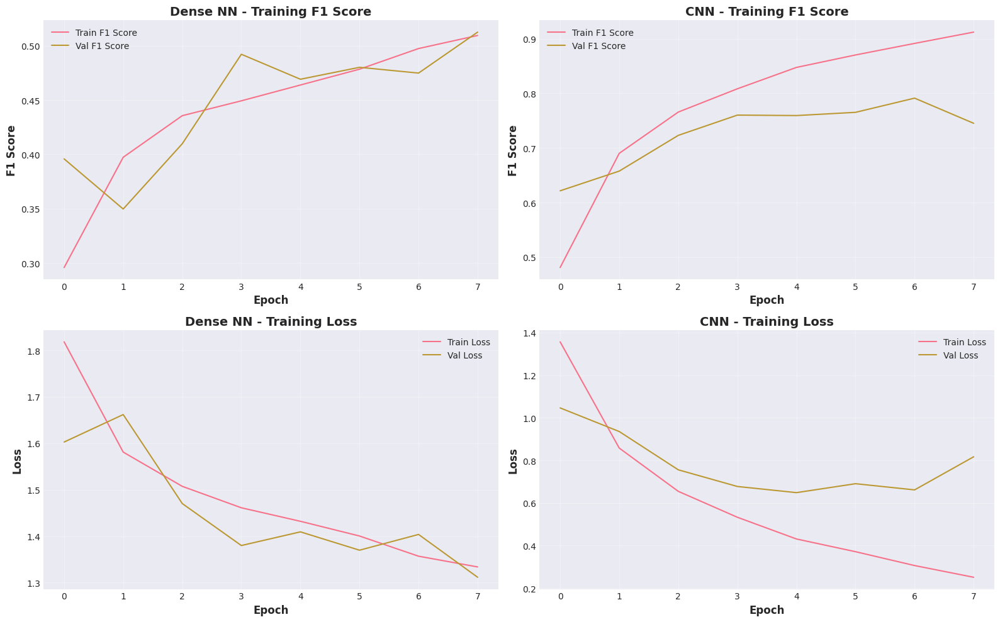

In [42]:
# Training history
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Dense NN F1 Score
axes[0, 0].plot(dense_results["history"].history["f1_score"], label="Train F1 Score")
axes[0, 0].plot(dense_results["history"].history["val_f1_score"], label="Val F1 Score")
axes[0, 0].set_xlabel("Epoch", fontsize=12, fontweight="bold")
axes[0, 0].set_ylabel("F1 Score", fontsize=12, fontweight="bold")
axes[0, 0].set_title("Dense NN - Training F1 Score", fontsize=14, fontweight="bold")
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# CNN F1 Score
axes[0, 1].plot(cnn_results["history"].history["f1_score"], label="Train F1 Score")
axes[0, 1].plot(cnn_results["history"].history["val_f1_score"], label="Val F1 Score")
axes[0, 1].set_xlabel("Epoch", fontsize=12, fontweight="bold")
axes[0, 1].set_ylabel("F1 Score", fontsize=12, fontweight="bold")
axes[0, 1].set_title("CNN - Training F1 Score", fontsize=14, fontweight="bold")
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Dense NN loss
axes[1, 0].plot(dense_results["history"].history["loss"], label="Train Loss")
axes[1, 0].plot(dense_results["history"].history["val_loss"], label="Val Loss")
axes[1, 0].set_xlabel("Epoch", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Loss", fontsize=12, fontweight="bold")
axes[1, 0].set_title("Dense NN - Training Loss", fontsize=14, fontweight="bold")
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# CNN loss
axes[1, 1].plot(cnn_results["history"].history["loss"], label="Train Loss")
axes[1, 1].plot(cnn_results["history"].history["val_loss"], label="Val Loss")
axes[1, 1].set_xlabel("Epoch", fontsize=12, fontweight="bold")
axes[1, 1].set_ylabel("Loss", fontsize=12, fontweight="bold")
axes[1, 1].set_title("CNN - Training Loss", fontsize=14, fontweight="bold")
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Confusion matrices

In [43]:
def plot_all_confusion_matrices(y_val, predictions_dict, class_names):
    """Plot confusion matrices for all models in a single figure with subplots"""
    num_models = len(predictions_dict)
    fig, axes = plt.subplots(1, num_models, figsize=(12 * num_models, 10))

    if num_models == 1:
        axes = [axes]

    for idx, (model_name, y_pred) in enumerate(predictions_dict.items()):
        cm = confusion_matrix(y_val, y_pred)

        sns.heatmap(
            cm,
            annot=True,
            fmt="d",
            cmap="Blues",
            xticklabels=class_names,
            yticklabels=class_names,
            cbar_kws={"label": "Number of samples"},
            ax=axes[idx],
        )
        axes[idx].set_xlabel("Predicted Label", fontsize=12, fontweight="bold")
        axes[idx].set_ylabel("True Label", fontsize=12, fontweight="bold")
        axes[idx].set_title(
            f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold"
        )
        axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha="right")
        axes[idx].set_yticklabels(axes[idx].get_yticklabels(), rotation=0)

    plt.tight_layout()
    plt.show()

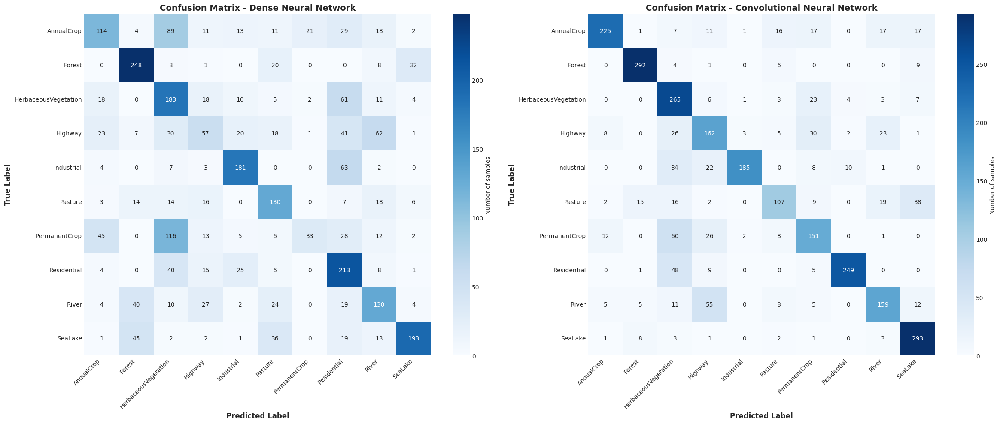

In [44]:
# Confusion matrices for all models
predictions = {
    "Dense Neural Network": dense_results["y_pred"],
    "Convolutional Neural Network": cnn_results["y_pred"],
}

plot_all_confusion_matrices(y_val, predictions, class_names)

# EuroSAT CNN Architecture Experiments

## Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import regularizers
from tensorflow.keras import layers
import time
import gc

plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")

%matplotlib inline

2026-01-11 16:38:57.556331: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-11 16:38:58.009158: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-11 16:38:59.741924: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
/home/mchojna/eurosat/.venv/lib/python3.12/site-packages/keras/src/export/tf2onnx_lib.py:8:

## Load dataset

In [2]:
def load_eurosat_dataset(data_dir="data"):
    data_path = Path(data_dir)

    # Get all class directories
    class_dirs = [d for d in data_path.iterdir() if d.is_dir()]
    class_names = sorted([d.name for d in class_dirs])

    print(f"Found {len(class_names)} classes: {class_names}")

    images = []
    labels = []

    # Load images from each class
    for class_idx, class_name in enumerate(class_names):
        class_path = data_path / class_name
        image_files = list(class_path.glob("*.jpg")) + list(class_path.glob("*.png"))

        print(f"Loading {len(image_files)} images from {class_name}...")

        for img_path in image_files:
            try:
                # Load image
                img = Image.open(img_path)
                img_array = np.array(img)

                # Store image and label
                images.append(img_array)
                labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    # Convert to numpy arrays
    data = np.array(images)
    labels = np.array(labels)

    print(f"\nDataset loaded successfully!")
    print(f"Total images           : {len(data)}")
    print(f"Data shape             : {data.shape}")
    print(f"Labels shape           : {labels.shape}")

    return data, labels, class_names


# Load the dataset
data, labels, class_names = load_eurosat_dataset("data")

Found 10 classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
Loading 3000 images from AnnualCrop...
Loading 3000 images from Forest...
Loading 3000 images from HerbaceousVegetation...
Loading 2500 images from Highway...
Loading 2500 images from Industrial...
Loading 2000 images from Pasture...
Loading 2500 images from PermanentCrop...
Loading 3000 images from Residential...
Loading 2500 images from River...
Loading 3000 images from SeaLake...

Dataset loaded successfully!
Total images           : 27000
Data shape             : (27000, 64, 64, 3)
Labels shape           : (27000,)


## Data preprocessing

In [3]:
# Normalize pixel values to [0, 1]
X = data.astype("float32") / 255.0
y = labels

print(f"Data shape             : {X.shape}")
print(f"Data dtype             : {X.dtype}")
print(f"Data range             : [{X.min():.2f}, {X.max():.2f}]")
print(f"Number of classes      : {len(class_names)}")

Data shape             : (27000, 64, 64, 3)
Data dtype             : float32
Data range             : [0.00, 1.00]
Number of classes      : 10


## Data split

In [4]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.13, random_state=42, stratify=y_train
)

print(f"Training set size      : {X_train.shape[0]} samples")
print(f"Validation set size    : {X_val.shape[0]} samples")
print(f"Test set size          : {X_test.shape[0]} samples")
print(f"Image shape            : {X_train.shape[1:]}")
print(f"Number of classes      : {len(class_names)}")

Training set size      : 18792 samples
Validation set size    : 2808 samples
Test set size          : 5400 samples
Image shape            : (64, 64, 3)
Number of classes      : 10


## Helper functions

In [2]:
class SparseF1Score(keras.metrics.Metric):
    """F1 Score metric that works with sparse (integer) labels."""

    def __init__(self, num_classes, average="weighted", name="f1_score", **kwargs):
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.f1_metric = keras.metrics.F1Score(average=average)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert sparse labels to one-hot encoding
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), self.num_classes)
        self.f1_metric.update_state(y_true_one_hot, y_pred, sample_weight)

    def result(self):
        return self.f1_metric.result()

    def reset_state(self):
        self.f1_metric.reset_state()


class F1Callback(keras.callbacks.Callback):
    """Callback to track F1 score during training for early stopping."""

    def __init__(self):
        super().__init__()
        self.best_f1 = 0

    def on_epoch_end(self, epoch, logs=None):
        val_f1 = logs.get("val_f1_score")
        if val_f1 and val_f1 > self.best_f1:
            self.best_f1 = val_f1

In [3]:
def evaluate_model(
    model, X_train, X_val, y_train, y_val, model_name, epochs=20, batch_size=32
):
    print(f"\nTraining {model_name}...")

    # Early stopping on validation F1 score
    early_stopping = keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        patience=5,
        restore_best_weights=True,
        mode="max",
        verbose=1,
    )

    # Train
    start_time = time.time()
    history = model.fit(
        X_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_data=(X_val, y_val),
        callbacks=[early_stopping],
        verbose=1,
    )
    train_time = time.time() - start_time

    # Predict on validation set
    start_time = time.time()
    y_pred_probs = model.predict(X_val, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    predict_time = time.time() - start_time

    # Calculate metrics
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred, average="weighted")
    recall = recall_score(y_val, y_pred, average="weighted")
    f1 = f1_score(y_val, y_pred, average="weighted")

    # Print results
    print(f"\nTraining time          : {train_time:.2f} seconds")
    print(f"Prediction time        : {predict_time:.2f} seconds")

    print(f"\nValidation Set Performance Metrics:")
    print(f"  Accuracy             : {accuracy:.4f}")
    print(f"  Precision            : {precision:.4f}")
    print(f"  Recall               : {recall:.4f}")
    print(f"  F1-Score             : {f1:.4f}")

    # Classification report
    print(f"\nClassification Report:")
    print(classification_report(y_val, y_pred, target_names=class_names))

    return {
        "model": model,
        "model_name": model_name,
        "history": history,
        "y_pred": y_pred,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "train_time": train_time,
        "predict_time": predict_time,
    }

In [4]:
def plot_confusion_matrix(y_val, y_pred, class_names, model_name):
    cm = confusion_matrix(y_val, y_pred)

    plt.figure(figsize=(12, 10))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
        cbar_kws={"label": "Number of samples"},
    )
    plt.xlabel("Predicted Label", fontsize=12, fontweight="bold")
    plt.ylabel("True Label", fontsize=12, fontweight="bold")
    plt.title(f"Confusion Matrix - {model_name}", fontsize=14, fontweight="bold")
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    return cm


def plot_training_curves(history, model_name):
    """Plot loss and F1 score curves for a model."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Loss curves
    axes[0].plot(history.history["loss"], label="Train Loss", linewidth=2)
    axes[0].plot(history.history["val_loss"], label="Val Loss", linewidth=2)
    axes[0].set_xlabel("Epoch", fontsize=12, fontweight="bold")
    axes[0].set_ylabel("Loss", fontsize=12, fontweight="bold")
    axes[0].set_title(f"Loss Curves - {model_name}", fontsize=13, fontweight="bold")
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # F1 score curves
    axes[1].plot(history.history["f1_score"], label="Train F1", linewidth=2)
    axes[1].plot(history.history["val_f1_score"], label="Val F1", linewidth=2)
    axes[1].set_xlabel("Epoch", fontsize=12, fontweight="bold")
    axes[1].set_ylabel("F1 Score", fontsize=12, fontweight="bold")
    axes[1].set_title(f"F1 Score Curves - {model_name}", fontsize=13, fontweight="bold")
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

## Experiment 1: Network Depth

Investigating the optimal depth of the CNN by varying the number of Conv2D + MaxPooling blocks. 

Testing architectures with **2, 3, and 4** Conv2D + MaxPooling blocks. Each configuration has:
- **ELU activation** function
- **He initialization** for weights
- **Batch Normalization** before and after each convolutional layer
- **Early stopping** on validation F1 score

In [9]:
def build_depth_model(
    num_blocks, num_classes, input_shape=(64, 64, 3), base_filters=16
):
    """
    Build a CNN with variable depth (number of Conv2D + MaxPooling blocks).
    Uses ELU activation, He initialization, and Batch Normalization.

    Args:
        num_blocks: Number of Conv2D + MaxPooling blocks (2-5)
        num_classes: Number of output classes
        input_shape: Shape of input images
        base_filters: Number of filters (constant across all blocks)

    Returns:
        Compiled Keras model
    """
    model = keras.Sequential(name=f"depth_model_{num_blocks}_blocks")
    model.add(layers.Input(shape=input_shape))

    for block in range(num_blocks):
        # Batch Normalization before Conv2D
        model.add(layers.BatchNormalization(name=f"block{block+1}_bn_pre"))

        # Conv2D layer with ELU activation and He initialization
        model.add(
            layers.Conv2D(
                base_filters,
                (3, 3),
                activation="elu",
                padding="same",
                kernel_initializer="he_normal",
                name=f"block{block+1}_conv",
            )
        )

        # Batch Normalization after Conv2D
        model.add(layers.BatchNormalization(name=f"block{block+1}_bn_post"))

        # MaxPooling layer
        model.add(layers.MaxPooling2D((2, 2), name=f"block{block+1}_maxpool"))

    # Flatten and dense layers
    model.add(layers.Flatten(name="flatten"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_1"
        )
    )
    model.add(layers.BatchNormalization(name="dense_1_bn"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_2"
        )
    )
    model.add(layers.BatchNormalization(name="dense_2_bn"))
    model.add(layers.Dense(num_classes, activation="softmax", name="output"))

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=[SparseF1Score(num_classes=num_classes, average="weighted")],
    )

    return model

In [10]:
# Test different network depths (2-4 blocks)
depth_configs = [2, 3, 4]
depth_results = []

for num_blocks in depth_configs:
    print(f"Testing CNN with {num_blocks} Conv2D + MaxPooling block(s)")

    # Build model
    model = build_depth_model(num_blocks, len(class_names))

    # Print architecture
    print(f"\nArchitecture Summary:")
    model.summary()

    # Train and evaluate
    result = evaluate_model(
        model,
        X_train,
        X_val,
        y_train,
        y_val,
        f"CNN Depth {num_blocks}",
        epochs=30,
    )
    result["num_blocks"] = num_blocks
    depth_results.append(result)
    
    del model
    tf.keras.backend.clear_session()
    gc.collect()

Testing CNN with 2 Conv2D + MaxPooling block(s)


I0000 00:00:1768138647.081790  184738 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3584 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6



Architecture Summary:


Model: "depth_model_2_blocks"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_bn_pre                   │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv (Conv2D)            │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_bn_post                  │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_bn_pre                   │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv (Conv2D)            │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_bn_post                  │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_maxpool (MaxPooling2D)   │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1_bn (BatchNormalization) │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2_bn (BatchNormalization) │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 546,214 (2.08 MB)

 Trainable params: 545,600 (2.08 MB)

 Non-trainable params: 614 (2.40 KB)


Training CNN Depth 2...
Epoch 1/30


2026-01-11 14:37:30.554221: I external/local_xla/xla/service/service.cc:163] XLA service 0x7a7b20018610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-01-11 14:37:30.554246: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2026-01-11 14:37:30.603464: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-01-11 14:37:30.882244: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91701
2026-01-11 14:37:30.944769: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:37:30.

 44/588 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3990 - loss: 1.6324

I0000 00:00:1768138655.150520  184984 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - f1_score: 0.6085 - loss: 1.0679

2026-01-11 14:37:40.761508: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:37:41.065764: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_158', 8 bytes spill stores, 8 bytes spill loads

2026-01-11 14:37:41.278565: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_178', 28 bytes spill stores, 28 bytes spill loads

2026-01-11 14:37:41.297210: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_178', 36 bytes s

588/588 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - f1_score: 0.6786 - loss: 0.8870 - val_f1_score: 0.7256 - val_loss: 0.7587
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - f1_score: 0.7780 - loss: 0.6273 - val_f1_score: 0.7645 - val_loss: 0.6327
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8211 - loss: 0.5129 - val_f1_score: 0.7915 - val_loss: 0.5867
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - f1_score: 0.8589 - loss: 0.4065 - val_f1_score: 0.8025 - val_loss: 0.5970
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8832 - loss: 0.3386 - val_f1_score: 0.7989 - val_loss: 0.5946
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.9060 - loss: 0.2787 - val_f1_score: 0.8179 - val_loss: 0.5815
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.9256 - loss: 0.2198 - val_f1_score: 0.7850 - val_loss: 0.7488
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - f1_score: 0.9369 - loss: 0.1830 - val_f1_score: 0.8224 - va

Model: "depth_model_3_blocks"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_bn_pre                   │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv (Conv2D)            │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_bn_post                  │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_bn_pre                   │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv (Conv2D)            │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_bn_post                  │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_maxpool (MaxPooling2D)   │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_bn_pre                   │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv (Conv2D)            │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_bn_post                  │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_maxpool (MaxPooling2D)   │ (None, 8, 8, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1_bn (BatchNormalization) │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2_bn (BatchNormalization) │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 155,446 (607.21 KB)

 Trainable params: 154,768 (604.56 KB)

 Non-trainable params: 678 (2.65 KB)


Training CNN Depth 3...
Epoch 1/30


2026-01-11 14:38:30.712655: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:38:31.251543: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2261', 520 bytes spill stores, 520 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 17s 14ms/step - f1_score: 0.7059 - loss: 0.8213 - val_f1_score: 0.7697 - val_loss: 0.6150
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - f1_score: 0.8016 - loss: 0.5672 - val_f1_score: 0.8036 - val_loss: 0.5381
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - f1_score: 0.8203 - loss: 0.5069 - val_f1_score: 0.7013 - val_loss: 0.8844
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8490 - loss: 0.4350 - val_f1_score: 0.8115 - val_loss: 0.5602
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8716 - loss: 0.3676 - val_f1_score: 0.8431 - val_loss: 0.4599
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8847 - loss: 0.3287 - val_f1_score: 0.8463 - val_loss: 0.4367
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.9058 - loss: 0.2723 - val_f1_score: 0.8218 - val_loss: 0.5230
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.9143 - loss: 0.2509 - val_f1_score: 0.8076 - va

Model: "depth_model_4_blocks"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_bn_pre                   │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv (Conv2D)            │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_bn_post                  │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_bn_pre                   │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv (Conv2D)            │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_bn_post                  │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_maxpool (MaxPooling2D)   │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_bn_pre                   │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv (Conv2D)            │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_bn_post                  │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_maxpool (MaxPooling2D)   │ (None, 8, 8, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_bn_pre                   │ (None, 8, 8, 16)       │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv (Conv2D)            │ (None, 8, 8, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_bn_post                  │ (None, 8, 8, 16)       │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_maxpool (MaxPooling2D)   │ (None, 4, 4, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1_bn (BatchNormalization) │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2_bn (BatchNormalization) │ (None, 128)            │           51

 Total params: 59,590 (232.77 KB)

 Trainable params: 58,848 (229.88 KB)

 Non-trainable params: 742 (2.90 KB)


Training CNN Depth 4...
Epoch 1/30


2026-01-11 14:39:21.919354: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:39:21.919410: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:39:21.919422: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:39:22.540607: I external/l

588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - f1_score: 0.5943 - loss: 1.1411

2026-01-11 14:39:32.693450: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:39:33.024192: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_262', 16 bytes spill stores, 16 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 16s 14ms/step - f1_score: 0.6788 - loss: 0.8977 - val_f1_score: 0.7740 - val_loss: 0.6185
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - f1_score: 0.7694 - loss: 0.6446 - val_f1_score: 0.7992 - val_loss: 0.5769
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.7999 - loss: 0.5675 - val_f1_score: 0.7830 - val_loss: 0.6054
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.8254 - loss: 0.4965 - val_f1_score: 0.8225 - val_loss: 0.5001
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - f1_score: 0.8388 - loss: 0.4489 - val_f1_score: 0.8541 - val_loss: 0.4206
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - f1_score: 0.8541 - loss: 0.4034 - val_f1_score: 0.8614 - val_loss: 0.3961
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - f1_score: 0.8672 - loss: 0.3710 - val_f1_score: 0.8194 - val_loss: 0.5009
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - f1_score: 0.8729 - loss: 0.3529 - val_f1_score: 0.7753 - v

### Experiment 1: Results Summary

In [11]:
# Compare depth experiment results in a table
depth_summary = pd.DataFrame(
    {
        "Blocks": [r["num_blocks"] for r in depth_results],
        "Model": [r["model_name"] for r in depth_results],
        "Val Accuracy": [f"{r['accuracy']:.4f}" for r in depth_results],
        "Val Precision": [f"{r['precision']:.4f}" for r in depth_results],
        "Val Recall": [f"{r['recall']:.4f}" for r in depth_results],
        "Val F1-Score": [f"{r['f1']:.4f}" for r in depth_results],
        "Train Time (s)": [f"{r['train_time']:.2f}" for r in depth_results],
        "Predict Time (s)": [f"{r['predict_time']:.2f}" for r in depth_results],
    }
)

print("Experiment 1: Network Depth Results")
display(depth_summary)

Experiment 1: Network Depth Results


,Blocks,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,2,CNN Depth 2,0.8248,0.8317,0.8248,0.8252,58.10,1.19
1,3,CNN Depth 3,0.8479,0.8510,0.8479,0.8463,48.48,1.47
2,4,CNN Depth 4,0.8932,0.8959,0.8932,0.8932,90.12,1.56


In [12]:
# Save Experiment 1 results to CSV
depth_summary.to_csv("results/esults_experiment1_depth.csv", index=False)
print("\nResults saved to: results_experiment1_depth.csv")


Results saved to: results_experiment1_depth.csv


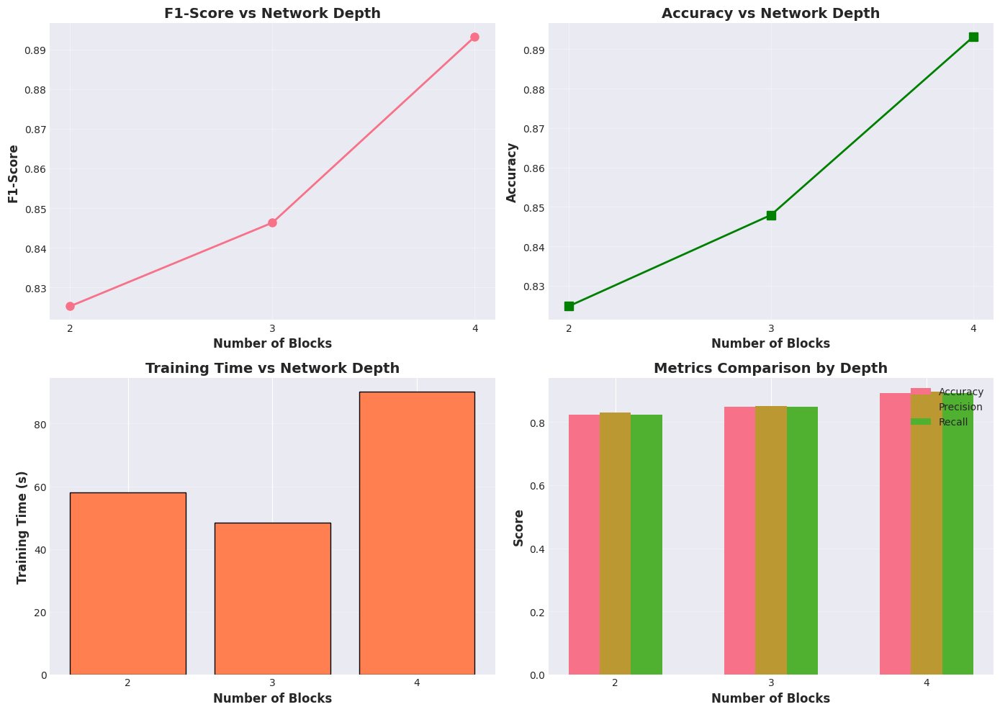

In [13]:
# Visualize depth experiment results with metrics
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

depth_blocks = [r["num_blocks"] for r in depth_results]
depth_f1 = [r["f1"] for r in depth_results]
depth_accuracy = [r["accuracy"] for r in depth_results]
depth_train_time = [r["train_time"] for r in depth_results]

# F1-Score vs Depth
axes[0, 0].plot(
    depth_blocks,
    depth_f1,
    marker="o",
    linewidth=2,
    markersize=8,
)
axes[0, 0].set_xlabel("Number of Blocks", fontsize=12, fontweight="bold")
axes[0, 0].set_ylabel("F1-Score", fontsize=12, fontweight="bold")
axes[0, 0].set_title("F1-Score vs Network Depth", fontsize=14, fontweight="bold")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].set_xticks(depth_blocks)

# Accuracy vs Depth
axes[0, 1].plot(
    depth_blocks,
    depth_accuracy,
    marker="s",
    linewidth=2,
    markersize=8,
    color="green",
)
axes[0, 1].set_xlabel("Number of Blocks", fontsize=12, fontweight="bold")
axes[0, 1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
axes[0, 1].set_title("Accuracy vs Network Depth", fontsize=14, fontweight="bold")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].set_xticks(depth_blocks)

# Training Time vs Depth
axes[1, 0].bar(
    depth_blocks,
    depth_train_time,
    color="coral",
    edgecolor="black",
)
axes[1, 0].set_xlabel("Number of Blocks", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Training Time (s)", fontsize=12, fontweight="bold")
axes[1, 0].set_title("Training Time vs Network Depth", fontsize=14, fontweight="bold")
axes[1, 0].grid(axis="y", alpha=0.3)
axes[1, 0].set_xticks(depth_blocks)

# All metrics comparison
x = np.arange(len(depth_blocks))
width = 0.2
axes[1, 1].bar(x - width, depth_accuracy, width, label="Accuracy")
axes[1, 1].bar(x, [r["precision"] for r in depth_results], width, label="Precision")
axes[1, 1].bar(x + width, [r["recall"] for r in depth_results], width, label="Recall")
axes[1, 1].set_xlabel("Number of Blocks", fontsize=12, fontweight="bold")
axes[1, 1].set_ylabel("Score", fontsize=12, fontweight="bold")
axes[1, 1].set_title("Metrics Comparison by Depth", fontsize=14, fontweight="bold")
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(depth_blocks)
axes[1, 1].legend()
axes[1, 1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Training Curves for: CNN Depth 2


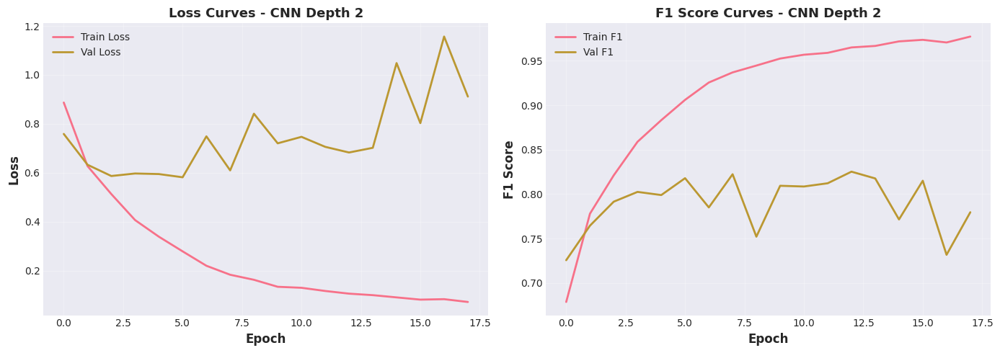


Training Curves for: CNN Depth 3


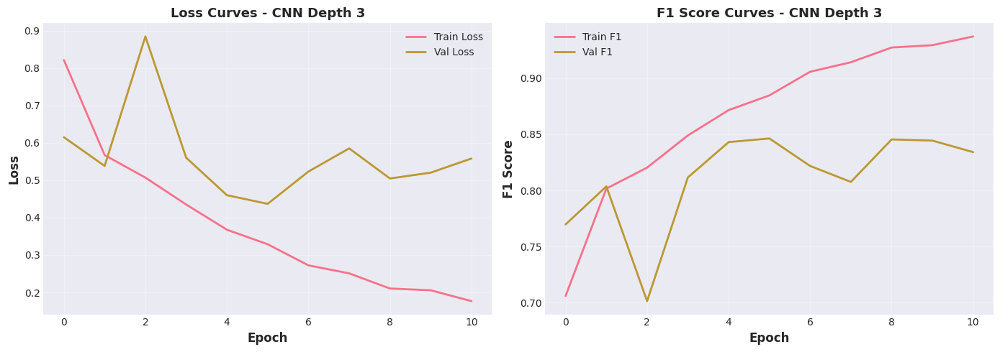


Training Curves for: CNN Depth 4


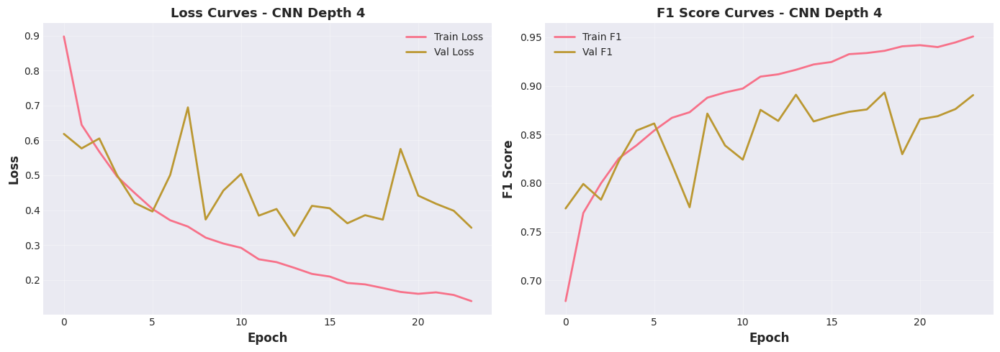

In [14]:
# Training curves for all depth configurations
for result in depth_results:
    print(f"\nTraining Curves for: {result['model_name']}")
    plot_training_curves(result["history"], result["model_name"])

In [37]:
best_depth = 4
best_depth_f1 = 0.8932

print(f"Best network depth     : {best_depth} block(s)")
print(f"Best F1-Score          : {best_depth_f1:.4f}")
print(f"This depth will be used for Experiment 2 (Block Width).")

Best network depth     : 4 block(s)
Best F1-Score          : 0.8932
This depth will be used for Experiment 2 (Block Width).


## Experiment 2: Block Width

Investigating the optimal width of each block by varying the number of Conv2D layers within each block before the MaxPooling layer.

Using the best depth from Experiment 1, testing architectures with **2, 3, and 4** Conv2D layers per block. All configurations use:
- **ELU activation** function
- **He initialization** for weights
- **Batch Normalization** before and after each convolutional layer
- **Early stopping** on validation F1 score

In [17]:
def build_width_model(
    num_blocks, convs_per_block, num_classes, input_shape=(64, 64, 3), base_filters=16
):
    """
    Build a CNN with variable width (number of Conv2D layers per block).
    Uses ELU activation, He initialization, and Batch Normalization.

    Args:
        num_blocks: Number of blocks (Conv2D layers + MaxPooling)
        convs_per_block: Number of Conv2D layers in each block before MaxPooling
        num_classes: Number of output classes
        input_shape: Shape of input images
        base_filters: Number of filters (constant across all blocks)

    Returns:
        Compiled Keras model
    """
    model = keras.Sequential(name=f"width_model_{convs_per_block}_convs")
    model.add(layers.Input(shape=input_shape))

    for block in range(num_blocks):
        # Add multiple Conv2D layers per block
        for conv in range(convs_per_block):
            # Batch Normalization before Conv2D
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_pre")
            )

            # Conv2D layer with ELU activation and He initialization
            model.add(
                layers.Conv2D(
                    base_filters,
                    (3, 3),
                    activation="elu",
                    padding="same",
                    kernel_initializer="he_normal",
                    name=f"block{block+1}_conv{conv+1}",
                )
            )

            # Batch Normalization after Conv2D
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_post")
            )

        # MaxPooling layer after all convs in the block
        model.add(layers.MaxPooling2D((2, 2), name=f"block{block+1}_maxpool"))

    # Flatten and dense layers
    model.add(layers.Flatten(name="flatten"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_1"
        )
    )
    model.add(layers.BatchNormalization(name="dense_1_bn"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_2"
        )
    )
    model.add(layers.BatchNormalization(name="dense_2_bn"))
    model.add(layers.Dense(num_classes, activation="softmax", name="output"))

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=[SparseF1Score(num_classes=num_classes, average="weighted")],
    )

    return model

In [18]:
# Test different block widths (2-4 Conv2D layers per block)
width_configs = [2, 3, 4]
width_results = []

print(f"Using best depth from Experiment 1: {best_depth} block(s)")

for convs_per_block in width_configs:
    print(f"Testing CNN with {convs_per_block} Conv2D layer(s) per block")
    print(
        f"Total blocks: {best_depth}, Total Conv2D layers: {best_depth * convs_per_block}"
    )

    # Build model
    model = build_width_model(best_depth, convs_per_block, len(class_names))

    # Print architecture
    print(f"\nArchitecture Summary:")
    model.summary()

    # Train and evaluate
    result = evaluate_model(
        model,
        X_train,
        X_val,
        y_train,
        y_val,
        f"CNN Width {convs_per_block}",
        epochs=30,
    )
    result["convs_per_block"] = convs_per_block
    result["num_blocks"] = best_depth
    width_results.append(result)
    
    del model
    tf.keras.backend.clear_session()
    gc.collect()

Using best depth from Experiment 1: 4 block(s)
Testing CNN with 2 Conv2D layer(s) per block
Total blocks: 4, Total Conv2D layers: 8

Architecture Summary:


Model: "width_model_2_convs"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_maxpool (MaxPooling2D)   │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1_bn_pre             │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1_bn_post            │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2_bn_pre             │ (None, 16, 16, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 69,382 (271.02 KB)

 Trainable params: 68,384 (267.12 KB)

 Non-trainable params: 998 (3.90 KB)


Training CNN Width 2...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - f1_score: 0.6868 - loss: 0.8909 - val_f1_score: 0.7897 - val_loss: 0.6267
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - f1_score: 0.7850 - loss: 0.6121 - val_f1_score: 0.8090 - val_loss: 0.5329
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - f1_score: 0.8280 - loss: 0.4962 - val_f1_score: 0.8381 - val_loss: 0.4788
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - f1_score: 0.8454 - loss: 0.4446 - val_f1_score: 0.8863 - val_loss: 0.3323
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - f1_score: 0.8676 - loss: 0.3780 - val_f1_score: 0.8289 - val_loss: 0.5214
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - f1_score: 0.8821 - loss: 0.3472 - val_f1_score: 0.8559 - val_loss: 0.4199
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - f1_score: 0.8952 - loss: 0.3027 - val_f1_score: 0.8891 - val_loss: 0.2963
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - f1_score: 0.9056 - los

Model: "width_model_3_convs"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv3_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv3 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv3_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │             

 Total params: 79,174 (309.27 KB)

 Trainable params: 77,920 (304.38 KB)

 Non-trainable params: 1,254 (4.90 KB)


Training CNN Width 3...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - f1_score: 0.6732 - loss: 0.9225 - val_f1_score: 0.7649 - val_loss: 0.6727
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - f1_score: 0.7703 - loss: 0.6501 - val_f1_score: 0.7928 - val_loss: 0.5772
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - f1_score: 0.8175 - loss: 0.5301 - val_f1_score: 0.8360 - val_loss: 0.4990
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - f1_score: 0.8449 - loss: 0.4486 - val_f1_score: 0.8626 - val_loss: 0.3948
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - f1_score: 0.8618 - loss: 0.4044 - val_f1_score: 0.8776 - val_loss: 0.3557
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - f1_score: 0.8797 - loss: 0.3446 - val_f1_score: 0.8685 - val_loss: 0.3755
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - f1_score: 0.8906 - loss: 0.3174 - val_f1_score: 0.8792 - val_loss: 0.3453
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - f1_score: 0.9010 - l

Model: "width_model_4_convs"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_post            │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │             

 Total params: 88,966 (347.52 KB)

 Trainable params: 87,456 (341.62 KB)

 Non-trainable params: 1,510 (5.90 KB)


Training CNN Width 4...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - f1_score: 0.6461 - loss: 0.9937 - val_f1_score: 0.7426 - val_loss: 0.6760
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - f1_score: 0.7592 - loss: 0.6836 - val_f1_score: 0.7532 - val_loss: 0.7116
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - f1_score: 0.8006 - loss: 0.5707 - val_f1_score: 0.7560 - val_loss: 0.6752
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - f1_score: 0.8356 - loss: 0.4817 - val_f1_score: 0.8563 - val_loss: 0.4003
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - f1_score: 0.8516 - loss: 0.4289 - val_f1_score: 0.8628 - val_loss: 0.4091
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - f1_score: 0.8640 - loss: 0.4001 - val_f1_score: 0.8322 - val_loss: 0.4628
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - f1_score: 0.8806 - loss: 0.3483 - val_f1_score: 0.8601 - val_loss: 0.4371
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - f1_score: 0.89

### Experiment 2: Results Summary

In [19]:
# Compare width experiment results in a table
width_summary = pd.DataFrame(
    {
        "Convs/Block": [r["convs_per_block"] for r in width_results],
        "Model": [r["model_name"] for r in width_results],
        "Val Accuracy": [f"{r['accuracy']:.4f}" for r in width_results],
        "Val Precision": [f"{r['precision']:.4f}" for r in width_results],
        "Val Recall": [f"{r['recall']:.4f}" for r in width_results],
        "Val F1-Score": [f"{r['f1']:.4f}" for r in width_results],
        "Train Time (s)": [f"{r['train_time']:.2f}" for r in width_results],
        "Predict Time (s)": [f"{r['predict_time']:.2f}" for r in width_results],
    }
)

print(f"Experiment 2: Block Width Results (using {best_depth} block(s))")
display(width_summary)

Experiment 2: Block Width Results (using 4 block(s))


,Convs/Block,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,2,CNN Width 2,0.9170,0.9181,0.9170,0.9167,115.18,2.05
1,3,CNN Width 3,0.9217,0.9231,0.9217,0.9215,117.23,3.00
2,4,CNN Width 4,0.9288,0.9295,0.9288,0.9285,189.91,6.53


In [20]:
# Save Experiment 2 results to CSV
width_summary.to_csv("results/results_experiment2_width.csv", index=False)
print("\nResults saved to: results_experiment2_width.csv")


Results saved to: results_experiment2_width.csv


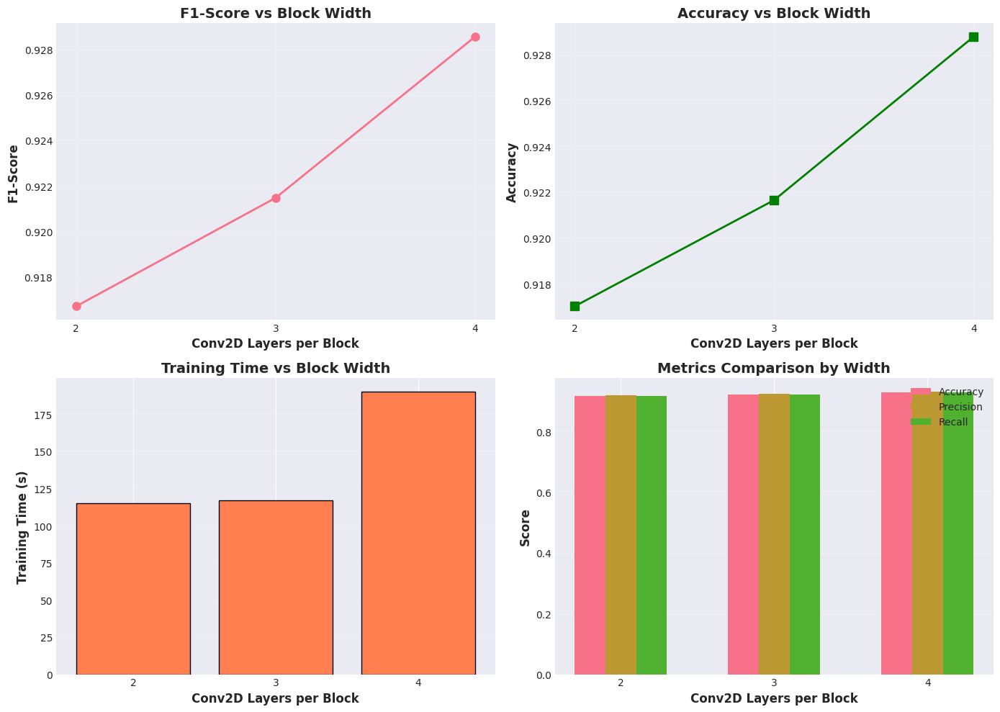

In [21]:
# Visualize width experiment results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

width_convs = [r["convs_per_block"] for r in width_results]
width_f1 = [r["f1"] for r in width_results]
width_accuracy = [r["accuracy"] for r in width_results]
width_train_time = [r["train_time"] for r in width_results]

# F1-Score vs Width
axes[0, 0].plot(
    width_convs,
    width_f1,
    marker="o",
    linewidth=2,
    markersize=8,
)
axes[0, 0].set_xlabel("Conv2D Layers per Block", fontsize=12, fontweight="bold")
axes[0, 0].set_ylabel("F1-Score", fontsize=12, fontweight="bold")
axes[0, 0].set_title("F1-Score vs Block Width", fontsize=14, fontweight="bold")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].set_xticks(width_convs)

# Accuracy vs Width
axes[0, 1].plot(
    width_convs,
    width_accuracy,
    marker="s",
    linewidth=2,
    markersize=8,
    color="green",
)
axes[0, 1].set_xlabel("Conv2D Layers per Block", fontsize=12, fontweight="bold")
axes[0, 1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
axes[0, 1].set_title("Accuracy vs Block Width", fontsize=14, fontweight="bold")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].set_xticks(width_convs)

# Training Time vs Width
axes[1, 0].bar(
    width_convs,
    width_train_time,
    color="coral",
    edgecolor="black",
)
axes[1, 0].set_xlabel("Conv2D Layers per Block", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Training Time (s)", fontsize=12, fontweight="bold")
axes[1, 0].set_title("Training Time vs Block Width", fontsize=14, fontweight="bold")
axes[1, 0].grid(axis="y", alpha=0.3)
axes[1, 0].set_xticks(width_convs)

# All metrics comparison
x = np.arange(len(width_convs))
width_bar = 0.2
axes[1, 1].bar(x - width_bar, width_accuracy, width_bar, label="Accuracy")
axes[1, 1].bar(x, [r["precision"] for r in width_results], width_bar, label="Precision")
axes[1, 1].bar(
    x + width_bar, [r["recall"] for r in width_results], width_bar, label="Recall"
)
axes[1, 1].set_xlabel("Conv2D Layers per Block", fontsize=12, fontweight="bold")
axes[1, 1].set_ylabel("Score", fontsize=12, fontweight="bold")
axes[1, 1].set_title("Metrics Comparison by Width", fontsize=14, fontweight="bold")
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(width_convs)
axes[1, 1].legend()
axes[1, 1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Training Curves for: CNN Width 2


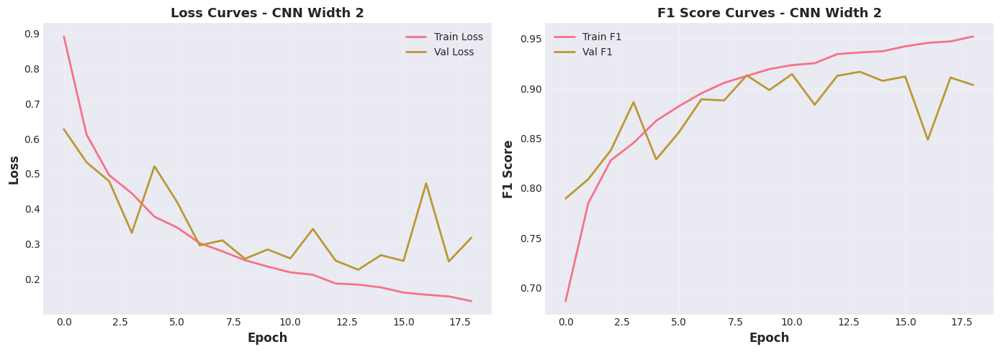


Training Curves for: CNN Width 3


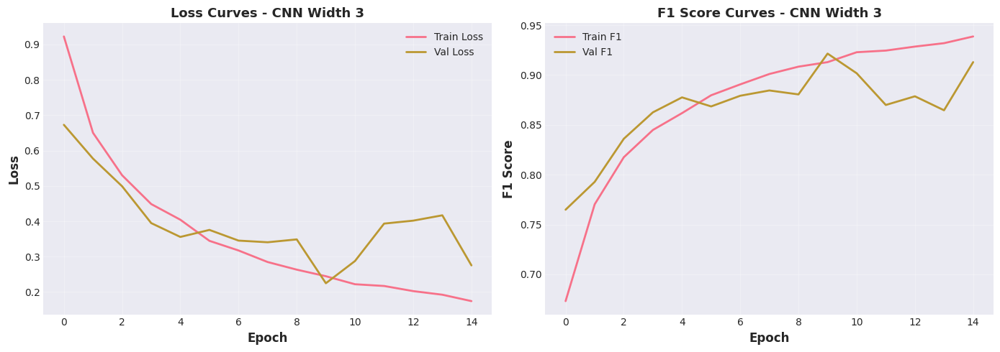


Training Curves for: CNN Width 4


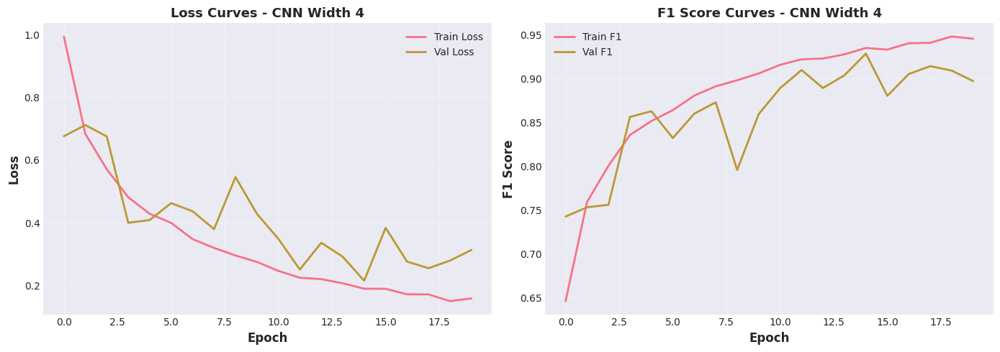

In [22]:
# Training curves for all width configurations
for result in width_results:
    print(f"\nTraining Curves for: {result['model_name']}")
    plot_training_curves(result["history"], result["model_name"])

In [39]:
best_width = 4
best_width_f1 = 0.9285

print(f"Best block width       : {best_width} Conv2D layer(s) per block")
print(f"Best F1-Score          : {best_width_f1:.4f}")
print(f"This width will be used for Experiment 3 (Number of Filters).")

Best block width       : 4 Conv2D layer(s) per block
Best F1-Score          : 0.9285
This width will be used for Experiment 3 (Number of Filters).


## Experiment 3: Number of Filters

Investigating the impact of the number of filters in convolutional layers.

Using the best depth and width from previous experiments, testing architectures with different base filter configurations: **16 and 32 (doubled after each max pooling)**. All configurations use:
- **ELU activation** function
- **He initialization** for weights  
- **Batch Normalization** before and after each convolutional layer
- **Early stopping** on validation F1 score

In [24]:
def build_filter_model(
    num_blocks, convs_per_block, num_classes, base_filters, input_shape=(64, 64, 3)
):
    """
    Build a CNN to test different filter configurations.
    Uses ELU activation, He initialization, and Batch Normalization.
    Doubles the number of filters after each MaxPooling layer.

    Args:
        num_blocks: Number of blocks (Conv2D layers + MaxPooling)
        convs_per_block: Number of Conv2D layers in each block before MaxPooling
        num_classes: Number of output classes
        base_filters: Number of filters in the first block
        input_shape: Shape of input images

    Returns:
        Compiled Keras model
    """
    model = keras.Sequential(name=f"filter_model_{base_filters}_filters")
    model.add(layers.Input(shape=input_shape))

    for block in range(num_blocks):
        # Calculate number of filters for this block (doubles after each pooling)
        current_filters = base_filters * (2**block)

        # Add multiple Conv2D layers per block
        for conv in range(convs_per_block):
            # Batch Normalization before Conv2D
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_pre")
            )

            # Conv2D layer with ELU activation and He initialization
            model.add(
                layers.Conv2D(
                    current_filters,
                    (3, 3),
                    activation="elu",
                    padding="same",
                    kernel_initializer="he_normal",
                    name=f"block{block+1}_conv{conv+1}",
                )
            )

            # Batch Normalization after Conv2D
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_post")
            )

        # MaxPooling layer after all convs in the block
        model.add(layers.MaxPooling2D((2, 2), name=f"block{block+1}_maxpool"))

    # Flatten and dense layers
    model.add(layers.Flatten(name="flatten"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_1"
        )
    )
    model.add(layers.BatchNormalization(name="dense_1_bn"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_2"
        )
    )
    model.add(layers.BatchNormalization(name="dense_2_bn"))
    model.add(layers.Dense(num_classes, activation="softmax", name="output"))

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=[SparseF1Score(num_classes=num_classes, average="weighted")],
    )

    return model

In [25]:
# Test different filter configurations
filter_configs = [16, 32]
filter_results = []

print(f"Using best depth from Experiment 1: {best_depth} block(s)")
print(f"Using best width from Experiment 2: {best_width} Conv2D layer(s) per block")

for base_filters in filter_configs:
    print(f"Testing CNN with base filters: {base_filters}")

    # Build model
    model = build_filter_model(best_depth, best_width, len(class_names), base_filters)

    # Print architecture
    print(f"\nArchitecture Summary:")
    model.summary()

    # Train and evaluate
    result = evaluate_model(
        model,
        X_train,
        X_val,
        y_train,
        y_val,
        f"CNN Filters {base_filters}",
        epochs=30,
    )
    result["base_filters"] = base_filters
    result["num_blocks"] = best_depth
    result["convs_per_block"] = best_width
    filter_results.append(result)
    
    del model
    tf.keras.backend.clear_session()
    gc.collect()

Using best depth from Experiment 1: 4 block(s)
Using best width from Experiment 2: 4 Conv2D layer(s) per block
Testing CNN with base filters: 16

Architecture Summary:


Model: "filter_model_16_filters"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │             

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN Filters 16...
Epoch 1/30


2026-01-11 14:49:27.207183: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:49:27.784030: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_8849', 520 bytes spill stores, 520 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - f1_score: 0.6774 - loss: 0.9109 - val_f1_score: 0.7487 - val_loss: 0.7201
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8090 - loss: 0.5626 - val_f1_score: 0.7752 - val_loss: 0.6944
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - f1_score: 0.8587 - loss: 0.4221 - val_f1_score: 0.8859 - val_loss: 0.3202
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8816 - loss: 0.3514 - val_f1_score: 0.8912 - val_loss: 0.3368
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - f1_score: 0.8977 - loss: 0.3002 - val_f1_score: 0.8703 - val_loss: 0.3985
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - f1_score: 0.9111 - loss: 0.2648 - val_f1_score: 0.9008 - val_loss: 0.3021
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.9167 - loss: 0.2480 - val_f1_score: 0.9114 - val_loss: 0.2648
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.9291 - loss: 0.2086 - val_f1_score: 0

Model: "filter_model_32_filters"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_post            │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │             

 Total params: 3,297,526 (12.58 MB)

 Trainable params: 3,289,840 (12.55 MB)

 Non-trainable params: 7,686 (30.02 KB)


Training CNN Filters 32...
Epoch 1/30


2026-01-11 14:52:26.283282: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 14:52:26.971762: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_8849', 520 bytes spill stores, 520 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - f1_score: 0.6020 - loss: 1.1581

2026-01-11 14:53:03.911860: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_766', 8 bytes spill stores, 8 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 50s 46ms/step - f1_score: 0.6739 - loss: 0.9360 - val_f1_score: 0.6802 - val_loss: 1.0196
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - f1_score: 0.7885 - loss: 0.6184 - val_f1_score: 0.7870 - val_loss: 0.6444
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - f1_score: 0.8428 - loss: 0.4696 - val_f1_score: 0.6828 - val_loss: 1.5663
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - f1_score: 0.8689 - loss: 0.3921 - val_f1_score: 0.8577 - val_loss: 0.4931
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - f1_score: 0.8873 - loss: 0.3371 - val_f1_score: 0.8935 - val_loss: 0.3149
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - f1_score: 0.9021 - loss: 0.2961 - val_f1_score: 0.9091 - val_loss: 0.2551
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - f1_score: 0.9120 - loss: 0.2603 - val_f1_score: 0.9132 - val_loss: 0.2502
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - f1_score: 0.9207 - loss: 0.2379 - val_f1_scor

### Experiment 3: Results Summary

In [26]:
# Compare filter experiment results in a table
filter_summary = pd.DataFrame(
    {
        "Base Filters": [r["base_filters"] for r in filter_results],
        "Model": [r["model_name"] for r in filter_results],
        "Val Accuracy": [f"{r['accuracy']:.4f}" for r in filter_results],
        "Val Precision": [f"{r['precision']:.4f}" for r in filter_results],
        "Val Recall": [f"{r['recall']:.4f}" for r in filter_results],
        "Val F1-Score": [f"{r['f1']:.4f}" for r in filter_results],
        "Train Time (s)": [f"{r['train_time']:.2f}" for r in filter_results],
        "Predict Time (s)": [f"{r['predict_time']:.2f}" for r in filter_results],
    }
)

print(f"Experiment 3: Number of Filters Results")
display(filter_summary)

Experiment 3: Number of Filters Results


,Base Filters,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,16,CNN Filters 16,0.9437,0.9442,0.9437,0.9437,177.40,3.13
1,32,CNN Filters 32,0.9391,0.9431,0.9391,0.9392,387.07,3.42


In [27]:
# Save Experiment 3 results to CSV
filter_summary.to_csv("results/results_experiment3_filters.csv", index=False)
print("\nResults saved to: results_experiment3_filters.csv")


Results saved to: results_experiment3_filters.csv


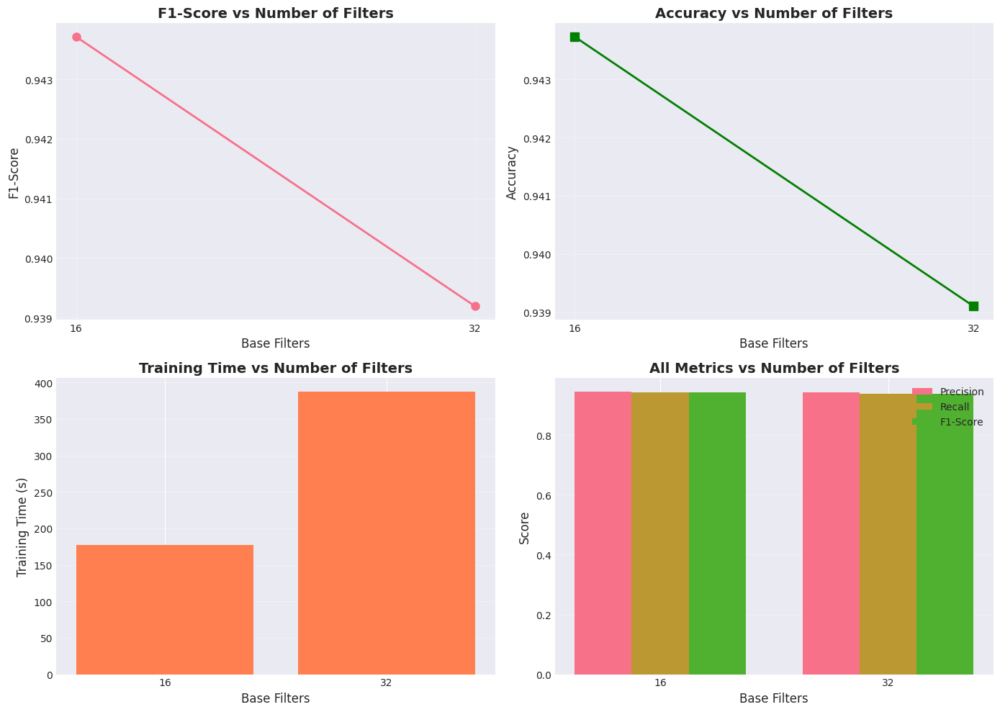

In [28]:
# Visualize filter experiment results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

filter_bases = [r["base_filters"] for r in filter_results]

# F1-Score comparison
axes[0, 0].plot(
    filter_bases,
    [r["f1"] for r in filter_results],
    marker="o",
    linewidth=2,
    markersize=8,
)
axes[0, 0].set_xlabel("Base Filters", fontsize=12)
axes[0, 0].set_ylabel("F1-Score", fontsize=12)
axes[0, 0].set_title("F1-Score vs Number of Filters", fontsize=14, fontweight="bold")
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_xticks(filter_bases)

# Accuracy comparison
axes[0, 1].plot(
    filter_bases,
    [r["accuracy"] for r in filter_results],
    marker="s",
    linewidth=2,
    markersize=8,
    color="green",
)
axes[0, 1].set_xlabel("Base Filters", fontsize=12)
axes[0, 1].set_ylabel("Accuracy", fontsize=12)
axes[0, 1].set_title("Accuracy vs Number of Filters", fontsize=14, fontweight="bold")
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xticks(filter_bases)

# Training time comparison
axes[1, 0].bar(
    range(len(filter_bases)), [r["train_time"] for r in filter_results], color="coral"
)
axes[1, 0].set_xlabel("Base Filters", fontsize=12)
axes[1, 0].set_ylabel("Training Time (s)", fontsize=12)
axes[1, 0].set_title(
    "Training Time vs Number of Filters", fontsize=14, fontweight="bold"
)
axes[1, 0].set_xticks(range(len(filter_bases)))
axes[1, 0].set_xticklabels(filter_bases)
axes[1, 0].grid(True, alpha=0.3, axis="y")

# All metrics comparison
metrics_data = {
    "Precision": [r["precision"] for r in filter_results],
    "Recall": [r["recall"] for r in filter_results],
    "F1-Score": [r["f1"] for r in filter_results],
}
x = np.arange(len(filter_bases))
width = 0.25

for i, (metric_name, metric_values) in enumerate(metrics_data.items()):
    axes[1, 1].bar(x + i * width, metric_values, width, label=metric_name)

axes[1, 1].set_xlabel("Base Filters", fontsize=12)
axes[1, 1].set_ylabel("Score", fontsize=12)
axes[1, 1].set_title("All Metrics vs Number of Filters", fontsize=14, fontweight="bold")
axes[1, 1].set_xticks(x + width)
axes[1, 1].set_xticklabels(filter_bases)
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3, axis="y")

plt.tight_layout()
plt.show()


Training Curves for: CNN Filters 16


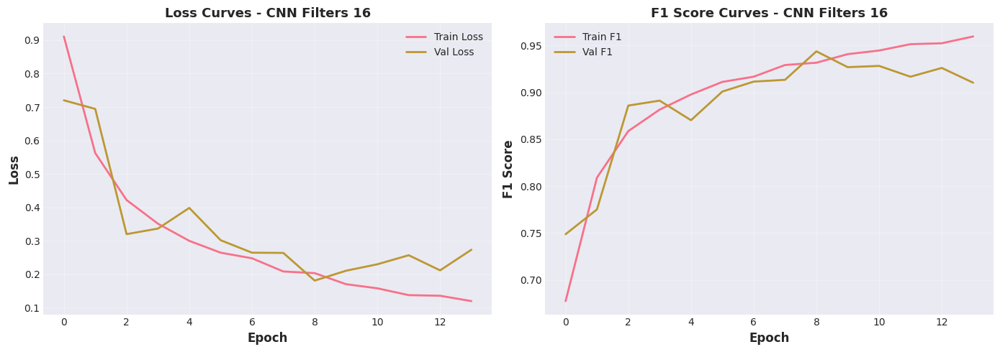


Training Curves for: CNN Filters 32


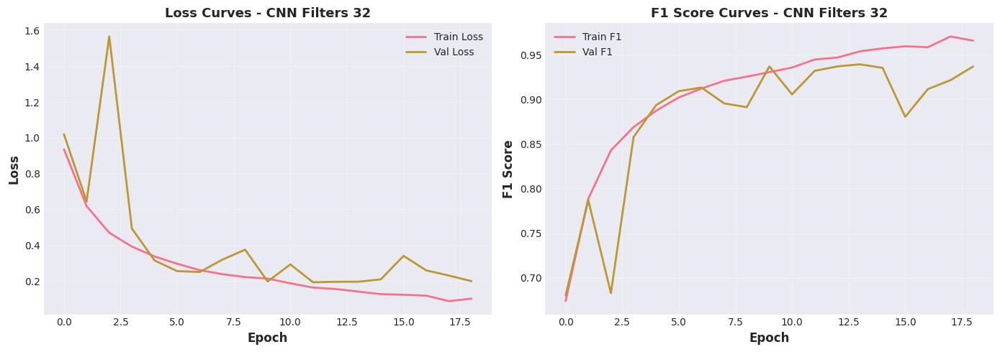

In [29]:
# Training curves for all filters configurations
for result in filter_results:
    print(f"\nTraining Curves for: {result['model_name']}")
    plot_training_curves(result["history"], result["model_name"])

In [41]:
best_filter = 16
best_filter_f1 = 0.9437

print(f"Best base filters      : {best_filter}")
print(f"Best F1-Score          : {best_filter_f1:.4f}")
print(f"These base filters will be used for Experiment 4 (Dropout).")

Best base filters      : 16
Best F1-Score          : 0.9437
These base filters will be used for Experiment 4 (Dropout).


## Experiment 4: Dropout Regularization

Investigating the impact of dropout regularization on model performance.

Using the optimal architecture from previous experiments, testing different dropout rates: **0.0 (no dropout), 0.2, 0.4, and 0.6**. Dropout is applied after each MaxPooling layer and after the Flatten layer.

In [31]:
def build_dropout_model(
    num_blocks,
    convs_per_block,
    num_classes,
    dropout_rate=0.3,
    input_shape=(64, 64, 3),
    base_filters=32,
):
    """
    Build a CNN with dropout regularization.
    Doubles the number of filters after each MaxPooling layer.

    Args:
        num_blocks: Number of blocks
        convs_per_block: Number of Conv2D layers per block
        num_classes: Number of output classes
        dropout_rate: Dropout rate (0.0 = no dropout)
        input_shape: Shape of input images
        base_filters: Base number of filters in the first block

    Returns:
        Compiled Keras model
    """
    model = keras.Sequential(name=f"dropout_model_dr{dropout_rate}")
    model.add(layers.Input(shape=input_shape))

    for block in range(num_blocks):
        # Calculate number of filters for this block (doubles after each pooling)
        current_filters = base_filters * (2**block)

        for conv in range(convs_per_block):
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_pre")
            )
            model.add(
                layers.Conv2D(
                    current_filters,
                    (3, 3),
                    activation="elu",
                    padding="same",
                    kernel_initializer="he_normal",
                    name=f"block{block+1}_conv{conv+1}",
                )
            )
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_post")
            )

        model.add(layers.MaxPooling2D((2, 2), name=f"block{block+1}_maxpool"))

        # Dropout after MaxPooling
        if dropout_rate > 0:
            model.add(layers.Dropout(dropout_rate, name=f"block{block+1}_dropout"))

    model.add(layers.Flatten(name="flatten"))

    # Dropout after Flatten
    if dropout_rate > 0:
        model.add(layers.Dropout(dropout_rate, name="flatten_dropout"))

    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_1"
        )
    )
    model.add(layers.BatchNormalization(name="dense_1_bn"))
    model.add(
        layers.Dense(
            128, activation="elu", kernel_initializer="he_normal", name="dense_2"
        )
    )
    model.add(layers.BatchNormalization(name="dense_2_bn"))
    model.add(layers.Dense(num_classes, activation="softmax", name="output"))

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=[SparseF1Score(num_classes=num_classes, average="weighted")],
    )

    return model

In [32]:
# Test different dropout rates
dropout_configs = [0.0, 0.2, 0.4, 0.6]
dropout_results = []

print(
    f"Using optimal architecture: {best_depth} blocks, {best_width} convs/block, {best_filter} base filters"
)

for dropout_rate in dropout_configs:
    print(f"Testing CNN with dropout rate: {dropout_rate}")

    # Build model
    model = build_dropout_model(
        best_depth,
        best_width,
        len(class_names),
        dropout_rate=dropout_rate,
        base_filters=best_filter,
    )

    # Print architecture
    print(f"\nArchitecture Summary:")
    model.summary()

    # Train and evaluate
    result = evaluate_model(
        model,
        X_train,
        X_val,
        y_train,
        y_val,
        f"CNN Dropout {dropout_rate}",
        epochs=30,
    )
    result["dropout_rate"] = dropout_rate
    dropout_results.append(result)
    
    del model
    tf.keras.backend.clear_session()
    gc.collect()

Using optimal architecture: 4 blocks, 4 convs/block, 16 base filters
Testing CNN with dropout rate: 0.0

Architecture Summary:


Model: "dropout_model_dr0.0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │             

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN Dropout 0.0...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - f1_score: 0.6870 - loss: 0.8995 - val_f1_score: 0.7463 - val_loss: 0.7575
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8047 - loss: 0.5749 - val_f1_score: 0.7965 - val_loss: 0.6514
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8493 - loss: 0.4470 - val_f1_score: 0.8408 - val_loss: 0.4737
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - f1_score: 0.8745 - loss: 0.3654 - val_f1_score: 0.8933 - val_loss: 0.3435
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - f1_score: 0.8949 - loss: 0.3194 - val_f1_score: 0.8620 - val_loss: 0.4494
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.9031 - loss: 0.2833 - val_f1_score: 0.9025 - val_loss: 0.2883
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.9166 - loss: 0.2471 - val_f1_score: 0.8893 - val_loss: 0.3303
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - f1_score:

Model: "dropout_model_dr0.2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN Dropout 0.2...
Epoch 1/30


2026-01-11 15:03:38.173297: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 15:03:38.733474: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_10710', 520 bytes spill stores, 520 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - f1_score: 0.6524 - loss: 0.9716 - val_f1_score: 0.7193 - val_loss: 0.8736
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.7730 - loss: 0.6582 - val_f1_score: 0.8029 - val_loss: 0.5976
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - f1_score: 0.8185 - loss: 0.5311 - val_f1_score: 0.8318 - val_loss: 0.5031
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - f1_score: 0.8554 - loss: 0.4299 - val_f1_score: 0.8749 - val_loss: 0.3617
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8734 - loss: 0.3701 - val_f1_score: 0.8735 - val_loss: 0.3655
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8856 - loss: 0.3462 - val_f1_score: 0.9150 - val_loss: 0.2420
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8921 - loss: 0.3185 - val_f1_score: 0.9089 - val_loss: 0.2837
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - f1_score: 0.9034 - loss: 0.2851 - val_f1_score: 0

Model: "dropout_model_dr0.4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN Dropout 0.4...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - f1_score: 0.6190 - loss: 1.0682 - val_f1_score: 0.5777 - val_loss: 2.3051
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - f1_score: 0.7414 - loss: 0.7262 - val_f1_score: 0.7180 - val_loss: 0.8217
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.7889 - loss: 0.6100 - val_f1_score: 0.8241 - val_loss: 0.5191
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8162 - loss: 0.5385 - val_f1_score: 0.8530 - val_loss: 0.4409
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8387 - loss: 0.4827 - val_f1_score: 0.7646 - val_loss: 0.8327
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - f1_score: 0.8576 - loss: 0.4269 - val_f1_score: 0.7952 - val_loss: 0.5687
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8727 - loss: 0.3797 - val_f1_score: 0.8769 - val_loss: 0.3728
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 

Model: "dropout_model_dr0.6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN Dropout 0.6...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - f1_score: 0.5248 - loss: 1.2808 - val_f1_score: 0.3150 - val_loss: 5.2764
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.6896 - loss: 0.8529 - val_f1_score: 0.4892 - val_loss: 1.8595
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - f1_score: 0.7328 - loss: 0.7501 - val_f1_score: 0.5260 - val_loss: 1.6867
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.7566 - loss: 0.6828 - val_f1_score: 0.5309 - val_loss: 1.6504
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.7783 - loss: 0.6308 - val_f1_score: 0.7074 - val_loss: 0.9421
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 0.8101 - loss: 0.5613 - val_f1_score: 0.7668 - val_loss: 0.7220
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - f1_score: 0.8222 - loss: 0.5291 - val_f1_score: 0.6421 - val_loss: 1.0286
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - f1_score: 

### Experiment 4: Results Summary

In [34]:
# Compare dropout experiment results
dropout_summary = pd.DataFrame(
    {
        "Dropout Rate": [r["dropout_rate"] for r in dropout_results],
        "Model": [r["model_name"] for r in dropout_results],
        "Val Accuracy": [f"{r['accuracy']:.4f}" for r in dropout_results],
        "Val Precision": [f"{r['precision']:.4f}" for r in dropout_results],
        "Val Recall": [f"{r['recall']:.4f}" for r in dropout_results],
        "Val F1-Score": [f"{r['f1']:.4f}" for r in dropout_results],
        "Train Time (s)": [f"{r['train_time']:.2f}" for r in dropout_results],
        "Predict Time (s)": [f"{r['predict_time']:.2f}" for r in dropout_results],
    }
)

print(f"Experiment 4: Dropout Regularization Results")
display(dropout_summary)

Experiment 4: Dropout Regularization Results


,Dropout Rate,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,0.0,CNN Dropout 0.0,0.9398,0.9411,0.9398,0.9397,248.93,2.65
1,0.2,CNN Dropout 0.2,0.9580,0.9583,0.9580,0.9580,320.94,2.69
2,0.4,CNN Dropout 0.4,0.9469,0.9482,0.9469,0.9468,266.59,2.66
3,0.6,CNN Dropout 0.6,0.9085,0.9227,0.9085,0.9074,291.60,2.72


In [35]:
# Save Experiment 4 results to CSV
dropout_summary.to_csv("results/results_experiment4_dropout.csv", index=False)
print("\nResults saved to: results_experiment4_dropout.csv")


Results saved to: results_experiment4_dropout.csv


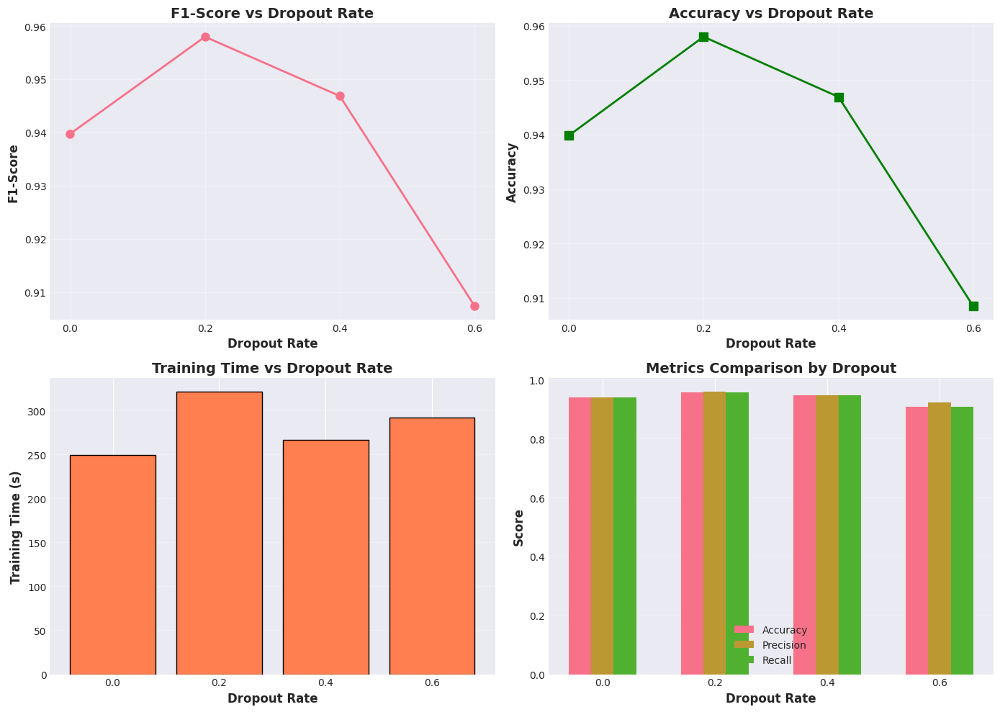

In [36]:
# Visualize dropout experiment results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

dropout_rates = [r["dropout_rate"] for r in dropout_results]
dropout_f1 = [r["f1"] for r in dropout_results]
dropout_accuracy = [r["accuracy"] for r in dropout_results]
dropout_train_time = [r["train_time"] for r in dropout_results]

# F1-Score vs Dropout
axes[0, 0].plot(dropout_rates, dropout_f1, marker="o", linewidth=2, markersize=8)
axes[0, 0].set_xlabel("Dropout Rate", fontsize=12, fontweight="bold")
axes[0, 0].set_ylabel("F1-Score", fontsize=12, fontweight="bold")
axes[0, 0].set_title("F1-Score vs Dropout Rate", fontsize=14, fontweight="bold")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].set_xticks(dropout_rates)

# Accuracy vs Dropout
axes[0, 1].plot(
    dropout_rates,
    dropout_accuracy,
    marker="s",
    linewidth=2,
    markersize=8,
    color="green",
)
axes[0, 1].set_xlabel("Dropout Rate", fontsize=12, fontweight="bold")
axes[0, 1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
axes[0, 1].set_title("Accuracy vs Dropout Rate", fontsize=14, fontweight="bold")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].set_xticks(dropout_rates)

# Training Time vs Dropout
x_pos = np.arange(len(dropout_rates))
axes[1, 0].bar(
    x_pos,
    dropout_train_time,
    color="coral",
    edgecolor="black",
)
axes[1, 0].set_xlabel("Dropout Rate", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Training Time (s)", fontsize=12, fontweight="bold")
axes[1, 0].set_title("Training Time vs Dropout Rate", fontsize=14, fontweight="bold")
axes[1, 0].grid(axis="y", alpha=0.3)
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(dropout_rates)

# All metrics comparison
x = np.arange(len(dropout_rates))
width = 0.2
axes[1, 1].bar(x - width, dropout_accuracy, width, label="Accuracy")
axes[1, 1].bar(x, [r["precision"] for r in dropout_results], width, label="Precision")
axes[1, 1].bar(x + width, [r["recall"] for r in dropout_results], width, label="Recall")
axes[1, 1].set_xlabel("Dropout Rate", fontsize=12, fontweight="bold")
axes[1, 1].set_ylabel("Score", fontsize=12, fontweight="bold")
axes[1, 1].set_title("Metrics Comparison by Dropout", fontsize=14, fontweight="bold")
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(dropout_rates)
axes[1, 1].legend()
axes[1, 1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Training Curves for: CNN Dropout 0.0


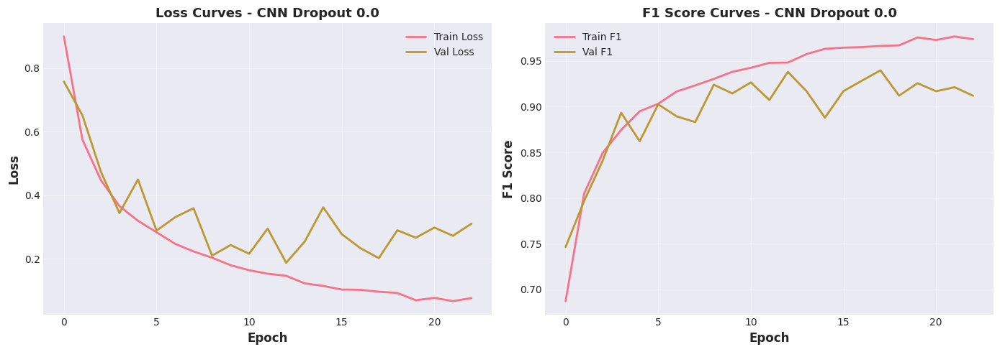


Training Curves for: CNN Dropout 0.2


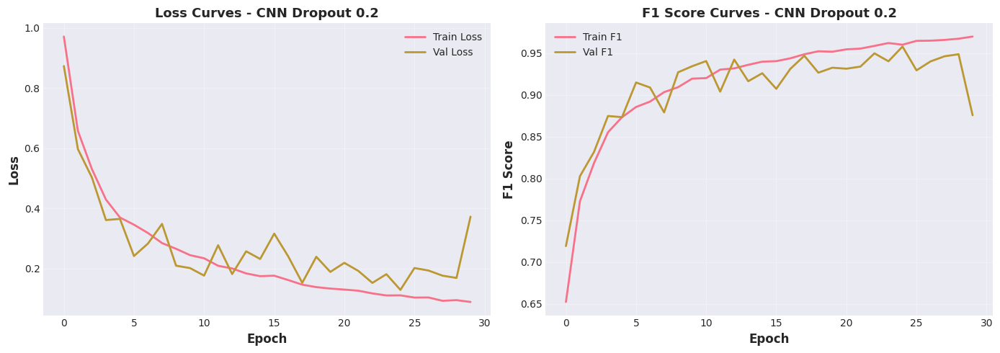


Training Curves for: CNN Dropout 0.4


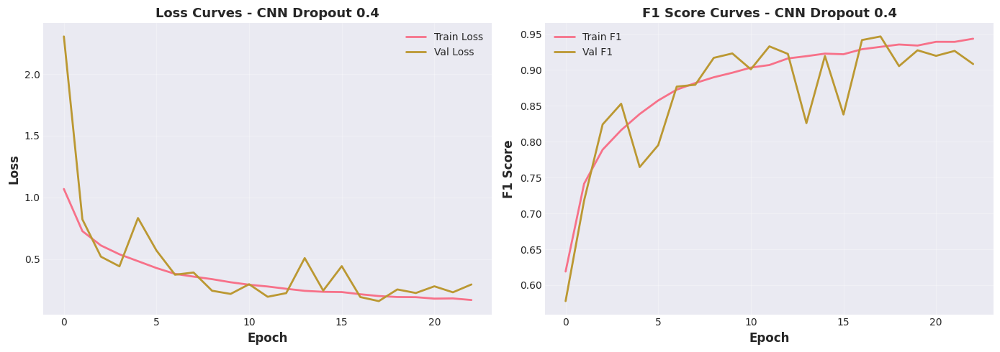


Training Curves for: CNN Dropout 0.6


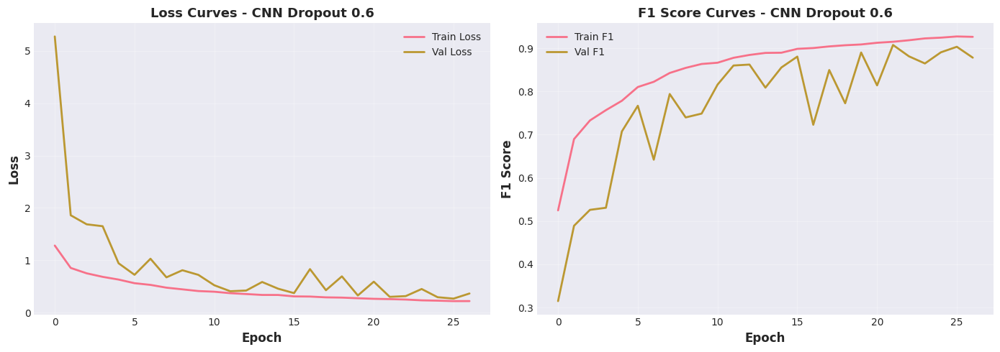

In [37]:
# Training curves for all dropout configurations
for result in dropout_results:
    print(f"\nTraining Curves for: {result['model_name']}")
    plot_training_curves(result["history"], result["model_name"])

In [43]:
best_dropout = 0.2
best_dropout_f1 = 0.9580

print(f"\nBest dropout rate      : {best_dropout}")
print(f"Best F1-Score          : {best_dropout_f1:.4f}")
print(f"This dropout rate will be used for Experiment 5 (L2 Regularization).")


Best dropout rate      : 0.2
Best F1-Score          : 0.9580
This dropout rate will be used for Experiment 5 (L2 Regularization).


## Experiment 5: L2 Regularization

Investigating the impact of L2 regularization on the convolutional and dense layers.

Using the optimal architecture and best dropout rate, testing different L2 regularization strengths: **0.0 (no L2), 0.00001, 0.0001 and 0.001**.

In [11]:
def build_l2_model(
    num_blocks,
    convs_per_block,
    num_classes,
    dropout_rate=0.3,
    l2_strength=0.001,
    input_shape=(64, 64, 3),
    base_filters=32,
):
    """
    Build a CNN with L2 regularization.
    Doubles the number of filters after each MaxPooling layer.

    Args:
        num_blocks: Number of blocks
        convs_per_block: Number of Conv2D layers per block
        num_classes: Number of output classes
        dropout_rate: Dropout rate
        l2_strength: L2 regularization strength (0.0 = no L2)
        input_shape: Shape of input images
        base_filters: Base number of filters in the first block

    Returns:
        Compiled Keras model
    """

    model = keras.Sequential(name=f"l2_model_l2{l2_strength}")
    model.add(layers.Input(shape=input_shape))

    for block in range(num_blocks):
        # Calculate number of filters for this block (doubles after each pooling)
        current_filters = base_filters * (2**block)

        for conv in range(convs_per_block):
            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_pre")
            )

            # Add L2 regularization to Conv2D
            if l2_strength > 0:
                model.add(
                    layers.Conv2D(
                        current_filters,
                        (3, 3),
                        activation="elu",
                        padding="same",
                        kernel_initializer="he_normal",
                        kernel_regularizer=regularizers.l2(l2_strength),
                        name=f"block{block+1}_conv{conv+1}",
                    )
                )
            else:
                model.add(
                    layers.Conv2D(
                        current_filters,
                        (3, 3),
                        activation="elu",
                        padding="same",
                        kernel_initializer="he_normal",
                        name=f"block{block+1}_conv{conv+1}",
                    )
                )

            model.add(
                layers.BatchNormalization(name=f"block{block+1}_conv{conv+1}_bn_post")
            )

        model.add(layers.MaxPooling2D((2, 2), name=f"block{block+1}_maxpool"))

        if dropout_rate > 0:
            model.add(layers.Dropout(dropout_rate, name=f"block{block+1}_dropout"))

    model.add(layers.Flatten(name="flatten"))

    if dropout_rate > 0:
        model.add(layers.Dropout(dropout_rate, name="flatten_dropout"))

    # Add L2 regularization to Dense layers
    if l2_strength > 0:
        model.add(
            layers.Dense(
                128,
                activation="elu",
                kernel_initializer="he_normal",
                kernel_regularizer=regularizers.l2(l2_strength),
                name="dense_1",
            )
        )
    else:
        model.add(
            layers.Dense(
                128, activation="elu", kernel_initializer="he_normal", name="dense_1"
            )
        )

    model.add(layers.BatchNormalization(name="dense_1_bn"))

    if l2_strength > 0:
        model.add(
            layers.Dense(
                128,
                activation="elu",
                kernel_initializer="he_normal",
                kernel_regularizer=regularizers.l2(l2_strength),
                name="dense_2",
            )
        )
    else:
        model.add(
            layers.Dense(
                128, activation="elu", kernel_initializer="he_normal", name="dense_2"
            )
        )

    model.add(layers.BatchNormalization(name="dense_2_bn"))
    model.add(layers.Dense(num_classes, activation="softmax", name="output"))

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=[SparseF1Score(num_classes=num_classes, average="weighted")],
    )

    return model

In [13]:
# Test different L2 regularization strengths
l2_configs = [0.0, 0.00001, 0.0001, 0.001]
l2_results = []

print(
    f"Using optimal architecture: {best_depth} blocks, {best_width} convs/block, {best_filter} base filters"
)
print(f"Using best dropout rate: {best_dropout}")

for l2_strength in l2_configs:
    print(f"Testing CNN with L2 regularization: {l2_strength}")

    # Build model
    model = build_l2_model(
        best_depth,
        best_width,
        len(class_names),
        dropout_rate=best_dropout,
        l2_strength=l2_strength,
        base_filters=best_filter,
    )

    # Print architecture
    print(f"\nArchitecture Summary:")
    model.summary()

    # Train and evaluate
    result = evaluate_model(
        model,
        X_train,
        X_val,
        y_train,
        y_val,
        f"CNN L2 {l2_strength}",
        epochs=30,
    )
    result["l2_strength"] = l2_strength
    l2_results.append(result)
    
    del model
    tf.keras.backend.clear_session()
    gc.collect()

Using optimal architecture: 4 blocks, 4 convs/block, 16 base filters
Using best dropout rate: 0.2
Testing CNN with L2 regularization: 0.0


I0000 00:00:1768142857.347351  227783 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3584 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6



Architecture Summary:


Model: "l2_model_l20.0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN L2 0.0...
Epoch 1/30


2026-01-11 15:47:48.191560: I external/local_xla/xla/service/service.cc:163] XLA service 0x7b2a98057840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-01-11 15:47:48.191585: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2026-01-11 15:47:48.401383: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-01-11 15:47:49.659462: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91701
2026-01-11 15:47:50.399891: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 15:47:50.

  1/588 ━━━━━━━━━━━━━━━━━━━━ 3:22:52 21s/step - f1_score: 0.2064 - loss: 2.7421

I0000 00:00:1768142880.232455  228089 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - f1_score: 0.5558 - loss: 1.2615

2026-01-11 15:48:23.709429: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 15:48:24.119688: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_786', 28 bytes spill stores, 28 bytes spill loads

2026-01-11 15:48:24.245482: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_786', 36 bytes spill stores, 36 bytes spill loads



588/588 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - f1_score: 0.6533 - loss: 0.9834 - val_f1_score: 0.6585 - val_loss: 1.2890
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.7858 - loss: 0.6146 - val_f1_score: 0.7987 - val_loss: 0.6237
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - f1_score: 0.8339 - loss: 0.4959 - val_f1_score: 0.8338 - val_loss: 0.5175
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8594 - loss: 0.4219 - val_f1_score: 0.8825 - val_loss: 0.3548
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8764 - loss: 0.3719 - val_f1_score: 0.8645 - val_loss: 0.4021
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8900 - loss: 0.3255 - val_f1_score: 0.9015 - val_loss: 0.2744
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - f1_score: 0.8981 - loss: 0.3071 - val_f1_score: 0.8369 - val_loss: 0.5570
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.9068 - loss: 0.2806 - val_f1_score: 0.

Model: "l2_model_l21e-05"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN L2 1e-05...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 39s 38ms/step - f1_score: 0.6429 - loss: 1.0384 - val_f1_score: 0.6820 - val_loss: 0.9730
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.7735 - loss: 0.6897 - val_f1_score: 0.7057 - val_loss: 1.0007
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8256 - loss: 0.5377 - val_f1_score: 0.8558 - val_loss: 0.4596
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 13s 19ms/step - f1_score: 0.8506 - loss: 0.4734 - val_f1_score: 0.8553 - val_loss: 0.4613
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8723 - loss: 0.4075 - val_f1_score: 0.8703 - val_loss: 0.4434
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8806 - loss: 0.3928 - val_f1_score: 0.9102 - val_loss: 0.2966
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - f1_score: 0.8997 - loss: 0.3388 - val_f1_score: 0.9171 - val_loss: 0.2926
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.9

Model: "l2_model_l20.0001"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN L2 0.0001...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 39s 39ms/step - f1_score: 0.6600 - loss: 1.2124 - val_f1_score: 0.7517 - val_loss: 1.0300
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.7769 - loss: 0.8961 - val_f1_score: 0.7919 - val_loss: 0.9280
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8274 - loss: 0.7583 - val_f1_score: 0.8359 - val_loss: 0.7520
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - f1_score: 0.8587 - loss: 0.6674 - val_f1_score: 0.8740 - val_loss: 0.6373
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8716 - loss: 0.6211 - val_f1_score: 0.8664 - val_loss: 0.6124
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8842 - loss: 0.5818 - val_f1_score: 0.8957 - val_loss: 0.5474
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - f1_score: 0.8891 - loss: 0.5534 - val_f1_score: 0.9167 - val_loss: 0.4688
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.

Model: "l2_model_l20.001"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN L2 0.001...
Epoch 1/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 39s 38ms/step - f1_score: 0.6523 - loss: 3.1485 - val_f1_score: 0.4835 - val_loss: 3.2615
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.7640 - loss: 2.1217 - val_f1_score: 0.7619 - val_loss: 1.8636
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - f1_score: 0.8065 - loss: 1.5118 - val_f1_score: 0.6158 - val_loss: 1.9871
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8265 - loss: 1.1990 - val_f1_score: 0.8226 - val_loss: 1.0847
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.8352 - loss: 1.0375 - val_f1_score: 0.6261 - val_loss: 1.8848
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - f1_score: 0.8448 - loss: 0.9424 - val_f1_score: 0.7777 - val_loss: 1.1726
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - f1_score: 0.8541 - loss: 0.8789 - val_f1_score: 0.8344 - val_loss: 0.8792
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - f1_score: 0.

### Experiment 5: Results Summary

In [14]:
# Compare L2 experiment results
l2_summary = pd.DataFrame(
    {
        "L2 Strength": [r["l2_strength"] for r in l2_results],
        "Model": [r["model_name"] for r in l2_results],
        "Val Accuracy": [f"{r['accuracy']:.4f}" for r in l2_results],
        "Val Precision": [f"{r['precision']:.4f}" for r in l2_results],
        "Val Recall": [f"{r['recall']:.4f}" for r in l2_results],
        "Val F1-Score": [f"{r['f1']:.4f}" for r in l2_results],
        "Train Time (s)": [f"{r['train_time']:.2f}" for r in l2_results],
        "Predict Time (s)": [f"{r['predict_time']:.2f}" for r in l2_results],
    }
)

print(f"Experiment 5: L2 Regularization Results")
display(l2_summary)

Experiment 5: L2 Regularization Results


,L2 Strength,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,0.00000,CNN L2 0.0,0.9430,0.9439,0.9430,0.9427,206.41,2.62
1,0.00001,CNN L2 1e-05,0.9509,0.9513,0.9509,0.9509,285.28,2.63
2,0.00010,CNN L2 0.0001,0.9177,0.9234,0.9177,0.9167,144.60,2.60
3,0.00100,CNN L2 0.001,0.9103,0.9129,0.9103,0.9102,183.77,2.60


In [15]:
# Save Experiment 5 results to CSV
l2_summary.to_csv("results/results_experiment5_l2.csv", index=False)
print("\nResults saved to: results_experiment5_l2.csv")


Results saved to: results_experiment5_l2.csv


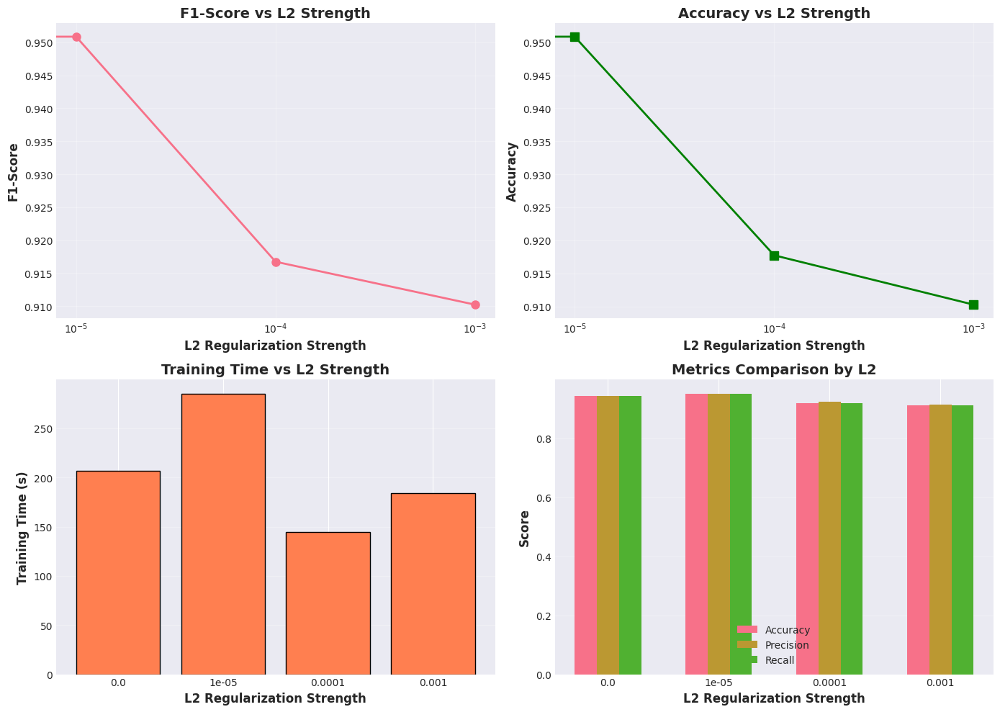

In [16]:
# Visualize L2 experiment results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

l2_strengths = [r["l2_strength"] for r in l2_results]
l2_f1 = [r["f1"] for r in l2_results]
l2_accuracy = [r["accuracy"] for r in l2_results]
l2_train_time = [r["train_time"] for r in l2_results]

# F1-Score vs L2
axes[0, 0].plot(l2_strengths, l2_f1, marker="o", linewidth=2, markersize=8)
axes[0, 0].set_xlabel("L2 Regularization Strength", fontsize=12, fontweight="bold")
axes[0, 0].set_ylabel("F1-Score", fontsize=12, fontweight="bold")
axes[0, 0].set_title("F1-Score vs L2 Strength", fontsize=14, fontweight="bold")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].set_xscale("log")

# Accuracy vs L2
axes[0, 1].plot(
    l2_strengths,
    l2_accuracy,
    marker="s",
    linewidth=2,
    markersize=8,
    color="green",
)
axes[0, 1].set_xlabel("L2 Regularization Strength", fontsize=12, fontweight="bold")
axes[0, 1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
axes[0, 1].set_title("Accuracy vs L2 Strength", fontsize=14, fontweight="bold")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].set_xscale("log")

# Training Time vs L2
x_pos = np.arange(len(l2_strengths))
axes[1, 0].bar(
    x_pos,
    l2_train_time,
    color="coral",
    edgecolor="black",
)
axes[1, 0].set_xlabel("L2 Regularization Strength", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Training Time (s)", fontsize=12, fontweight="bold")
axes[1, 0].set_title("Training Time vs L2 Strength", fontsize=14, fontweight="bold")
axes[1, 0].grid(axis="y", alpha=0.3)
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(l2_strengths)

# All metrics comparison
x = np.arange(len(l2_strengths))
width = 0.2
axes[1, 1].bar(x - width, l2_accuracy, width, label="Accuracy")
axes[1, 1].bar(x, [r["precision"] for r in l2_results], width, label="Precision")
axes[1, 1].bar(x + width, [r["recall"] for r in l2_results], width, label="Recall")
axes[1, 1].set_xlabel("L2 Regularization Strength", fontsize=12, fontweight="bold")
axes[1, 1].set_ylabel("Score", fontsize=12, fontweight="bold")
axes[1, 1].set_title("Metrics Comparison by L2", fontsize=14, fontweight="bold")
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(l2_strengths)
axes[1, 1].legend()
axes[1, 1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Training Curves for: CNN L2 0.0


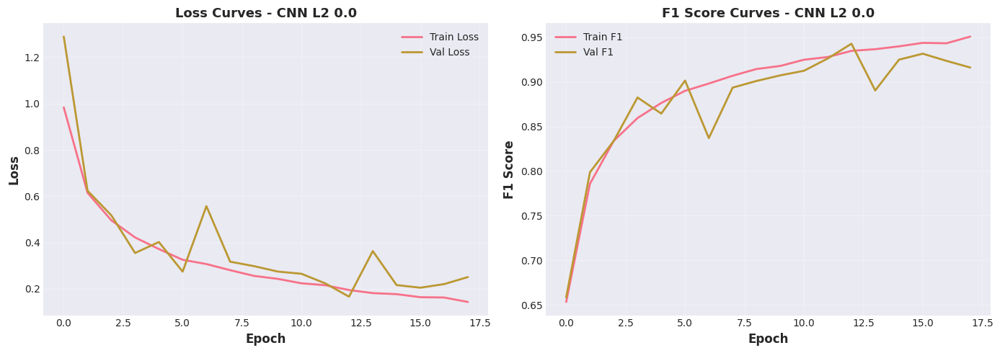


Training Curves for: CNN L2 1e-05


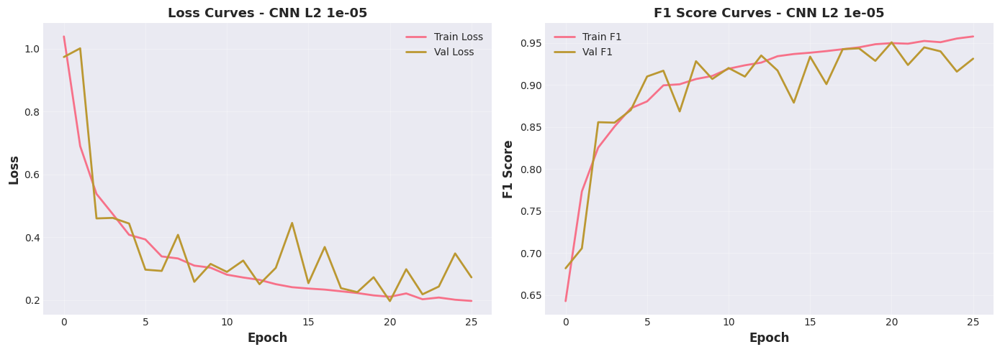


Training Curves for: CNN L2 0.0001


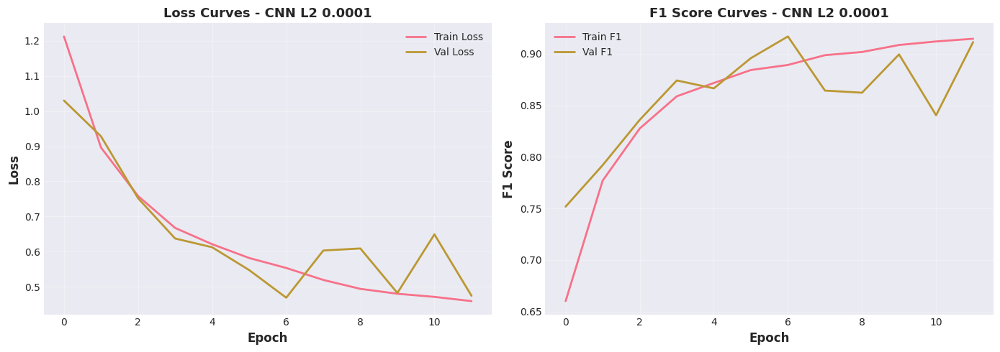


Training Curves for: CNN L2 0.001


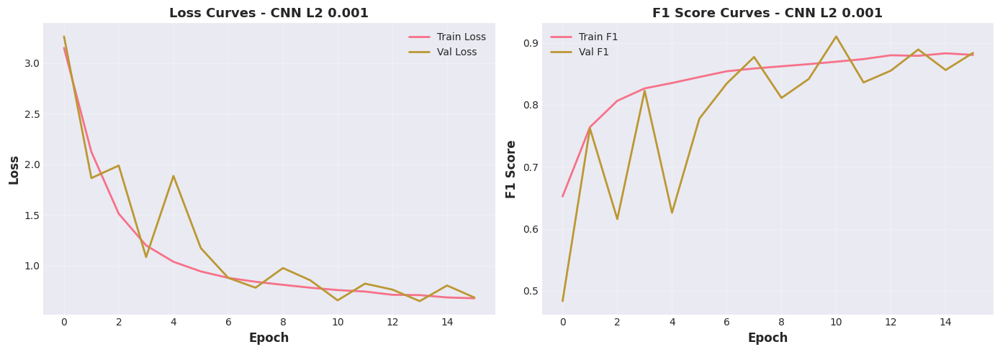

In [17]:
# Training curves for all L2 configurations
for result in l2_results:
    print(f"\nTraining Curves for: {result['model_name']}")
    plot_training_curves(result["history"], result["model_name"])

In [18]:
l2_summary

,L2 Strength,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,0.00000,CNN L2 0.0,0.9430,0.9439,0.9430,0.9427,206.41,2.62
1,0.00001,CNN L2 1e-05,0.9509,0.9513,0.9509,0.9509,285.28,2.63
2,0.00010,CNN L2 0.0001,0.9177,0.9234,0.9177,0.9167,144.60,2.60
3,0.00100,CNN L2 0.001,0.9103,0.9129,0.9103,0.9102,183.77,2.60


In [ ]:
best_l2 = 0.00001
best_l2_accuracy = 0.9509
best_l2_precision = 0.9513
best_l2_recall = 0.9509
best_l2_f1 = 0.9509
best_l2_train_time = 285.28
best_l2_predict_time = 2.63
best_l2_history = l2_results[1]["history"]
best_l2_model_name = l2_results[1]["model_name"]

print(f"\nBest L2 strength       : {best_l2}")
print(f"Best F1-Score          : {best_l2_f1:.4f}")
print(f"This L2 strength will be used for the final model.")


Best L2 strength       : 1e-05
Best F1-Score          : 0.9509
This L2 strength will be used for the final model.


## Experiment 6: Data Augmentation with Class Balancing

Testing data augmentation to balance all classes to 3000 samples each and investigate the impact on model performance.

Using random transformations (rotation, flip, zoom, shift) to augment smaller classes.

In [9]:
def augment_image(image):
    """Apply random augmentation to an image using TensorFlow."""
    # Convert numpy array to tensor if needed
    img = tf.convert_to_tensor(image, dtype=tf.float32)

    # Random horizontal flip
    img = tf.image.random_flip_left_right(img)

    # Random vertical flip
    img = tf.image.random_flip_up_down(img)

    # Random brightness adjustment
    img = tf.image.random_brightness(img, max_delta=0.1)

    # Random contrast adjustment
    img = tf.image.random_contrast(img, lower=0.9, upper=1.1)

    # Random zoom and translation using crop and resize
    height, width = img.shape[0], img.shape[1]
    # Random crop size between 90% and 100% of original
    crop_factor = tf.random.uniform([], 0.9, 1.0)
    new_height = tf.cast(tf.cast(height, tf.float32) * crop_factor, tf.int32)
    new_width = tf.cast(tf.cast(width, tf.float32) * crop_factor, tf.int32)
    img = tf.image.random_crop(img, [new_height, new_width, 3])
    img = tf.image.resize(img, [height, width])

    # Random rotation using TensorFlow operations (approximation using flip and transpose)
    # For more complex rotations, we can use simple 90-degree rotations
    k = tf.random.uniform([], 0, 4, dtype=tf.int32)
    img = tf.image.rot90(img, k=k)
    # Ensure output shape is correct
    img = tf.image.resize(img, [height, width])

    # Clip values to [0, 1]
    img = tf.clip_by_value(img, 0.0, 1.0)

    return img.numpy()


def balance_dataset(X, y, target_samples=3000):
    """Balance dataset by augmenting minority classes to target_samples."""
    print(f"\nBalancing dataset to {target_samples} samples per class...")

    # Check current class distribution
    unique_classes, class_counts = np.unique(y, return_counts=True)
    print("\nOriginal class distribution:")
    for cls, count in zip(unique_classes, class_counts):
        print(f"  Class {cls} ({class_names[cls]:20s}): {count:5d} samples")

    X_balanced = []
    y_balanced = []

    for cls in unique_classes:
        # Get samples for this class
        class_indices = np.where(y == cls)[0]
        class_samples = X[class_indices]
        current_count = len(class_samples)

        # Add original samples
        X_balanced.extend(class_samples)
        y_balanced.extend([cls] * current_count)

        # Augment if needed
        if current_count < target_samples:
            needed = target_samples - current_count
            print(
                f"\nAugmenting class {cls} ({class_names[cls]}): adding {needed} samples"
            )

            for _ in range(needed):
                # Randomly select an image from this class
                idx = np.random.randint(0, current_count)
                original_img = class_samples[idx]

                # Augment it
                augmented_img = augment_image(original_img)

                X_balanced.append(augmented_img)
                y_balanced.append(cls)
        elif current_count > target_samples:
            # Optionally downsample
            print(
                f"\nClass {cls} ({class_names[cls]}) has {current_count} samples (no downsampling)"
            )

    X_balanced = np.array(X_balanced)
    y_balanced = np.array(y_balanced)

    # Check new distribution
    unique_classes, class_counts = np.unique(y_balanced, return_counts=True)
    print("Balanced class distribution:")
    for cls, count in zip(unique_classes, class_counts):
        print(f"  Class {cls} ({class_names[cls]:20s}): {count:5d} samples")

    print(f"\nTotal samples: {len(X_balanced)}")

    return X_balanced, y_balanced

In [21]:
# Balance the training set
X_train_balanced, y_train_balanced = balance_dataset(
    X_train, y_train, target_samples=2250
)

# Shuffle the balanced dataset
indices = np.random.permutation(len(X_train_balanced))
X_train_balanced = X_train_balanced[indices]
y_train_balanced = y_train_balanced[indices]

print(f"\nBalanced training set shape: {X_train_balanced.shape}")
print(f"Balanced labels shape: {y_train_balanced.shape}")


Balancing dataset to 2250 samples per class...

Original class distribution:
  Class 0 (AnnualCrop          ):  2088 samples
  Class 1 (Forest              ):  2088 samples
  Class 2 (HerbaceousVegetation):  2088 samples
  Class 3 (Highway             ):  1740 samples
  Class 4 (Industrial          ):  1740 samples
  Class 5 (Pasture             ):  1392 samples
  Class 6 (PermanentCrop       ):  1740 samples
  Class 7 (Residential         ):  2088 samples
  Class 8 (River               ):  1740 samples
  Class 9 (SeaLake             ):  2088 samples

Augmenting class 0 (AnnualCrop): adding 162 samples

Augmenting class 1 (Forest): adding 162 samples

Augmenting class 2 (HerbaceousVegetation): adding 162 samples

Augmenting class 3 (Highway): adding 510 samples

Augmenting class 4 (Industrial): adding 510 samples

Augmenting class 5 (Pasture): adding 858 samples

Augmenting class 6 (PermanentCrop): adding 510 samples

Augmenting class 7 (Residential): adding 162 samples

Augmenting cl

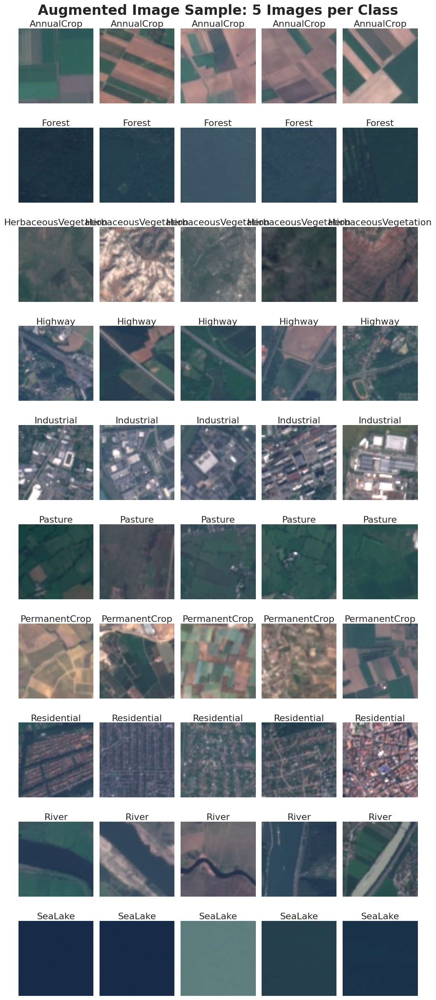

In [22]:
fig, axes = plt.subplots(10, 5, figsize=(10, 25))

n_classes = 10
n_samples = 5

for class_idx in range(n_classes):
    class_mask = y_train_balanced == class_idx
    class_images = X_train_balanced[class_mask]
    
    sample_indices = np.random.choice(len(class_images), size=min(n_samples, len(class_images)), replace=False)
    
    for col, sample_idx in enumerate(sample_indices):
        ax = axes[class_idx, col]
        ax.set_title(class_names[class_idx], fontsize=16, pad=3)
        ax.imshow(class_images[sample_idx])
        ax.axis('off')
        
plt.tight_layout(rect=[0, 0, 1, 0.975])
fig.suptitle('Augmented Image Sample: 5 Images per Class', fontsize=24, fontweight="bold")
plt.show()

In [36]:
# Train model with balanced dataset
print("Training CNN with Balanced Dataset + Data Augmentation")

model_augmented = build_l2_model(
    best_depth,
    best_width,
    len(class_names),
    dropout_rate=best_dropout,
    l2_strength=best_l2,
    base_filters=best_filter,
)

print(f"\nArchitecture Summary:")
model_augmented.summary()

# Train and evaluate
result_augmented = evaluate_model(
    model_augmented,
    X_train_balanced,
    X_val,
    y_train_balanced,
    y_val,
    "CNN with Data Augmentation",
    epochs=30,
)

print("Data Augmentation Results:")
print(f"  F1-Score (validation)  : {result_augmented['f1']:.4f}")
print(f"  Accuracy (validation)  : {result_augmented['accuracy']:.4f}")

Training CNN with Balanced Dataset + Data Augmentation

Architecture Summary:


Model: "l2_model_l21e-05"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training CNN with Data Augmentation...
Epoch 1/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - f1_score: 0.6490 - loss: 1.0184 - val_f1_score: 0.7386 - val_loss: 0.8103
Epoch 2/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/step - f1_score: 0.7762 - loss: 0.6806 - val_f1_score: 0.7695 - val_loss: 0.6804
Epoch 3/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - f1_score: 0.8260 - loss: 0.5419 - val_f1_score: 0.8024 - val_loss: 0.6277
Epoch 4/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - f1_score: 0.8444 - loss: 0.4886 - val_f1_score: 0.8870 - val_loss: 0.3721
Epoch 5/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - f1_score: 0.8728 - loss: 0.4126 - val_f1_score: 0.8968 - val_loss: 0.3308
Epoch 6/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - f1_score: 0.8876 - loss: 0.3701 - val_f1_score: 0.8030 - val_loss: 0.5462
Epoch 7/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - f1_score: 0.8926 - loss: 0.3540 - val_f1_score: 0.8868 - val_loss: 0.3631
Epoch 8/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/s

### Experiment 6: Results Summary

In [37]:
augmentation_summary = pd.DataFrame(
    {   
        "Model": [result_augmented["model_name"], "CNN w/o Data Augmentation"],
        "Val Accuracy": [result_augmented["accuracy"], best_l2_accuracy],
        "Val Precision": [result_augmented["precision"], best_l2_precision],
        "Val Recall": [result_augmented["recall"], best_l2_recall],
        "Val F1-Score": [result_augmented["f1"], best_l2_f1],
        "Train Time (s)": [result_augmented["train_time"], best_l2_train_time],
        "Predict Time (s)": [result_augmented["predict_time"], best_l2_predict_time],
    }, 
    index=[0, 1]
)

print("Experiment 6: Data Augmentation")
display(augmentation_summary)

Experiment 6: Data Augmentation


,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,CNN with Data Augmentation,0.95584,0.956818,0.95584,0.955977,380.085061,3.170922
1,CNN w/o Data Augmentation,0.95090,0.951300,0.95090,0.950900,285.280000,2.630000


In [38]:
# Save Experiment 6 results to CSV
augmentation_summary.to_csv("results/results_experiment6_augmentation.csv", index=False)
print("\nResults saved to: results_experiment6_augmentation.csv")


Results saved to: results_experiment6_augmentation.csv


In [39]:
# Calculate improvement
f1_improvement = (result_augmented["f1"] - best_l2_f1) * 100

print(f"\nImprovement with Data Augmentation:")
print(f"  F1-Score improvement   : {f1_improvement:+.2f}%")


Improvement with Data Augmentation:
  F1-Score improvement   : +0.51%


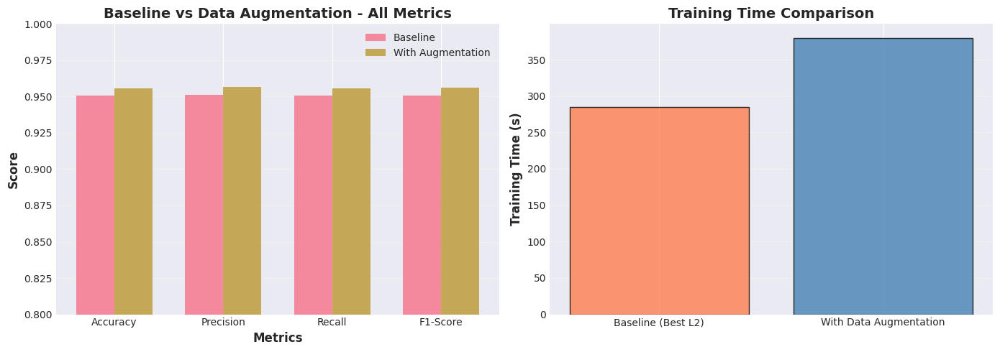

In [40]:
# Visualize comparison between baseline and augmented model
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

models = ["Baseline (Best L2)", "With Data Augmentation"]
metrics_names = ["Accuracy", "Precision", "Recall", "F1-Score"]

baseline_metrics = [
    best_l2_accuracy,
    best_l2_precision,
    best_l2_recall,
    best_l2_f1,
]

augmented_metrics = [
    result_augmented["accuracy"],
    result_augmented["precision"],
    result_augmented["recall"],
    result_augmented["f1"],
]

# Metrics comparison
x = np.arange(len(metrics_names))
width = 0.35
axes[0].bar(x - width / 2, baseline_metrics, width, label="Baseline", alpha=0.8)
axes[0].bar(
    x + width / 2, augmented_metrics, width, label="With Augmentation", alpha=0.8
)
axes[0].set_xlabel("Metrics", fontsize=12, fontweight="bold")
axes[0].set_ylabel("Score", fontsize=12, fontweight="bold")
axes[0].set_title(
    "Baseline vs Data Augmentation - All Metrics", fontsize=14, fontweight="bold"
)
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics_names)
axes[0].legend()
axes[0].grid(axis="y", alpha=0.3)
axes[0].set_ylim([0.8, 1.0])

# Training time comparison
train_times = [best_l2_train_time, result_augmented["train_time"]]
axes[1].bar(
    models, train_times, color=["coral", "steelblue"], edgecolor="black", alpha=0.8
)
axes[1].set_ylabel("Training Time (s)", fontsize=12, fontweight="bold")
axes[1].set_title("Training Time Comparison", fontsize=14, fontweight="bold")
axes[1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Training Curves - Baseline (Best L2 Model):


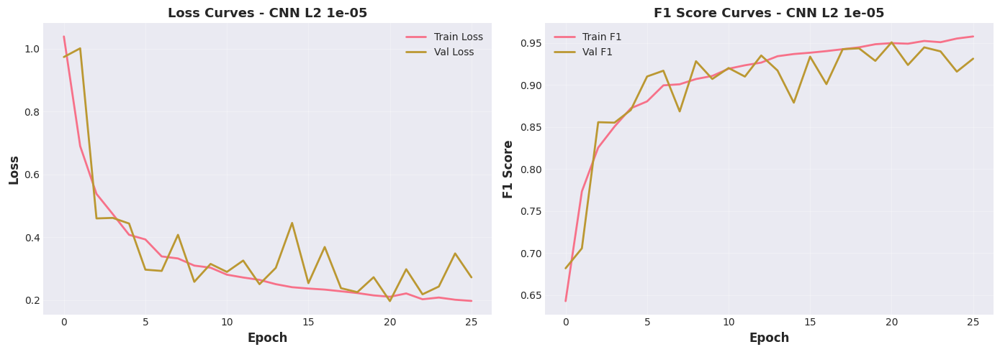


Training Curves - With Data Augmentation:


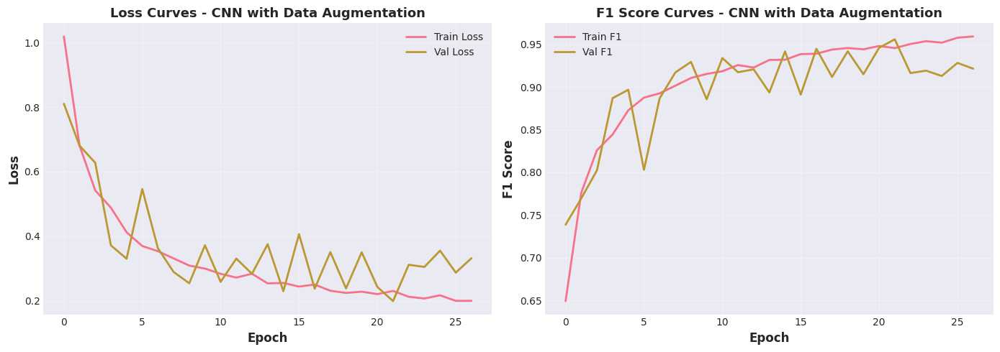

In [43]:
# Training curves comparison
print("\nTraining Curves - Baseline (Best L2 Model):")
plot_training_curves(
    best_l2_history, best_l2_model_name
)

print("\nTraining Curves - With Data Augmentation:")
plot_training_curves(result_augmented["history"], result_augmented["model_name"])

In [44]:
augmented_f1 = result_augmented["f1"]
baseline_f1 = best_l2_f1

print("Data Augmentation Comparison:")
print(f"  Baseline F1            : {baseline_f1:.4f}")
print(f"  Augmented F1           : {augmented_f1:.4f}")

Data Augmentation Comparison:
  Baseline F1            : 0.9509
  Augmented F1           : 0.9560


In [51]:
augmented_f1 = 0.9560

In [45]:
X_train = X_train_balanced
y_train = y_train_balanced

## Experiment 7: Batch Size

Investigating the impact of different batch sizes on model performance.

Using the optimal architecture from previous experiments, testting different batch sizes: **16, 32 and 64**. Using the best hyperparameters found in previous experiments.

In [46]:
def build_batch_size_model(
    num_blocks,
    convs_per_block,
    num_classes,
    dropout_rate,
    l2_strength,
    base_filters,
    batch_size,
):
    """
    Build a CNN for batch size experiments.
    Doubles the number of filters after each MaxPooling layer.

    Args:
        num_blocks: Number of blocks
        convs_per_block: Number of Conv2D layers per block
        num_classes: Number of output classes
        dropout_rate: Dropout rate
        l2_strength: L2 regularization strength
        base_filters: Base number of filters in the first block
        batch_size: Batch size (used for model naming)

    Returns:
        Keras model (uncompiled)
    """
    model = keras.Sequential(name=f"batch_model_{batch_size}")
    model.add(keras.layers.Input(shape=(64, 64, 3)))

    for block in range(num_blocks):
        # Calculate number of filters for this block (doubles after each pooling)
        current_filters = base_filters * (2**block)

        for conv in range(convs_per_block):
            # Batch Normalization before convolution
            model.add(
                keras.layers.BatchNormalization(
                    name=f"block{block+1}_conv{conv+1}_bn_pre"
                )
            )
            # Convolutional layer
            model.add(
                keras.layers.Conv2D(
                    current_filters,
                    (3, 3),
                    activation="elu",
                    padding="same",
                    kernel_initializer="he_normal",
                    kernel_regularizer=keras.regularizers.l2(l2_strength),
                    name=f"block{block+1}_conv{conv+1}",
                )
            )
            # Batch Normalization after convolution
            model.add(
                keras.layers.BatchNormalization(
                    name=f"block{block+1}_conv{conv+1}_bn_post"
                )
            )

        # MaxPooling after each block
        model.add(
            keras.layers.MaxPooling2D(pool_size=(2, 2), name=f"block{block+1}_maxpool")
        )
        # Dropout after each block
        model.add(keras.layers.Dropout(dropout_rate, name=f"block{block+1}_dropout"))

    # Flatten and Dense layers
    model.add(keras.layers.Flatten(name="flatten"))
    model.add(
        keras.layers.Dense(
            128,
            activation="elu",
            kernel_regularizer=keras.regularizers.l2(l2_strength),
            name="dense_1",
        )
    )
    model.add(keras.layers.BatchNormalization(name="dense_1_bn"))
    model.add(
        keras.layers.Dense(
            128,
            activation="elu",
            kernel_regularizer=keras.regularizers.l2(l2_strength),
            name="dense_2",
        )
    )
    model.add(keras.layers.Dropout(dropout_rate, name="dense_dropout"))
    model.add(keras.layers.Dense(num_classes, activation="softmax", name="output"))
    
    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=[SparseF1Score(num_classes=num_classes, average="weighted")],
    )

    return model

In [47]:
# Test different batch sizes
batch_size_configs = [16, 32, 64]
batch_size_results = []

print(
    f"Using optimal architecture: {best_depth} blocks, {best_width} convs/block, {best_filter} base filters"
)
print(f"Using best dropout: {best_dropout}, best L2: {best_l2}")

for batch_size in batch_size_configs:
    print(f"\nTesting CNN with batch size: {batch_size}")

    # Build model with proper naming
    model = build_batch_size_model(
        best_depth,
        best_width,
        len(class_names),
        dropout_rate=best_dropout,
        l2_strength=best_l2,
        base_filters=best_filter,
        batch_size=batch_size,
    )

    # Evaluate model with specific batch size
    result = evaluate_model(
        model,
        X_train,
        X_val,
        y_train,
        y_val,
        model_name=f"CNN Batch {batch_size}",
        batch_size=batch_size,
        epochs=30,
    )

    # Add batch_size to result dictionary
    result["batch_size"] = batch_size
    batch_size_results.append(result)
    
    del model
    tf.keras.backend.clear_session()
    gc.collect()

Using optimal architecture: 4 blocks, 4 convs/block, 16 base filters
Using best dropout: 0.2, best L2: 1e-05

Testing CNN with batch size: 16

Training CNN Batch 16...
Epoch 1/30
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 48s 20ms/step - f1_score: 0.5884 - loss: 1.1956 - val_f1_score: 0.7863 - val_loss: 0.6399
Epoch 2/30
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 18s 13ms/step - f1_score: 0.7307 - loss: 0.8050 - val_f1_score: 0.8042 - val_loss: 0.5671
Epoch 3/30
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - f1_score: 0.7948 - loss: 0.6458 - val_f1_score: 0.8403 - val_loss: 0.5119
Epoch 4/30
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 24s 12ms/step - f1_score: 0.8214 - loss: 0.5663 - val_f1_score: 0.8710 - val_loss: 0.4001
Epoch 5/30
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - f1_score: 0.8471 - loss: 0.5046 - val_f1_score: 0.8989 - val_loss: 0.3380
Epoch 6/30
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 17s 12ms/step - f1_score: 0.8636 - loss: 0.4625 - val_f1_score: 0.8854 - val_loss: 0.4134
Epoch 7/30
1407/1407 ━━━━━━━━━━━━━━━━━━━

2026-01-11 16:27:30.786168: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:27:31.388731: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_10743', 520 bytes spill stores, 520 bytes spill loads



704/704 ━━━━━━━━━━━━━━━━━━━━ 46s 38ms/step - f1_score: 0.6477 - loss: 1.0292 - val_f1_score: 0.7578 - val_loss: 0.7653
Epoch 2/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - f1_score: 0.7709 - loss: 0.6965 - val_f1_score: 0.7972 - val_loss: 0.6054
Epoch 3/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - f1_score: 0.8127 - loss: 0.5842 - val_f1_score: 0.8610 - val_loss: 0.4335
Epoch 4/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/step - f1_score: 0.8382 - loss: 0.5049 - val_f1_score: 0.8695 - val_loss: 0.4123
Epoch 5/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 11s 16ms/step - f1_score: 0.8604 - loss: 0.4456 - val_f1_score: 0.8345 - val_loss: 0.5560
Epoch 6/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - f1_score: 0.8730 - loss: 0.4158 - val_f1_score: 0.8835 - val_loss: 0.3793
Epoch 7/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 11s 16ms/step - f1_score: 0.8864 - loss: 0.3738 - val_f1_score: 0.8966 - val_loss: 0.3396
Epoch 8/30
704/704 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - f1_score: 0.8951 - loss: 0.3523 - val_f1_scor

2026-01-11 16:32:48.896652: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:32:48.896726: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:32:48.896784: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:32:50.188067: I external/l

350/352 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - f1_score: 0.5572 - loss: 1.2857

2026-01-11 16:33:14.275779: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:33:14.275853: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:33:14.275894: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:33:14.275902: I external/l

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - f1_score: 0.5578 - loss: 1.2840

2026-01-11 16:33:28.783328: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:33:29.041233: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_964', 4 bytes spill stores, 4 bytes spill loads

2026-01-11 16:33:29.051806: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_955', 8 bytes spill stores, 8 bytes spill loads

2026-01-11 16:33:29.287077: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_955', 28 bytes spi

352/352 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - f1_score: 0.6567 - loss: 0.9883 - val_f1_score: 0.6831 - val_loss: 1.0691
Epoch 2/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - f1_score: 0.7880 - loss: 0.6396 - val_f1_score: 0.8195 - val_loss: 0.6264
Epoch 3/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - f1_score: 0.8422 - loss: 0.4936 - val_f1_score: 0.7725 - val_loss: 0.7554
Epoch 4/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - f1_score: 0.8701 - loss: 0.4070 - val_f1_score: 0.9086 - val_loss: 0.3115
Epoch 5/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - f1_score: 0.8859 - loss: 0.3670 - val_f1_score: 0.8721 - val_loss: 0.4627
Epoch 6/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - f1_score: 0.9005 - loss: 0.3211 - val_f1_score: 0.9011 - val_loss: 0.3264
Epoch 7/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - f1_score: 0.9041 - loss: 0.3095 - val_f1_score: 0.9033 - val_loss: 0.3041
Epoch 8/30
352/352 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - f1_score: 0.9135 - loss: 0.2835 - val_f1_score: 0.

### Experiment 7: Results Summary

In [48]:
# Compare batch size experiment results in a table
batch_size_summary = pd.DataFrame(
    {
        "Batch Size": [r["batch_size"] for r in batch_size_results],
        "Model": [r["model_name"] for r in batch_size_results],
        "Val Accuracy": [f"{r['accuracy']:.4f}" for r in batch_size_results],
        "Val Precision": [f"{r['precision']:.4f}" for r in batch_size_results],
        "Val Recall": [f"{r['recall']:.4f}" for r in batch_size_results],
        "Val F1-Score": [f"{r['f1']:.4f}" for r in batch_size_results],
        "Train Time (s)": [f"{r['train_time']:.2f}" for r in batch_size_results],
        "Predict Time (s)": [f"{r['predict_time']:.2f}" for r in batch_size_results],
    }
)

print("Experiment 7: Batch Size Optimization Results")
display(batch_size_summary)

Experiment 7: Batch Size Optimization Results


,Batch Size,Model,Val Accuracy,Val Precision,Val Recall,Val F1-Score,Train Time (s),Predict Time (s)
0,16,CNN Batch 16,0.9494,0.9509,0.9494,0.9494,530.69,3.09
1,32,CNN Batch 32,0.9441,0.9447,0.9441,0.9439,308.09,6.83
2,64,CNN Batch 64,0.9484,0.9490,0.9484,0.9482,219.44,3.47


In [49]:
# Save Experiment 7 results to CSV
batch_size_summary.to_csv("results/results_experiment7_batch_size.csv", index=False)
print("\nResults saved to: results_experiment7_batch_size.csv")


Results saved to: results_experiment7_batch_size.csv


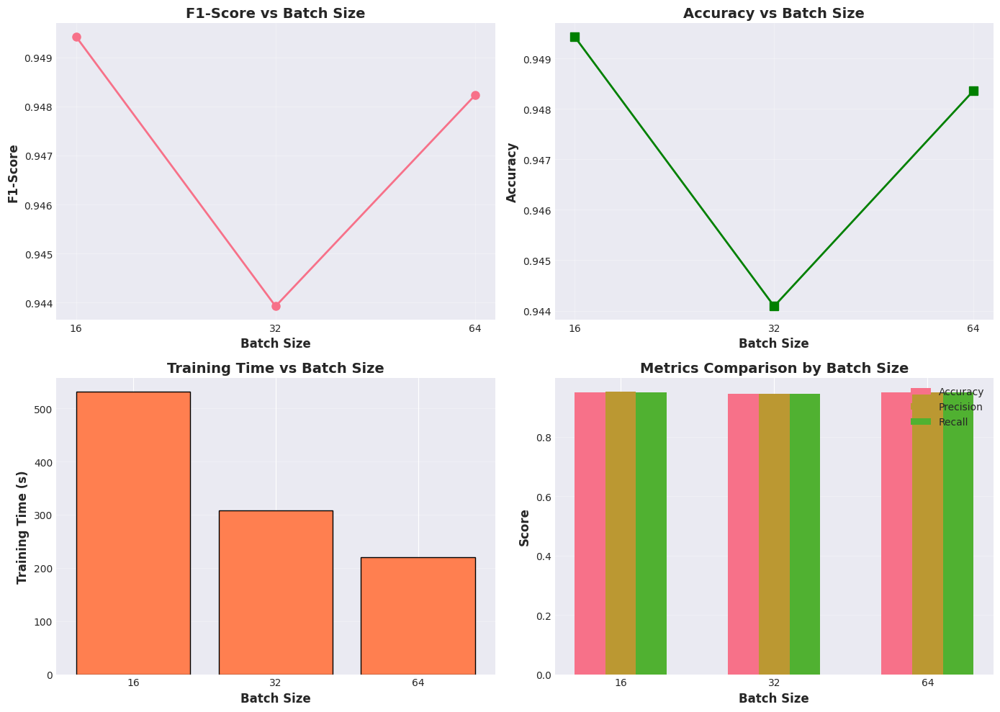

In [50]:
# Visualize batch size experiment results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

batch_sizes = [r["batch_size"] for r in batch_size_results]
batch_f1 = [r["f1"] for r in batch_size_results]
batch_accuracy = [r["accuracy"] for r in batch_size_results]
batch_train_time = [r["train_time"] for r in batch_size_results]

# F1-Score vs Batch Size
axes[0, 0].plot(
    batch_sizes,
    batch_f1,
    marker="o",
    linewidth=2,
    markersize=8,
)
axes[0, 0].set_xlabel("Batch Size", fontsize=12, fontweight="bold")
axes[0, 0].set_ylabel("F1-Score", fontsize=12, fontweight="bold")
axes[0, 0].set_title("F1-Score vs Batch Size", fontsize=14, fontweight="bold")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].set_xscale("log", base=2)
axes[0, 0].set_xticks(batch_sizes)
axes[0, 0].set_xticklabels(batch_sizes)

# Accuracy vs Batch Size
axes[0, 1].plot(
    batch_sizes,
    batch_accuracy,
    marker="s",
    linewidth=2,
    markersize=8,
    color="green",
)
axes[0, 1].set_xlabel("Batch Size", fontsize=12, fontweight="bold")
axes[0, 1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
axes[0, 1].set_title("Accuracy vs Batch Size", fontsize=14, fontweight="bold")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].set_xscale("log", base=2)
axes[0, 1].set_xticks(batch_sizes)
axes[0, 1].set_xticklabels(batch_sizes)

# Training Time vs Batch Size
x_pos = np.arange(len(batch_sizes))
axes[1, 0].bar(
    x_pos,
    batch_train_time,
    color="coral",
    edgecolor="black",
)
axes[1, 0].set_xlabel("Batch Size", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Training Time (s)", fontsize=12, fontweight="bold")
axes[1, 0].set_title("Training Time vs Batch Size", fontsize=14, fontweight="bold")
axes[1, 0].grid(axis="y", alpha=0.3)
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(batch_sizes)

# All metrics comparison
x = np.arange(len(batch_sizes))
width = 0.2
axes[1, 1].bar(x - width, batch_accuracy, width, label="Accuracy")
axes[1, 1].bar(
    x, [r["precision"] for r in batch_size_results], width, label="Precision"
)
axes[1, 1].bar(
    x + width, [r["recall"] for r in batch_size_results], width, label="Recall"
)
axes[1, 1].set_xlabel("Batch Size", fontsize=12, fontweight="bold")
axes[1, 1].set_ylabel("Score", fontsize=12, fontweight="bold")
axes[1, 1].set_title("Metrics Comparison by Batch Size", fontsize=14, fontweight="bold")
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(batch_sizes)
axes[1, 1].legend()
axes[1, 1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


Training Curves for: CNN Batch 16


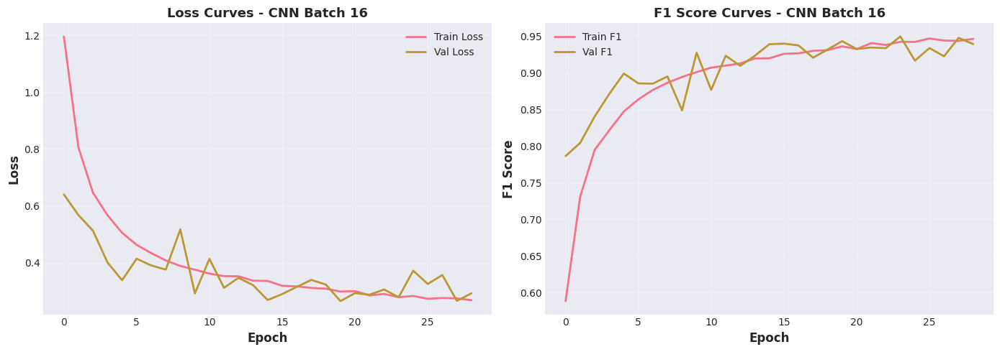


Training Curves for: CNN Batch 32


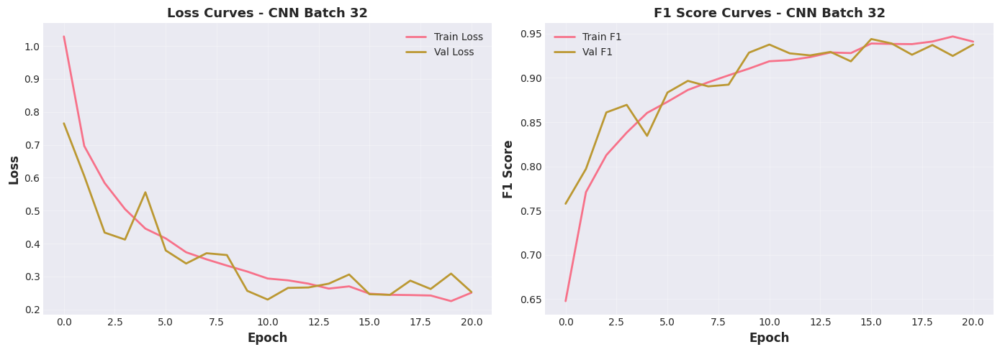


Training Curves for: CNN Batch 64


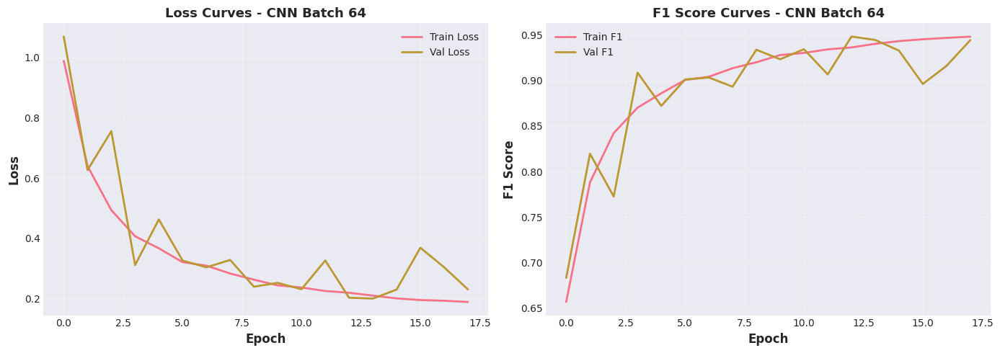

In [51]:
# Training curves for all batch size configurations
for result in batch_size_results:
    print(f"\nTraining Curves for: {result['model_name']}")
    plot_training_curves(result["history"], result["model_name"])

In [55]:
best_batch_size = 16
best_batch_f1 = 0.9494

In [53]:
print(f"\nBest batch size        : {best_batch_size}")
print(f"Best F1-Score          : {best_batch_f1:.4f}")
print(f"This batch size provides optimal training efficiency and performance.")


Best batch size        : 16
Best F1-Score          : 0.9494
This batch size provides optimal training efficiency and performance.


## Best Model Selection and Final Evaluation

Now we select the best model from all experiments (1-7) and evaluate it on the test set.

In [54]:
# Summary of best hyperparameters from all experiments
print("Best Hyperparameters from All Experiments")
print(f"\nExperiment 1 - Network Depth:")
print(f"  Best depth: {best_depth} block(s)")
print(f"  F1-Score: {best_depth_f1:.4f}")

print(f"\nExperiment 2 - Block Width:")
print(f"  Best width: {best_width} Conv2D layer(s) per block")
print(f"  F1-Score: {best_width_f1:.4f}")

print(f"\nExperiment 3 - Filter Count:")
print(f"  Best base filters: {best_filter}")
print(f"  F1-Score: {best_filter_f1:.4f}")

print(f"\nExperiment 4 - Dropout Rate:")
print(f"  Best dropout: {best_dropout}")
print(f"  F1-Score: {best_dropout_f1:.4f}")

print(f"\nExperiment 5 - L2 Regularization:")
print(f"  Best L2 strength: {best_l2}")
print(f"  F1-Score: {best_l2_f1:.4f}")

print(f"\nExperiment 6 - Data Augmentation:")
print(f"  Augmented model F1-Score: {augmented_f1:.4f}")

print(f"\nExperiment 7 - Batch Size:")
print(f"  Best batch size: {best_batch_size}")
print(f"  F1-Score: {best_batch_f1:.4f}")

# Determine if augmentation improved results
use_augmentation = augmented_f1 > best_l2_f1

Best Hyperparameters from All Experiments

Experiment 1 - Network Depth:
  Best depth: 4 block(s)
  F1-Score: 0.8932

Experiment 2 - Block Width:
  Best width: 4 Conv2D layer(s) per block
  F1-Score: 0.9285

Experiment 3 - Filter Count:
  Best base filters: 16
  F1-Score: 0.9437

Experiment 4 - Dropout Rate:
  Best dropout: 0.2
  F1-Score: 0.9580

Experiment 5 - L2 Regularization:
  Best L2 strength: 1e-05
  F1-Score: 0.9509

Experiment 6 - Data Augmentation:
  Augmented model F1-Score: 0.9560

Experiment 7 - Batch Size:
  Best batch size: 16
  F1-Score: 0.9494


In [5]:
best_depth = 4
best_width = 4
best_filter = 16
best_dropout = 0.2
best_l2 = 1e-5
best_batch_size = 16
use_augmentation = True

In [55]:
print("Final Optimal Configuration:")
print(f"  Network depth    : {best_depth} block(s)")
print(f"  Block width      : {best_width} Conv2D layer(s) per block")
print(f"  Base filters     : {best_filter}")
print(f"  Dropout rate     : {best_dropout}")
print(f"  L2 strength      : {best_l2}")
print(f"  Batch size       : {best_batch_size}")
print(f"  Use augmentation : {use_augmentation}")

Final Optimal Configuration:
  Network depth    : 4 block(s)
  Block width      : 4 Conv2D layer(s) per block
  Base filters     : 16
  Dropout rate     : 0.2
  L2 strength      : 1e-05
  Batch size       : 16
  Use augmentation : True


In [7]:
def load_eurosat_dataset(data_dir="data"):
    data_path = Path(data_dir)

    # Get all class directories
    class_dirs = [d for d in data_path.iterdir() if d.is_dir()]
    class_names = sorted([d.name for d in class_dirs])

    print(f"Found {len(class_names)} classes: {class_names}")

    images = []
    labels = []

    # Load images from each class
    for class_idx, class_name in enumerate(class_names):
        class_path = data_path / class_name
        image_files = list(class_path.glob("*.jpg")) + list(class_path.glob("*.png"))

        print(f"Loading {len(image_files)} images from {class_name}...")

        for img_path in image_files:
            try:
                # Load image
                img = Image.open(img_path)
                img_array = np.array(img)

                # Store image and label
                images.append(img_array)
                labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    # Convert to numpy arrays
    data = np.array(images)
    labels = np.array(labels)

    print(f"\nDataset loaded successfully!")
    print(f"Total images           : {len(data)}")
    print(f"Data shape             : {data.shape}")
    print(f"Labels shape           : {labels.shape}")

    return data, labels, class_names


# Load the dataset
data, labels, class_names = load_eurosat_dataset("data")

# Normalize pixel values to [0, 1]
X = data.astype("float32") / 255.0
y = labels

print(f"Data shape             : {X.shape}")
print(f"Data dtype             : {X.dtype}")
print(f"Data range             : [{X.min():.2f}, {X.max():.2f}]")
print(f"Number of classes      : {len(class_names)}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.13, random_state=42, stratify=y_train
)

print(f"\nTraining set size      : {X_train.shape[0]} samples")
print(f"Validation set size    : {X_val.shape[0]} samples")
print(f"Test set size          : {X_test.shape[0]} samples")
print(f"Image shape            : {X_train.shape[1:]}")
print(f"Number of classes      : {len(class_names)}")

Found 10 classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
Loading 3000 images from AnnualCrop...
Loading 3000 images from Forest...
Loading 3000 images from HerbaceousVegetation...
Loading 2500 images from Highway...
Loading 2500 images from Industrial...
Loading 2000 images from Pasture...
Loading 2500 images from PermanentCrop...
Loading 3000 images from Residential...
Loading 2500 images from River...
Loading 3000 images from SeaLake...

Dataset loaded successfully!
Total images           : 27000
Data shape             : (27000, 64, 64, 3)
Labels shape           : (27000,)
Data shape             : (27000, 64, 64, 3)
Data dtype             : float32
Data range             : [0.00, 1.00]
Number of classes      : 10

Training set size      : 18792 samples
Validation set size    : 2808 samples
Test set size          : 5400 samples
Image shape            : (64, 64, 3)
Number of classes      :

In [13]:
# Train best model configuration on full training data (including validation)
print("Training Final Model with Best Hyperparameters")

# Combine training and validation sets
X_train_full = np.concatenate([X_train, X_val])
y_train_full = np.concatenate([y_train, y_val])

print(f"\nFull training set size: {X_train_full.shape[0]} samples")
print(f"\nUsing best batch size from Experiment 7: {best_batch_size}")

# Apply augmentation if it improved results
if use_augmentation:
    print("\nUsing balanced dataset with augmentation (improved results in Experiment 6)...")
    X_train_final, y_train_final = balance_dataset(
        X_train_full, y_train_full, target_samples=2500
    )

    # Shuffle
    indices = np.random.permutation(len(X_train_final))
    X_train_final = X_train_final[indices]
    y_train_final = y_train_final[indices]
else:
    print("\nUsing original dataset (augmentation did not improve results)...")
    X_train_final = X_train_full
    y_train_final = y_train_full

# Build final model with best hyperparameters from all experiments
print(f"\nBuilding model with best hyperparameters:")
print(f"  - Depth: {best_depth} blocks")
print(f"  - Width: {best_width} convs/block")
print(f"  - Base filters: {best_filter}")
print(f"  - Dropout: {best_dropout}")
print(f"  - L2 strength: {best_l2}")

final_model = build_l2_model(
    best_depth,
    best_width,
    len(class_names),
    dropout_rate=best_dropout,
    l2_strength=best_l2,
    base_filters=best_filter,
)

print(f"\nFinal Model Architecture:")
final_model.summary()

# Train without validation split (using all training data)
print(f"\nTraining final model with batch size {best_batch_size}...")
early_stopping = keras.callbacks.EarlyStopping(
    monitor="loss",
    patience=5,
    restore_best_weights=True,
    mode="min",
    verbose=1,
)

history_final = final_model.fit(
    X_train_final,
    y_train_final,
    batch_size=best_batch_size,
    epochs=20,
    callbacks=[early_stopping],
    verbose=1,
)

print(f"\nFinal model training complete!")

Training Final Model with Best Hyperparameters

Full training set size: 21600 samples

Using best batch size from Experiment 7: 16

Using balanced dataset with augmentation (improved results in Experiment 6)...

Balancing dataset to 2500 samples per class...

Original class distribution:
  Class 0 (AnnualCrop          ):  2400 samples
  Class 1 (Forest              ):  2400 samples
  Class 2 (HerbaceousVegetation):  2400 samples
  Class 3 (Highway             ):  2000 samples
  Class 4 (Industrial          ):  2000 samples
  Class 5 (Pasture             ):  1600 samples
  Class 6 (PermanentCrop       ):  2000 samples
  Class 7 (Residential         ):  2400 samples
  Class 8 (River               ):  2000 samples
  Class 9 (SeaLake             ):  2400 samples

Augmenting class 0 (AnnualCrop): adding 100 samples

Augmenting class 1 (Forest): adding 100 samples

Augmenting class 2 (HerbaceousVegetation): adding 100 samples

Augmenting class 3 (Highway): adding 500 samples

Augmenting clas

Model: "l2_model_l21e-05"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1_bn_pre             │ (None, 64, 64, 3)      │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 64, 64, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv3_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_pre             │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4 (Conv2D)           │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv4_bn_post            │ (None, 64, 64, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_maxpool (MaxPooling2D)   │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_dropout (Dropout)        │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_pre             │ (None, 32, 32, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1_bn_post            │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2_bn_pre             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 973,958 (3.72 MB)

 Trainable params: 969,856 (3.70 MB)

 Non-trainable params: 4,102 (16.02 KB)


Training final model with batch size 16...
Epoch 1/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 44s 17ms/step - f1_score: 0.5960 - loss: 1.1678
Epoch 2/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - f1_score: 0.7336 - loss: 0.7984
Epoch 3/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - f1_score: 0.7856 - loss: 0.6700
Epoch 4/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - f1_score: 0.8148 - loss: 0.5806
Epoch 5/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 18s 12ms/step - f1_score: 0.8467 - loss: 0.5137
Epoch 6/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - f1_score: 0.8621 - loss: 0.4715
Epoch 7/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - f1_score: 0.8737 - loss: 0.4397
Epoch 8/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - f1_score: 0.8896 - loss: 0.4020
Epoch 9/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - f1_score: 0.8977 - loss: 0.3876
Epoch 10/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 18s 12ms/step - f1_score: 0.9043 - loss: 0.3687
Epoch 11/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - f1

In [14]:
# Evaluate final model on test set
print("Final Model Evaluation on Test Set")

# Predict on test set
y_test_pred_probs = final_model.predict(X_test, verbose=0)
y_test_pred = np.argmax(y_test_pred_probs, axis=1)

# Calculate metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, average="weighted")
test_recall = recall_score(y_test, y_test_pred, average="weighted")
test_f1 = f1_score(y_test, y_test_pred, average="weighted")

print(f"\nTest Set Performance:")
print(f"  Accuracy             : {test_accuracy:.4f}")
print(f"  Precision            : {test_precision:.4f}")
print(f"  Recall               : {test_recall:.4f}")
print(f"  F1-Score             : {test_f1:.4f}")

Final Model Evaluation on Test Set


2026-01-11 16:55:08.178935: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:55:08.822973: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_750', 36 bytes spill stores, 36 bytes spill loads

2026-01-11 16:55:14.736029: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:55:15.221855: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : 


Test Set Performance:
  Accuracy             : 0.9254
  Precision            : 0.9289
  Recall               : 0.9254
  F1-Score             : 0.9243


In [15]:
print("Classification Report (Test Set):")
print(classification_report(y_test, y_test_pred, target_names=class_names))

Classification Report (Test Set):
                      precision    recall  f1-score   support

          AnnualCrop       0.90      0.94      0.92       600
              Forest       0.97      1.00      0.99       600
HerbaceousVegetation       0.81      0.93      0.86       600
             Highway       0.95      0.95      0.95       500
          Industrial       0.99      0.75      0.86       500
             Pasture       0.94      0.96      0.95       400
       PermanentCrop       0.89      0.76      0.82       500
         Residential       0.88      0.99      0.94       600
               River       0.98      0.95      0.96       500
             SeaLake       0.98      0.98      0.98       600

            accuracy                           0.93      5400
           macro avg       0.93      0.92      0.92      5400
        weighted avg       0.93      0.93      0.92      5400



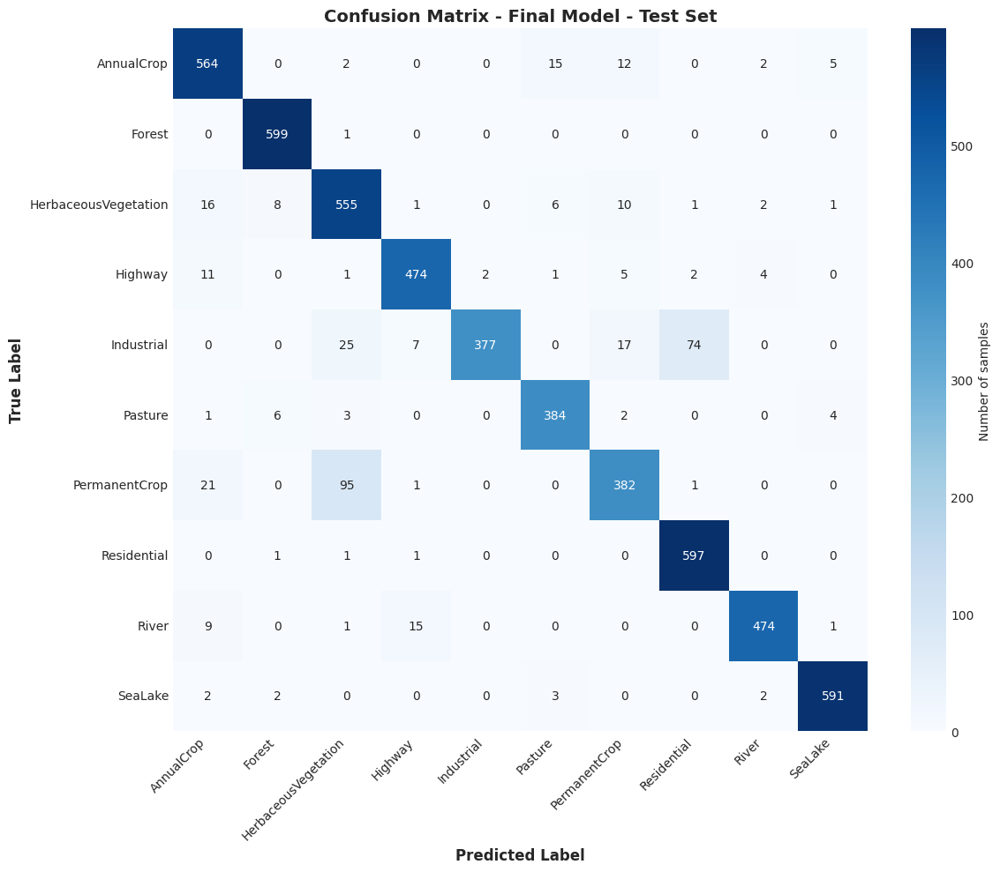

In [35]:
# Confusion matrix
cm_resnet = plot_confusion_matrix(
    y_test, y_test_pred, class_names, "Final Model - Test Set"
)

## Experiment 8: Transfer Learning

Using pre-trained models (ResNet50 and MobileNet) with transfer learning to classify EuroSAT images.

In [16]:
def evaluate_model(
    model, X_train, X_val, y_train, y_val, model_name, epochs=20, batch_size=32
):
    print(f"\nTraining {model_name}...")

    # Early stopping on validation F1 score
    early_stopping = keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        patience=10,
        restore_best_weights=True,
        mode="max",
        verbose=1,
    )

    # Train
    start_time = time.time()
    history = model.fit(
        X_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_data=(X_val, y_val),
        callbacks=[early_stopping],
        verbose=1,
    )
    train_time = time.time() - start_time

    # Predict on validation set
    start_time = time.time()
    y_pred_probs = model.predict(X_val, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    predict_time = time.time() - start_time

    # Calculate metrics
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred, average="weighted")
    recall = recall_score(y_val, y_pred, average="weighted")
    f1 = f1_score(y_val, y_pred, average="weighted")

    # Print results
    print(f"\nTraining time          : {train_time:.2f} seconds")
    print(f"Prediction time        : {predict_time:.2f} seconds")

    print(f"\nValidation Set Performance Metrics:")
    print(f"  Accuracy             : {accuracy:.4f}")
    print(f"  Precision            : {precision:.4f}")
    print(f"  Recall               : {recall:.4f}")
    print(f"  F1-Score             : {f1:.4f}")

    # Classification report
    print(f"\nClassification Report:")
    print(classification_report(y_val, y_pred, target_names=class_names))

    return {
        "model": model,
        "model_name": model_name,
        "history": history,
        "y_pred": y_pred,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "train_time": train_time,
        "predict_time": predict_time,
    }

In [17]:
def plot_training_curves(history, model_name):
    """Plot loss and Accuracy score curves for a model."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Loss curves
    axes[0].plot(history.history["loss"], label="Train Loss", linewidth=2)
    axes[0].plot(history.history["val_loss"], label="Val Loss", linewidth=2)
    axes[0].set_xlabel("Epoch", fontsize=12, fontweight="bold")
    axes[0].set_ylabel("Loss", fontsize=12, fontweight="bold")
    axes[0].set_title(f"Loss Curves - {model_name}", fontsize=13, fontweight="bold")
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # Accuracy score curves
    axes[1].plot(history.history["accuracy"], label="Train Acc", linewidth=2)
    axes[1].plot(history.history["val_accuracy"], label="Val Acc", linewidth=2)
    axes[1].set_xlabel("Epoch", fontsize=12, fontweight="bold")
    axes[1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
    axes[1].set_title(f"Accuracy Curves - {model_name}", fontsize=13, fontweight="bold")
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

In [18]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.keras.applications import ResNet50, MobileNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.mobilenet_v2 import (
    preprocess_input as mobilenet_preprocess,
)


def build_transfer_learning_model(
    base_model_name, num_classes, input_shape=(64, 64, 3)
):
    """
    Build a transfer learning model using pre-trained base models.
    Input images should be in range [0, 1] - they will be rescaled to [0, 255]
    before applying model-specific preprocessing.
    All base model layers are frozen; only the classification head is trainable.
    """

    inputs = keras.Input(shape=input_shape)
    
    # Rescale from [0, 1] to [0, 255] for preprocessing functions
    x = layers.Rescaling(255.0)(inputs)

    if base_model_name.lower() == "resnet50":
        x = layers.Lambda(resnet_preprocess, name="resnet_preprocess")(x)
        base_model = ResNet50(
            weights="imagenet",
            include_top=False,
            input_tensor=x,
            pooling="avg",
        )
        # Unfreeze only the last conv block (conv5_block3)
        last_block_prefix = "conv5_block3"

    elif base_model_name.lower() == "mobilenetv2":
        x = layers.Lambda(mobilenet_preprocess, name="mobilenet_preprocess")(x)
        base_model = MobileNetV2(
            weights="imagenet",
            include_top=False,
            input_tensor=x,
            pooling="avg",
        )
        # Unfreeze only the last block (block_16)
        last_block_prefix = "block_16"

    else:
        raise ValueError(f"Unknown base model: {base_model_name}")

    # Freeze all layers first, then unfreeze last conv block
    base_model.trainable = True
    for layer in base_model.layers:
        if layer.name.startswith(last_block_prefix):
            layer.trainable = True
        else:
            layer.trainable = False

    # Model
    x = base_model.output
    x = layers.Dense(256, activation="elu", kernel_initializer="he_normal")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)

    x = layers.Dense(256, activation="elu", kernel_initializer="he_normal")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs)

    model.compile(
        optimizer=keras.optimizers.RMSprop(learning_rate=0.0001),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )

    return model

### ResNet50 Transfer Learning

In [19]:
# Build ResNet50 model
print("Training ResNet50 Model")

resnet_model = build_transfer_learning_model(
    base_model_name="resnet50",
    num_classes=len(class_names),
    input_shape=X_train.shape[1:],
)

print(f"\nResNet50 Model Architecture:")
resnet_model.summary()

# Train ResNet50
resnet_result = evaluate_model(
    resnet_model,
    X_train,
    X_val,
    y_train,
    y_val,
    "ResNet50 Transfer Learning",
    epochs=30,
)

Training ResNet50 Model

ResNet50 Model Architecture:


Model: "functional_126"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 64, 64, 3) │          0 │ input_layer_2[0]… │
│ (Rescaling)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet_preprocess   │ (None, 64, 64, 3) │          0 │ rescaling[0][0]   │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 70, 70, 3) │          0 │ resnet_preproces… │
│ (ZeroPadding2D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 32, 32,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 32, 32,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 32, 32,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 34, 34,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 16, 16,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 16, 16,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 16, 16,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 16, 16,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 16, 16,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 16, 16,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 16, 16,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 16, 16,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 16, 16,    │     16,640 │ conv2_block1_2_r

 Total params: 24,182,666 (92.25 MB)

 Trainable params: 5,059,594 (19.30 MB)

 Non-trainable params: 19,123,072 (72.95 MB)


Training ResNet50 Transfer Learning...
Epoch 1/30


2026-01-11 16:56:40.876404: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:56:40.876497: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 16:56:41.366563: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_9480', 20 bytes spill stores, 20 bytes spill loads

2026-01-11 16:56:41.376716: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning :

585/588 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6698 - loss: 1.0803

2026-01-11 16:56:55.368755: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6199', 8 bytes spill stores, 8 bytes spill loads

2026-01-11 16:56:56.218341: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:310] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.11GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.6705 - loss: 1.0782

2026-01-11 16:57:06.600985: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1780', 8 bytes spill stores, 8 bytes spill loads

2026-01-11 16:57:06.787624: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1754', 52 bytes spill stores, 52 bytes spill loads

2026-01-11 16:57:07.350153: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:310] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.18GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


588/588 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step - accuracy: 0.7952 - loss: 0.6640 - val_accuracy: 0.9188 - val_loss: 0.2446
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.9123 - loss: 0.2796 - val_accuracy: 0.9274 - val_loss: 0.2215
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.9409 - loss: 0.1872 - val_accuracy: 0.9284 - val_loss: 0.2444
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9632 - loss: 0.1158 - val_accuracy: 0.9330 - val_loss: 0.2454
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9761 - loss: 0.0774 - val_accuracy: 0.9359 - val_loss: 0.2608
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.9812 - loss: 0.0573 - val_accuracy: 0.9348 - val_loss: 0.2587
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9883 - loss: 0.0371 - val_accuracy: 0.9256 - val_loss: 0.3199
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9906 - loss: 0.0271 - val_accuracy: 0.93

In [20]:
print("ResNet50 Validation Results:")
print(f"  F1-Score             : {resnet_result['f1']:.4f}")
print(f"  Accuracy             : {resnet_result['accuracy']:.4f}")

ResNet50 Validation Results:
  F1-Score             : 0.9432
  Accuracy             : 0.9434


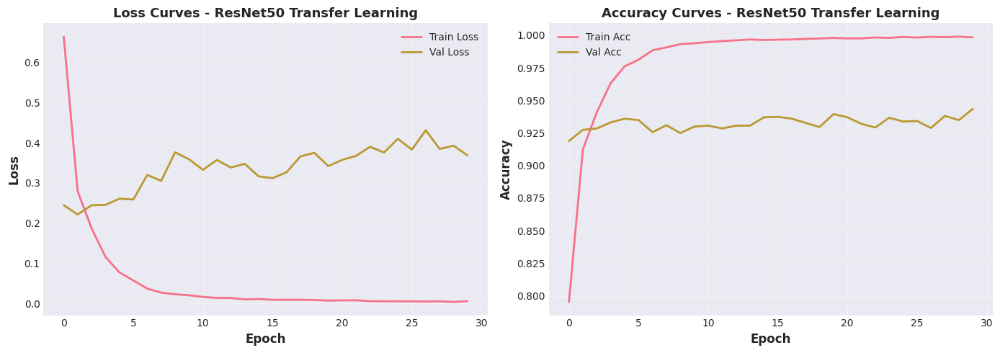

In [21]:
# Plot training curves
plot_training_curves(resnet_result["history"], "ResNet50 Transfer Learning")

In [22]:
# Evaluate ResNet50 on test set
print("ResNet50 - Test Set Evaluation")

# Predict on test set
y_test_pred_resnet_probs = resnet_model.predict(X_test, verbose=0)
y_test_pred_resnet = np.argmax(y_test_pred_resnet_probs, axis=1)

# Calculate metrics
test_accuracy_resnet = accuracy_score(y_test, y_test_pred_resnet)
test_precision_resnet = precision_score(y_test, y_test_pred_resnet, average="weighted")
test_recall_resnet = recall_score(y_test, y_test_pred_resnet, average="weighted")
test_f1_resnet = f1_score(y_test, y_test_pred_resnet, average="weighted")

print(f"\nResNet50 Test Set Performance:")
print(f"  Accuracy             : {test_accuracy_resnet:.4f}")
print(f"  Precision            : {test_precision_resnet:.4f}")
print(f"  Recall               : {test_recall_resnet:.4f}")
print(f"  F1-Score             : {test_f1_resnet:.4f}")

del resnet_model
tf.keras.backend.clear_session()
gc.collect()

ResNet50 - Test Set Evaluation

ResNet50 Test Set Performance:
  Accuracy             : 0.9435
  Precision            : 0.9436
  Recall               : 0.9435
  F1-Score             : 0.9434


0

In [23]:
print("Classification Report (Test Set):")
print(classification_report(y_test, y_test_pred_resnet, target_names=class_names))

Classification Report (Test Set):
                      precision    recall  f1-score   support

          AnnualCrop       0.94      0.95      0.95       600
              Forest       0.97      0.98      0.98       600
HerbaceousVegetation       0.93      0.93      0.93       600
             Highway       0.87      0.90      0.89       500
          Industrial       0.96      0.96      0.96       500
             Pasture       0.94      0.93      0.94       400
       PermanentCrop       0.91      0.90      0.90       500
         Residential       0.97      0.99      0.98       600
               River       0.94      0.88      0.91       500
             SeaLake       0.99      0.98      0.99       600

            accuracy                           0.94      5400
           macro avg       0.94      0.94      0.94      5400
        weighted avg       0.94      0.94      0.94      5400



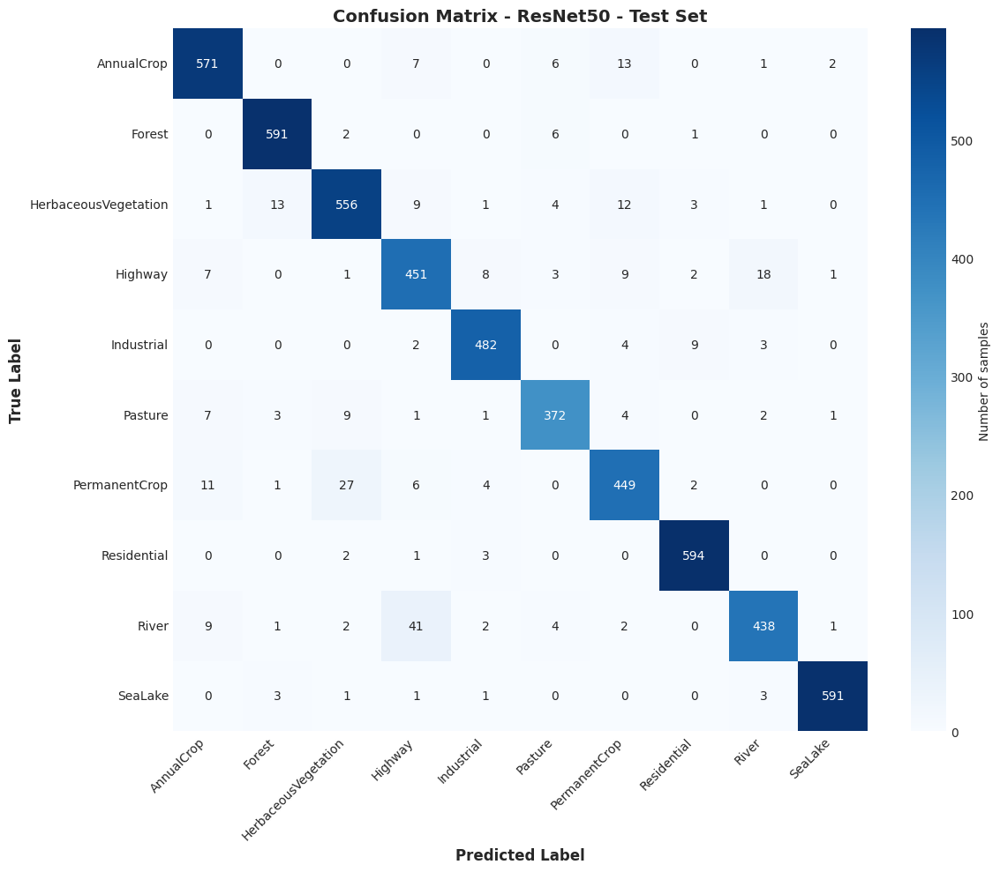

In [24]:
# Confusion matrix
cm_resnet = plot_confusion_matrix(
    y_test, y_test_pred_resnet, class_names, "ResNet50 - Test Set"
)

### MobileNetV2 Transfer Learning

In [25]:
# Build MobileNetV2 model
print("Training MobileNetV2 Transfer Learning Model")

mobilenet_model = build_transfer_learning_model(
    base_model_name="mobilenetv2",
    num_classes=len(class_names),
    input_shape=X_train.shape[1:],
)

print(f"\nMobileNetV2 Model Architecture:")
mobilenet_model.summary()

# Train MobileNetV2
mobilenet_result = evaluate_model(
    mobilenet_model,
    X_train,
    X_val,
    y_train,
    y_val,
    "MobileNetV2 Transfer Learning",
    epochs=30,
    batch_size=32,
)

Training MobileNetV2 Transfer Learning Model


/tmp/ipykernel_255461/1544165218.py:40: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(



MobileNetV2 Model Architecture:


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 64, 64, 3) │          0 │ input_layer[0][0] │
│ (Rescaling)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenet_preproce… │ (None, 64, 64, 3) │          0 │ rescaling[0][0]   │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 32, 32,    │        864 │ mobilenet_prepro… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 32, 32,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 32, 32,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 32, 32,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 32, 32,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 32, 32,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 32, 32,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 32, 32,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 33, 33,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 16, 16,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 16, 16,    │        384 │ block_1_depthwis

 Total params: 2,656,330 (10.13 MB)

 Trainable params: 871,242 (3.32 MB)

 Non-trainable params: 1,785,088 (6.81 MB)


Training MobileNetV2 Transfer Learning...
Epoch 1/30


2026-01-11 17:01:56.496329: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-01-11 17:01:56.984488: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5818', 20 bytes spill stores, 20 bytes spill loads

2026-01-11 17:01:57.145083: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5818', 520 bytes spill stores, 520 bytes spill loads

2026-01-11 17:02:02.075801: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng3{k11=2} for conv (f32[32,576,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,576,4,4]{3,2,1,

586/588 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5512 - loss: 1.4345

2026-01-11 17:02:20.298811: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng3{k11=2} for conv (f32[8,576,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,576,4,4]{3,2,1,0}, f32[576,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=576, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]} is taking a while...
2026-01-11 17:02:20.554486: E external/local_xla/xla/service/slow_operation_alarm.cc:140] The operation took 1.255794055s
Trying algorithm eng3{k11=2} for conv (f32[8,576,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,576,4,4]{3,2,1,0}, f32[576,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=576, custom_call_target="__cudnn$convForward

588/588 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5516 - loss: 1.4330

2026-01-11 17:02:36.873014: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-01-11 17:02:37.062976: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-01-11 17:02:37.249282: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-01-11 17:02:37.441218: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-01-11 17:02:37.516145: E external/local_xla/xla/service

588/588 ━━━━━━━━━━━━━━━━━━━━ 48s 51ms/step - accuracy: 0.6862 - loss: 1.0000 - val_accuracy: 0.7553 - val_loss: 0.9010
Epoch 2/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8358 - loss: 0.5251 - val_accuracy: 0.8536 - val_loss: 0.4935
Epoch 3/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8658 - loss: 0.4163 - val_accuracy: 0.8839 - val_loss: 0.4040
Epoch 4/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8851 - loss: 0.3640 - val_accuracy: 0.8800 - val_loss: 0.4256
Epoch 5/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.9018 - loss: 0.3047 - val_accuracy: 0.9056 - val_loss: 0.3348
Epoch 6/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9145 - loss: 0.2698 - val_accuracy: 0.9110 - val_loss: 0.3226
Epoch 7/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.9210 - loss: 0.2455 - val_accuracy: 0.9103 - val_loss: 0.3194
Epoch 8/30
588/588 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.9309 - loss: 0.2129 - val_accuracy: 0.9120 

In [27]:
print("MobileNetV2 Validation Results:")
print(f"  F1-Score             : {mobilenet_result['f1']:.4f}")
print(f"  Accuracy             : {mobilenet_result['accuracy']:.4f}")

MobileNetV2 Validation Results:
  F1-Score             : 0.9216
  Accuracy             : 0.9217


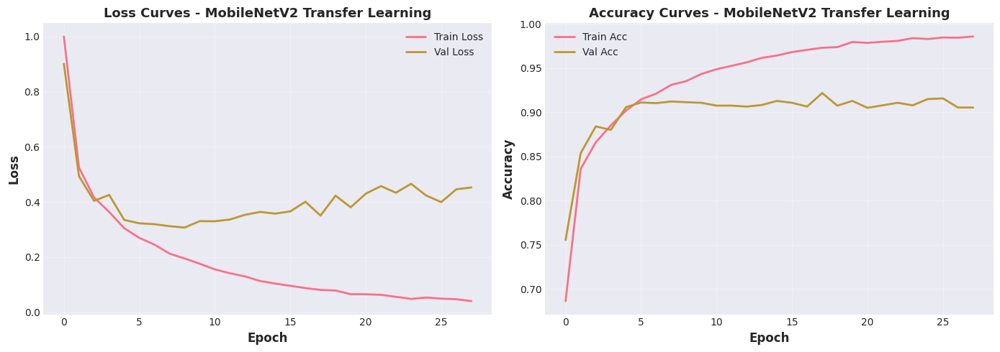

In [28]:
# Plot training curves
plot_training_curves(mobilenet_result["history"], "MobileNetV2 Transfer Learning")

In [29]:
# Evaluate MobileNetV2 on test set
print("MobileNetV2 - Test Set Evaluation")

# Predict on test set
y_test_pred_mobilenet_probs = mobilenet_model.predict(X_test, verbose=0)
y_test_pred_mobilenet = np.argmax(y_test_pred_mobilenet_probs, axis=1)

# Calculate metrics
test_accuracy_mobilenet = accuracy_score(y_test, y_test_pred_mobilenet)
test_precision_mobilenet = precision_score(
    y_test, y_test_pred_mobilenet, average="weighted"
)
test_recall_mobilenet = recall_score(y_test, y_test_pred_mobilenet, average="weighted")
test_f1_mobilenet = f1_score(y_test, y_test_pred_mobilenet, average="weighted")

print(f"\nMobileNetV2 Test Set Performance:")
print(f"  Accuracy             : {test_accuracy_mobilenet:.4f}")
print(f"  Precision            : {test_precision_mobilenet:.4f}")
print(f"  Recall               : {test_recall_mobilenet:.4f}")
print(f"  F1-Score             : {test_f1_mobilenet:.4f}")

del mobilenet_model
tf.keras.backend.clear_session()
gc.collect()

MobileNetV2 - Test Set Evaluation

MobileNetV2 Test Set Performance:
  Accuracy             : 0.9248
  Precision            : 0.9253
  Recall               : 0.9248
  F1-Score             : 0.9247


0

In [30]:
print("Classification Report (Test Set):")
print(classification_report(y_test, y_test_pred_mobilenet, target_names=class_names))

Classification Report (Test Set):
                      precision    recall  f1-score   support

          AnnualCrop       0.93      0.96      0.95       600
              Forest       0.93      0.96      0.95       600
HerbaceousVegetation       0.89      0.90      0.90       600
             Highway       0.84      0.90      0.87       500
          Industrial       0.94      0.96      0.95       500
             Pasture       0.91      0.85      0.88       400
       PermanentCrop       0.91      0.84      0.88       500
         Residential       0.95      0.97      0.96       600
               River       0.93      0.91      0.92       500
             SeaLake       0.99      0.95      0.97       600

            accuracy                           0.92      5400
           macro avg       0.92      0.92      0.92      5400
        weighted avg       0.93      0.92      0.92      5400



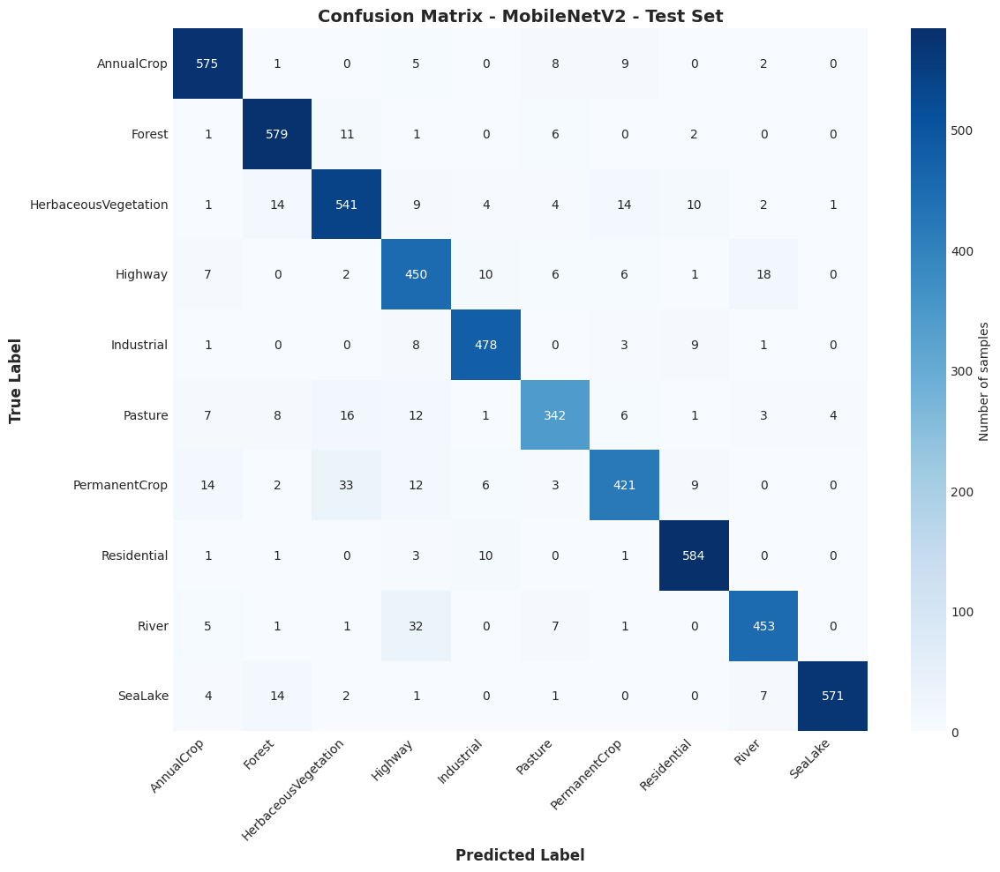

In [31]:
# Confusion matrix
cm_mobilenet = plot_confusion_matrix(
    y_test, y_test_pred_mobilenet, class_names, "MobileNetV2 - Test Set"
)

## Final Comparison: All Models on Test Set

In [32]:
# Compare all models on test set
test_comparison = pd.DataFrame(
    {
        "Model": ["Custom CNN (Best)", "ResNet50", "MobileNetV2"],
        "Test Accuracy": [
            f"{test_accuracy:.4f}",
            f"{test_accuracy_resnet:.4f}",
            f"{test_accuracy_mobilenet:.4f}",
        ],
        "Test Precision": [
            f"{test_precision:.4f}",
            f"{test_precision_resnet:.4f}",
            f"{test_precision_mobilenet:.4f}",
        ],
        "Test Recall": [
            f"{test_recall:.4f}",
            f"{test_recall_resnet:.4f}",
            f"{test_recall_mobilenet:.4f}",
        ],
        "Test F1-Score": [
            f"{test_f1:.4f}",
            f"{test_f1_resnet:.4f}",
            f"{test_f1_mobilenet:.4f}",
        ],
    }
)

print("Final Test Comparison")
display(test_comparison)

Final Test Comparison


,Model,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,Custom CNN (Best),0.9254,0.9289,0.9254,0.9243
1,ResNet50,0.9435,0.9436,0.9435,0.9434
2,MobileNetV2,0.9248,0.9253,0.9248,0.9247


In [33]:
# Save final test comparison results to CSV
test_comparison.to_csv("results/results_final_test_comparison.csv", index=False)
print("\nFinal test results saved to: results_final_test_comparison.csv")


Final test results saved to: results_final_test_comparison.csv


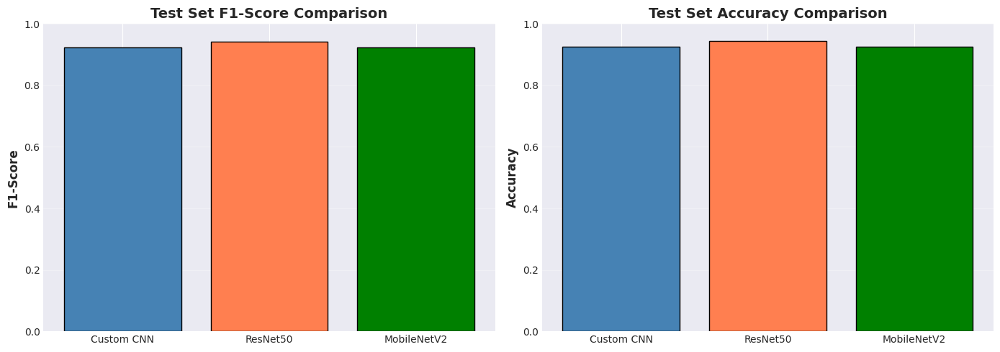

In [34]:
# Visualize comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

models = ["Custom CNN", "ResNet50", "MobileNetV2"]
test_f1_scores = [test_f1, test_f1_resnet, test_f1_mobilenet]
test_accuracies = [test_accuracy, test_accuracy_resnet, test_accuracy_mobilenet]

# F1-Score comparison
axes[0].bar(
    models, test_f1_scores, color=["steelblue", "coral", "green"], edgecolor="black"
)
axes[0].set_ylabel("F1-Score", fontsize=12, fontweight="bold")
axes[0].set_title("Test Set F1-Score Comparison", fontsize=14, fontweight="bold")
axes[0].grid(axis="y", alpha=0.3)
axes[0].set_ylim([0, 1])

# Accuracy comparison
axes[1].bar(
    models, test_accuracies, color=["steelblue", "coral", "green"], edgecolor="black"
)
axes[1].set_ylabel("Accuracy", fontsize=12, fontweight="bold")
axes[1].set_title("Test Set Accuracy Comparison", fontsize=14, fontweight="bold")
axes[1].grid(axis="y", alpha=0.3)
axes[1].set_ylim([0, 1])

plt.tight_layout()
plt.show()

## Summary of All Experiments

Complete overview of all experiments and their results.

In [56]:
print("Complete Experiment Summary - EuroSAT CNN Architecture Experiments")

print(f"\nExperiment 1: Network Depth")
print(f"  - Configurations tested: {[2, 3, 4, 5]} blocks")
print(f"  - Best configuration   : {best_depth} blocks")
print(f"  - Best val F1-Score    : {best_depth_f1:.4f}")

print(f"\nExperiment 2: Block Width")
print(f"  - Configurations tested: {[2, 3, 4]} Conv2D layers per block")
print(f"  - Best configuration   : {best_width} Conv2D layers per block")
print(f"  - Best val F1-Score    : {best_width_f1:.4f}")

print(f"\nExperiment 3: Number of Filters")
print(f"  - Configurations tested: {[16, 32, 64, 128]} base filters")
print(f"  - Best configuration   : {best_filter} base filters")
print(f"  - Best val F1-Score    : {best_filter_f1:.4f}")

print(f"\nExperiment 4: Dropout Regularization")
print(f"  - Configurations tested: {dropout_configs}")
print(f"  - Best configuration   : {best_dropout} dropout rate")
print(f"  - Best val F1-Score    : {best_dropout_f1:.4f}")

print(f"\nExperiment 5: L2 Regularization")
print(f"  - Configurations tested: {l2_configs}")
print(f"  - Best configuration   : {best_l2} L2 strength")
print(f"  - Best val F1-Score    : {best_l2_f1:.4f}")

print(f"\nExperiment 6: Data Augmentation")
print(f"  - Balanced classes to  : 3000 samples each")
print(f"  - Val F1-Score         : {augmented_f1:.4f}")

print(f"\nExperiment 7: Batch Size Optimization")
print(f"  - Configurations tested: {batch_size_configs}")
print(f"  - Best configuration   : {best_batch_size} batch size")
print(f"  - Best val F1-Score    : {best_batch_f1:.4f}")

print(f"\nExperiment 8: Transfer Learning")
print(f"  - ResNet50 val F1      : {resnet_result['f1']:.4f}")
print(f"  - MobileNetV2 val F1   : {mobilenet_result['f1']:.4f}")

Complete Experiment Summary - EuroSAT CNN Architecture Experiments

Experiment 1: Network Depth
  - Configurations tested: [2, 3, 4, 5] blocks
  - Best configuration   : 4 blocks
  - Best val F1-Score    : 0.8932

Experiment 2: Block Width
  - Configurations tested: [2, 3, 4] Conv2D layers per block
  - Best configuration   : 4 Conv2D layers per block
  - Best val F1-Score    : 0.9285

Experiment 3: Number of Filters
  - Configurations tested: [16, 32, 64, 128] base filters
  - Best configuration   : 16 base filters
  - Best val F1-Score    : 0.9437

Experiment 4: Dropout Regularization
  - Configurations tested: [0.0, 0.2, 0.4, 0.6]
  - Best configuration   : 0.2 dropout rate
  - Best val F1-Score    : 0.9580

Experiment 5: L2 Regularization
  - Configurations tested: [0.0, 1e-05, 0.0001, 0.001]
  - Best configuration   : 1e-05 L2 strength
  - Best val F1-Score    : 0.9509

Experiment 6: Data Augmentation
  - Balanced classes to  : 3000 samples each
  - Val F1-Score         : 0.9560



In [ ]:
print("Final Test Set Results")
print(f"  Custom CNN    - F1: {test_f1:.4f}, Accuracy: {test_accuracy:.4f}")
print(
    f"  ResNet50      - F1: {test_f1_resnet:.4f}, Accuracy: {test_accuracy_resnet:.4f}"
)
print(
    f"  MobileNetV2   - F1: {test_f1_mobilenet:.4f}, Accuracy: {test_accuracy_mobilenet:.4f}"
)

Final Test Set Results
  Custom CNN    - F1: 0.9243, Accuracy: 0.9254
  ResNet50      - F1: 0.9434, Accuracy: 0.9435
  MobileNetV2   - F1: 0.9247, Accuracy: 0.9248
